# **HEADERS**

In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv
/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt
/kaggle/input/house-prices-advanced-regression-techniques/train.csv
/kaggle/input/house-prices-advanced-regression-techniques/test.csv


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Re: Para texto.
import re

# Seaborn y Matplotlib: Para visualización de datos estadísticos.
import seaborn as sns
import matplotlib.pyplot as plt

# Scikit-learn: Para preprocesamiento de datos, modelado y evaluación.
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer, KNNImputer # Evaluar más adelante si conviene usar algún imputer
from sklearn.decomposition import PCA #Reducción de dimensionalidad
from sklearn.metrics import mean_squared_error, r2_score # Métricas de evaluación
from sklearn.ensemble import RandomForestRegressor # Para Feature Importance
from sklearn.inspection import permutation_importance # Para FEature IMportance

# Category Encoders: Para codificación de variables categóricas.
import category_encoders as ce

# Statsmodels: Para realizar análisis estadísticos y regresiones.
import statsmodels.api as sm

# XGBoost: Para modelos de boosting.
import xgboost as xgb

# LightGBM: Otra biblioteca para boosting de árboles.
import lightgbm as lgb

# TensorFlow/Keras: Para construir modelos de aprendizaje profundo.
import tensorflow as tf
from tensorflow import keras

# Modelos básicos
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

# Modelos avanzados
import xgboost as xgb


# **FUNCIONES NECESARIAS**

In [6]:
## Funciones_necesarias

# Visualiza la distribución
def ft_plot_distribution(df, column, sms):
    plt.figure(figsize=(12, 6))
    sns.histplot(df[column], bins=30, kde=True)
    plt.title(f'Distribución de {column} {sms}')
    plt.xlabel(f'{column}')
    plt.ylabel('Frecuencia')
    plt.show()

# Funciones para visualizar valores faltantes

def ft_heatplot_missing_values(df):
    plt.figure(figsize=(12, 6))
    sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
    plt.title('Mapa de calor de valores faltantes')
    plt.xlabel('Variables')
    plt.ylabel('Entradas')

def ft_histplot_missing_values(df):
    missing_counts = df.isnull().sum()
    missing_counts[missing_counts > 0].sort_values().plot(kind='barh', color='orange', figsize=(10, 6))
    plt.title('Conteo de valores nulos por variable')
    plt.xlabel('Número de valores faltantes')
    plt.ylabel('Variables')
    plt.show()
    plt.show()

def ft_nulbefore_vs_nulafter(imputaciones_titulos, nulbefore, nulafter):
    # Crear gráfico: Valores Nulos Antes y Después de la Imputación
    fig, ax = plt.subplots(figsize=(12, 6))

    # Crear el rango de posiciones
    x = range(len(imputaciones_titulos))

    # Crear las barras antes y después
    ax.bar(x, nulbefore, width=0.4, label='Antes de Imputación', color='orange', align='center')
    ax.bar([p + 0.4 for p in x], nulafter, width=0.4, label='Después de Imputación', color='blue', align='center')

    # Personalizar gráfico
    ax.set_xticks([p + 0.2 for p in x])
    ax.set_xticklabels(imputaciones_titulos, rotation=45)
    ax.set_title('Nul values before and after of an imputation')
    ax.set_ylabel('Number of nul values')
    ax.legend()

    # Mostrar gráfico
    plt.tight_layout()
    plt.show()

def ft_imputar_string(df, columna, valor_imputacion):
    """
    Imputa un string en los valores nulos de una columna específica del DataFrame.

    Args:
        df (pd.DataFrame): El DataFrame en el que se realizará la imputación.
        columna (str): El nombre de la columna donde se imputarán los valores.
        valor_imputacion (str): El string que se usará para imputar los valores nulos.
    """
    df[columna] = df[columna].fillna(valor_imputacion)

def ft_imputar_media(df, column):
    """
    Calcula la media de una columna específica y la imputa en los valores nulos de una columna específica del DataFrame.

    Args:
        df (pd.DataFrame): El DataFrame en el que se realizará la imputación.
        columna (str): El nombre de la columna donde se imputarán los valores.
    """
    mean = df[column].mean()
    df[column] = df[column].fillna(mean)

def ft_imputar_moda(df, column):
    """
    Calcula la moda de una columna específica y la imputa en los valores nulos de una columna específica del DataFrame.

    Args:
        df (pd.DataFrame): El DataFrame en el que se realizará la imputación.
        columna (str): El nombre de la columna donde se imputarán los valores.
    """
    mode = df[column].mode()[0]
    print(mode)
    df[column] = df[column].fillna(mode)

# Función para detectar outliers
def ft_detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = (data < lower_bound) | (data > upper_bound)
    return outliers

def ft_boxplot(df, column):
    # Ejemplo para LotArea
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=column)
    plt.title(f'Boxplot de {column}')
    plt.show()

# Gráficos de dispersión entre 'SalePrice' y cualquier columna
def ft_scatterplot_saleprice(df, column):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=column, y='SalePrice')
    plt.title(f'Relación entre {column} y SalePrice')
    plt.xlabel(column)
    plt.ylabel('SalePrice')
    plt.show()

def ft_scaterplot_multiple(df_train_train, column1, column2, column3, column4, palette):
    plt.figure(figsize=(14, 7))
    sns.scatterplot(x=column1, y=column2, hue=column3, size=column4, sizes=(20, 200), data=df_train_train, palette=palette)
    plt.title(f'{column1} vs {column2}, Diferenciado por {column3} y {column4}')
    plt.xlabel(column1)
    plt.ylabel(column2)
    plt.legend(title="legend")
    plt.show()

# 1. Espacio total de la vivienda y construcciones adicionales
def analizar_espacio_vivienda(df_train_train):
    """
    Analiza las columnas relacionadas con los espacios de vivienda y área total:
    LotArea, 1stFlrSF, 2ndFlrSF, GrLivArea, TotalBsmtSF.
    Compara con SalePrice usando un gráfico de dispersión.
    """
    columnas = ['LotArea', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'TotalBsmtSF']
    
    # Graficar la distribución de las columnas
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.histplot(df_train_train[col], kde=True)
        plt.title(f'Distribución de {col}')
        plt.show()
        
        # Comparación con SalePrice usando scatterplot
        ft_scatterplot_saleprice(df_train_train, col)

# 2. Garaje
def analizar_garaje(df_train_train):
    """
    Analiza las columnas relacionadas con el garaje y estacionamiento:
    GarageCars, GarageArea.
    Realiza un gráfico de dispersión para mostrar la relación entre estas columnas.
    """
    columnas = ['GarageCars', 'GarageArea']
    
    # Comparación de GarageCars y GarageArea con un gráfico de dispersión
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df_train_train[col], y=df_train_train['SalePrice'])
        plt.title(f'{col} vs SalePrice')
        plt.xlabel(col)
        plt.ylabel('SalePrice')
        plt.show()


# 3. Porches y terrazas
def analizar_porches_terrazas(df_train_train):
    """
    Analiza las columnas relacionadas con características exteriores y espacios adicionales:
    GarageArea, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch.
    Realiza una transformación logarítmica si es necesario y compara con SalePrice.
    """
    columnas = ['GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch']
    
    # Aplicar transformación logarítmica si es necesario y graficar
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.histplot(df_train_train[col], kde=True)
        plt.title(f'Distribución de {col}')
        plt.show()

        # Transformación logarítmica para las columnas
        if df_train_train[col].min() > 0:
            df_train_train[col] = df_train_train[col].apply(lambda x: np.log(x + 1))
            plt.figure(figsize=(8, 6))
            sns.histplot(df_train_train[col], kde=True)
            plt.title(f'Transformación Logarítmica de {col}')
            plt.show()

        # Comparar con SalePrice
        ft_scatterplot_saleprice(df_train_train, col)


# 4. Calificación o condición
def analizar_calificacion_condicion(df_train_train):
    """
    Analiza las columnas relacionadas con la calidad y condición de la propiedad:
    SalePrice, OverallQual, OverallCond.
    Realiza análisis usando boxplots y compara con SalePrice.
    """
    columnas = ['OverallQual', 'OverallCond']
    
    # Boxplots para comparar la calidad y condición con SalePrice
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df_train_train[col], y=df_train_train['SalePrice'])
        plt.title(f'{col} vs SalePrice')
        plt.show()


# 5. Columnas con valores atípicos únicos o pocos outliers
def analizar_outliers_individuales(df_train_train):
    """
    Analiza las columnas de baños y chimeneas:
    FullBath, HalfBath, BsmtFullBath, BsmtHalfBath, Fireplaces.
    Revisa la distribución y compara con SalePrice.
    """
    columnas = ['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'Fireplaces']
    
    # Graficar la distribución y comparar con SalePrice
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df_train_train[col], y=df_train_train['SalePrice'])
        plt.title(f'{col} vs SalePrice')
        plt.show()

# 6. Antigüedad y Remodelación
def analizar_antiguedad_remodelacion(df_train_train):
    """
    Analiza las columnas relacionadas con la antigüedad de la propiedad y remodelación:
    YearBuilt, YearRemodAdd.
    Realiza un análisis de distribución y compara con SalePrice.
    """
    columnas = ['YearBuilt', 'YearRemodAdd']
    
    # Graficar la distribución de las columnas
    for col in columnas:
        plt.figure(figsize=(8, 6))
        sns.histplot(df_train_train[col], kde=True)
        plt.title(f'Distribución de {col}')
        plt.show()

        # Comparar con SalePrice
        ft_scatterplot_saleprice(df_train_train, col)

# **DOCUMENTACIÓN**

## Objetivos

-  **Toma de decisiones**: Ayudar a las empresas a fijar precios, identificar oportunidades de mercado y mejorar sus estrategias de ventas.
- **Análisis de mercado**: Comprender la dinámica de los precios en un determinado sector y comparar los precios de una empresa con los de sus competidores.
- **Investigación**: Identificar patrones y tendencias en los precios de venta.

## Columnas:

- **MSSubClass**: Identifies the type of dwelling involved in the sale.
- **MSZoning**: Identifies the general zoning classification of the sale.
- **LotFrontage**: Linear feet of street connected to property
- **LotArea**: Lot size in square feet
- **Street**: Type of road access to property
- **Alley**: Type of alley access to property
- **LotShape**: General shape of property
- **LandContour**: Flatness of the property
- **Utilities**: Type of utilities available
- **LotConfig**: Lot configuration
- **LandSlope**: Slope of property
- **Neighborhood**: Physical locations within Ames city limits
- **Condition1**: Proximity to various conditions
- **Condition2**: Proximity to various conditions (if more than one is present)
- **BldgType**: Type of dwelling
- **HouseStyle**: Style of dwelling
- **OverallQual**: Rates the overall material and finish of the house
- **OverallCond**: Rates the overall condition of the house
- **YearBuilt**: Original construction date
- **YearRemodAdd**: Remodel date (same as construction date if no remodeling or additions)
- **RoofStyle**: Type of roof
- **RoofMatl**: Roof material
- **Exterior1st**: Exterior covering on house
- **Exterior2nd**: Exterior covering on house (if more than one material)
- **MasVnrType**: Masonry veneer type
- **MasVnrArea**: Masonry veneer area in square feet
- **ExterQual**: Evaluates the quality of the material on the exterior 
- **ExterCond**: Evaluates the present condition of the material on the exterior
- **Foundation**: Type of foundation
- **BsmtQual**: Evaluates the height of the basement
- **BsmtCond**: Evaluates the general condition of the basement
- **BsmtExposure**: Refers to walkout or garden level walls
- **BsmtFinType1**: Rating of basement finished area
- **BsmtFinSF1**: Type 1 finished square feet
- **BsmtFinType2**: Rating of basement finished area (if multiple types)
- **BsmtFinSF2**: Type 2 finished square feet
- **BsmtUnfSF**: Unfinished square feet of basement area
- **TotalBsmtSF**: Total square feet of basement area
- **Heating**: Type of heating
- **HeatingQC**: Heating quality and condition
- **CentralAir**: Central air conditioning
- **Electrical**: Electrical system
- **1stFlrSF**: First Floor square feet
- **2ndFlrSF**: Second floor square feet
- **LowQualFinSF**: Low quality finished square feet (all floors)
- **GrLivArea**: Above grade (ground) living area square feet
- **BsmtFullBath**: Basement full bathrooms
- **BsmtHalfBath**: Basement half bathrooms
- **FullBath**: Full bathrooms above grade
- **HalfBath**: Half baths above grade
- **Bedroom**: Bedrooms above grade (does NOT include basement bedrooms)
- **Kitchen**: Kitchens above grade
- **KitchenQual**: Kitchen quality
- **TotRmsAbvGrd**: Total rooms above grade (does not include bathrooms)
- **Functional**: Home functionality (Assume typical unless deductions arewarranted)
- **Fireplaces**: Number of fireplaces
- **FireplaceQu**: Fireplace quality
- **GarageType**: Garage location
- **GarageYrBlt**: Year garage was built
- **GarageFinish**: Interior f**inish of the garage
- **GarageCars**: Size of garage in car capacity
- **GarageArea**: Size of garage in square feet
- **GarageQual**: Garage quality
- **GarageCond**: Garage condition
- **PavedDrive**: Paved driveway
- **WoodDeckSF**: Wood deck area in square feet
- **OpenPorchSF**: Open porch area in square feet
- **EnclosedPorch**: Enclosed porch area in square feet
- **3SsnPorch**: Three season porch area in square feet
- **ScreenPorch**: Screen porch area in square feet
- **PoolArea**: Pool area in square feet
- **PoolQC**: Pool quality
- **Fence**: Fence quality
-  **MiscFeature**: Miscellaneous feature not covered in other categories
- **MiscVal**: Value of miscellaneous feature (dolars)
- **MoSold**: Month Sold (MM)
- **YrSold**: Year Sold (YYYY)
- **SaleType**: Type of sale
- **SaleCondition**: Condition of sale


In [7]:
with open('/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt', 'r') as file:
    data = file.readlines()
    
cleaned_data = []
current_feature = None

for line in data:
    line = line.strip()  # Eliminar espacios y saltos de línea
    if line:  # Solo procesar líneas no vacías
        if ':' in line:  # Nueva característica
            if current_feature:  # Si hay una característica anterior, la guardamos
                cleaned_data.append(current_feature)
            current_feature = {'name': line.split(':')[0].strip(), 'description': line.split(':')[1].strip(), 'values': []}
        else:  # Línea de valores
            parts = line.split('\t')
            if len(parts) >= 2:
                current_feature['values'].append({ 'code': parts[0].strip(), 'description': parts[1].strip() })

# Agregar la última característica
if current_feature:
    cleaned_data.append(current_feature)

# Paso 2: Crear DataFrames
dataframes = {}
for feature in cleaned_data:
    df = pd.DataFrame(feature['values'])
    dataframes[feature['name']] = df

for key in dataframes.keys():
    print('\n')
    print(key)
    print(dataframes[key])



MSSubClass
   code                                        description
0    20                    1-STORY 1946 & NEWER ALL STYLES
1    30                               1-STORY 1945 & OLDER
2    40                  1-STORY W/FINISHED ATTIC ALL AGES
3    45                  1-1/2 STORY - UNFINISHED ALL AGES
4    50                      1-1/2 STORY FINISHED ALL AGES
5    60                               2-STORY 1946 & NEWER
6    70                               2-STORY 1945 & OLDER
7    75                               2-1/2 STORY ALL AGES
8    80                               SPLIT OR MULTI-LEVEL
9    85                                        SPLIT FOYER
10   90                       DUPLEX - ALL STYLES AND AGES
11  120  1-STORY PUD (Planned Unit Development) - 1946 ...
12  150                         1-1/2 STORY PUD - ALL AGES
13  160                         2-STORY PUD - 1946 & NEWER
14  180            PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
15  190          2 FAMILY CONVERSION - ALL 

# **ANÁLISIS DE DATOS (EDA)**

## Extracción

In [8]:
# Sacar de train un pequeño conjunto de test para testear 
# antes de usar con el conjunto final resultado
# si se obtienen buenos resultados:
# ¿entrenar el mismo modelo con todo el conjunto de datos seria buena práctica?
df_train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [9]:
df_test = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


## Análisis Estadístico

In [10]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Descripción de las Estadísticas:

- **Count**: El número de observaciones en cada variable. La mayoría de las variables tienen 1460 observaciones, aunque algunas, como LotFrontage, tienen menos (1201), lo que indica que hay valores faltantes.

- **Mean**: La media (promedio) de cada variable. Por ejemplo, el precio de venta promedio (SalePrice) es de aproximadamente 180,921, lo que te da una idea del rango de precios en el conjunto de datos.

- **Std**: La desviación estándar muestra la dispersión de los valores en torno a la media. Una desviación estándar alta (como en SalePrice) sugiere que hay una gran variabilidad en los precios de las casas.

- **Min/Max**: Estos valores indican el rango de cada variable. Por ejemplo, el área del lote (LotArea) varía desde 1,300 hasta 215,245 pies cuadrados.

- **Percentiles (25%, 50%, 75%)**: Estas estadísticas dan información sobre la distribución de los datos. El percentil 50 (la mediana) de SalePrice es 163,000, lo que significa que el 50% de las casas se vendieron por menos de esta cantidad. Los percentiles 25% y 75% indican que el 25% de las casas se vendieron por menos de 129,975 y el 75% por menos de 214,000.

### Implicaciones para el Análisis:

- **Valores Faltantes**: Hay que considerar cómo manejar esos valores, ya sea eliminándolos, imputándolos o dejándolos como están.

- **Distribución de Datos**: La diferencia entre la media y la mediana en SalePrice sugiere que la distribución de precios puede ser asimétrica (por ejemplo, puede haber casas muy caras que influyen en el promedio). Esto podría justificar el uso de transformaciones de datos o modelos que no asumen normalidad.

- **Identificación de Variables Clave**: Las variables con alta variabilidad (alta desviación estándar) pueden ser las más informativas y podrían ser claves para el análisis de predicción.

- **Rango de Valores**: Observar los valores máximos y mínimos puede ayudar a identificar posibles outliers o errores en los datos.


In [11]:
df_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,...,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,...,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,...,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,...,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,...,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


In [12]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [13]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

### Análisis de la Información

- **Número de Entradas**: Tengo 1460 entradas en total, lo que es bastante común en conjuntos de datos de vivienda.

- **Número de Columnas**: Hay 81 columnas en total, lo que indica que tengo muchas características disponibles para el análisis.

- **Conteo de Valores No Nulos**: Algunas columnas tienen valores nulos:
  - `LotFrontage` tiene 1201 valores no nulos, lo que significa que hay 259 valores faltantes.
  - `Alley` solo tiene 91 valores no nulos, lo que sugiere que la mayoría de las propiedades no tienen información sobre el tipo de calle.
  - `MasVnrType`: 588 valores no nulos (872 valores faltantes).
  - `BsmtQual`: 1423 valores no nulos (37 valores faltantes).
  - `GarageType`: 1379 valores no nulos (81 valores faltantes).
  Es importante identificar si estos valores nulos son significativos y cómo manejarlos (por ejemplo, eliminación, imputación, etc.).

- **Tipos de Datos**: 
  - **int64**: La mayoría de las columnas son enteros, lo que es típico para características como áreas de lotes, números de habitaciones, etc.
  - **float64**: Solo hay 3 columnas con datos en punto flotante, como `LotFrontage` y `MasVnrArea`, lo cual es adecuado para medidas que pueden incluir decimales.
  - **object**: Hay 43 columnas de tipo objeto, que generalmente representan datos categóricos (como `MSZoning`, `Neighborhood`, etc.).

- **Memoria Utilizada**: El DataFrame ocupa aproximadamente 924 KB en memoria, lo cual es manejable para la mayoría de las tareas de análisis.

### Implicaciones para el Análisis

- **Valores Faltantes**: Es crucial manejar los valores faltantes. Podría considerar imputar los valores con la media, mediana o moda, dependiendo de la variable, o incluso eliminar filas con muchos valores faltantes si eso no afecta significativamente la cantidad de datos que tienes.

- **Características Categóricas**: Las columnas de tipo objeto necesitan ser codificadas si planeo usar algoritmos de machine learning que no aceptan datos categóricos directamente. Considera usar técnicas como One-Hot Encoding o Label Encoding.

- **Exploración de Datos**: Dado que tengo muchas columnas, es recomendable hacer un análisis exploratorio para ver la distribución de cada variable y la relación entre ellas. Las visualizaciones como histogramas, diagramas de caja y matrices de correlación serán útiles.

- **Análisis de Outliers**: Revisar si hay valores atípicos en columnas como `SalePrice`, ya que pueden influir en los modelos predictivos. 

- **Transformaciones de Datos**: Dado que hay varias características, considerar si se necesita normalizar o escalar algunas de ellas, especialmente si planeo usar algoritmos de regresión o clasificación que son sensibles a las escalas de las características.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


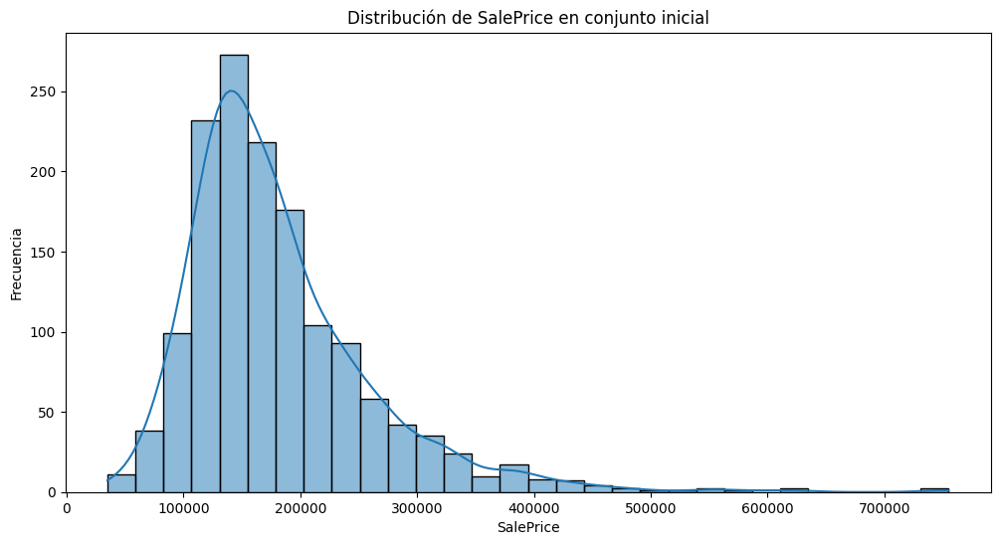

In [14]:
# Distribución del precio de venta
ft_plot_distribution(df_train, 'SalePrice', 'en conjunto inicial')

### Análisis del Histograma de Precios de Venta

Esta gráfica de tipo histograma nos presenta la distribución de los precios de venta de un conjunto de datos. En otras palabras, nos indica cuántas veces se ha vendido un producto o servicio a un precio determinado dentro de un rango específico.

#### Elementos clave a analizar:

- **Eje X**: Representa los diferentes rangos de precios de venta. En este caso, parece que los precios van desde 0 hasta aproximadamente 700.000 unidades monetarias (no se especifica la moneda).
  
- **Eje Y**: Representa la frecuencia, es decir, la cantidad de veces que se ha registrado un precio de venta dentro de cada rango.
  
- **Barras**: Cada barra representa un rango de precios y su altura indica la frecuencia con la que se ha vendido a ese precio.

#### Conclusiones preliminares:

A partir de esta gráfica, podemos observar lo siguiente:

- **Concentración de precios**: La mayoría de los precios de venta se encuentran concentrados en un rango específico, que parece estar entre 100.000 y 300.000 unidades monetarias.
  
- **Dispersión**: A medida que aumenta el precio, la frecuencia disminuye, lo que indica que hay menos productos o servicios vendidos a precios más altos.
  
- **Distribución asimétrica**: La distribución de los precios no es simétrica, sino que está sesgada hacia la izquierda. Esto significa que hay una mayor concentración de precios bajos y una cola larga hacia los precios altos.

### Posibles preguntas para responder con un análisis más detallado:

- ¿A qué período corresponde esta distribución de precios?
- ¿Cuál es el precio de venta más común?
- ¿Qué porcentaje de las ventas se concentra en los precios más bajos?
- ¿Existe algún punto de inflexión en la distribución de los precios?
- ¿Cómo se compara esta distribución con otras distribuciones similares?

- ¿Alguna estrategia en mente para manejar los valores faltantes?
- ¿Explorar alguna columna en particular con más detalle?
- ¿Qué tipo de modelos utilizar para el análisis o predicción? 

## Separación de Conjuntos

### Estrategia Correcta para Imputación y Separación:

- **Separar los Conjuntos Primero**: Realizar la separación del conjunto de datos en entrenamiento y prueba antes de imputar los valores faltantes. Esto asegura que los datos del conjunto de prueba no influyan en la imputación del conjunto de entrenamiento.

- **Imputar en el Conjunto de Entrenamiento**: Imputar los valores faltantes únicamente en el conjunto de entrenamiento. Puedo usar la media, mediana o cualquier otra estrategia adecuada.

- **Aplicar la Imputación al Conjunto de Prueba**: Después de imputar en el conjunto de entrenamiento, utilizar la misma técnica de imputación (por ejemplo, la media calculada en el conjunto de entrenamiento) para imputar los valores faltantes en el conjunto de prueba. Esto garantiza que el modelo no tenga acceso a información del conjunto de prueba durante la imputación.

In [15]:
X = df_train.drop('SalePrice', axis=1)  # Características
y = df_train['SalePrice']                # Variable objetivo

# Dividir en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train_df = y_train.reset_index(drop=True)  # Reiniciar el índice de y_train
df_train_train_copy = pd.concat([X_train.reset_index(drop=True), y_train_df], axis=1)
df_train_train = df_train_train_copy.copy()

y_test_df = y_test.reset_index(drop=True)  # Reiniciar el índice de y_test
df_train_test = pd.concat([X_test.reset_index(drop=True), y_test_df], axis=1)

# Todo lo que haga a partir de ahora tiene que ser aplicado tanto en train como en test
print(df_train_test.shape, df_train_test.shape)

(292, 81) (292, 81)


## Análisis de Valores Faltantes

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


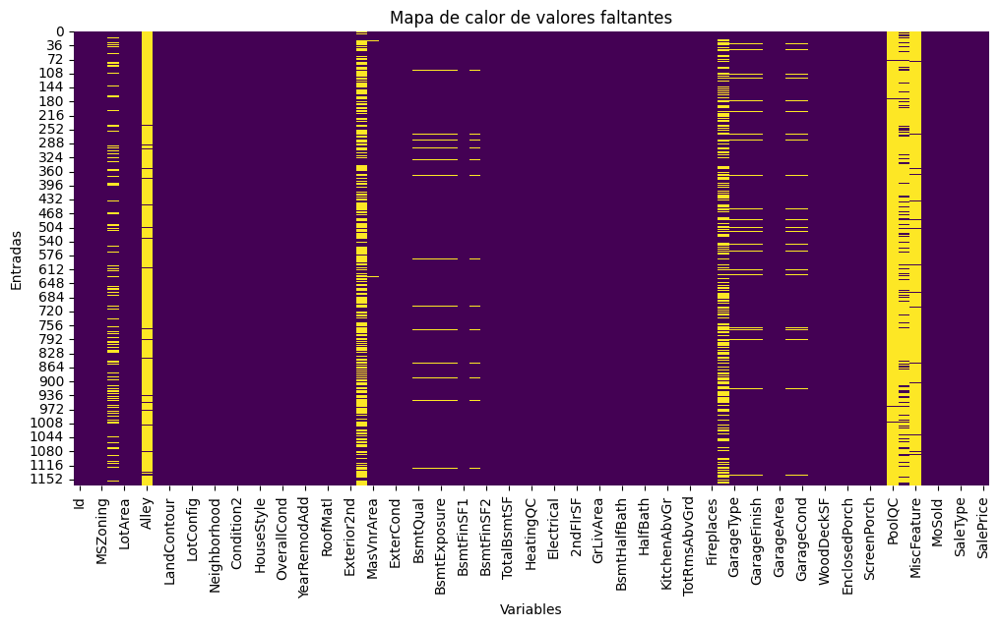

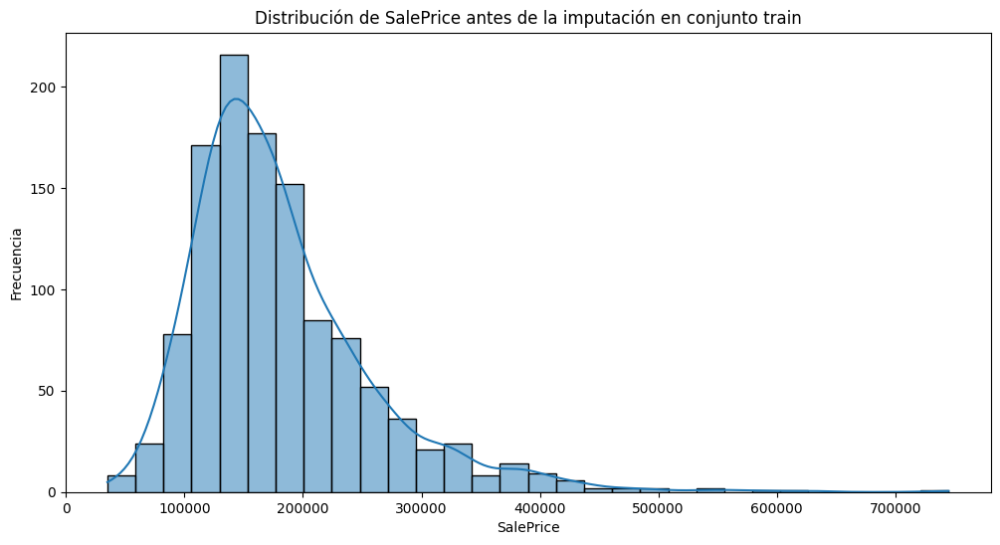

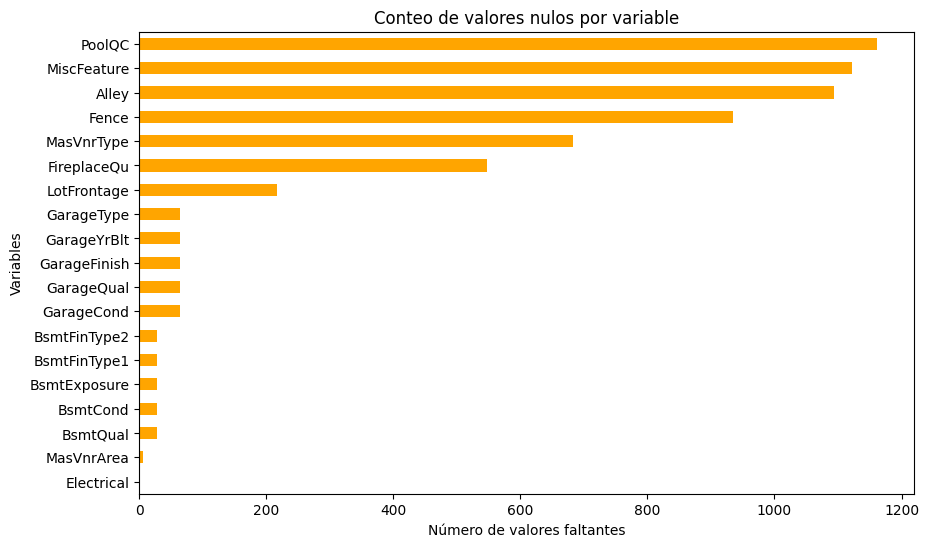

In [16]:
# Gráfico de calor para mostrar los valores faltantes
ft_heatplot_missing_values(df_train_train)
# Distribución de SalePrice antes de la imputación
ft_plot_distribution(df_train_train, 'SalePrice', 'antes de la imputación en conjunto train')
# Gráfico de barras para mostrar los valores faltantes
ft_histplot_missing_values(df_train_train)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


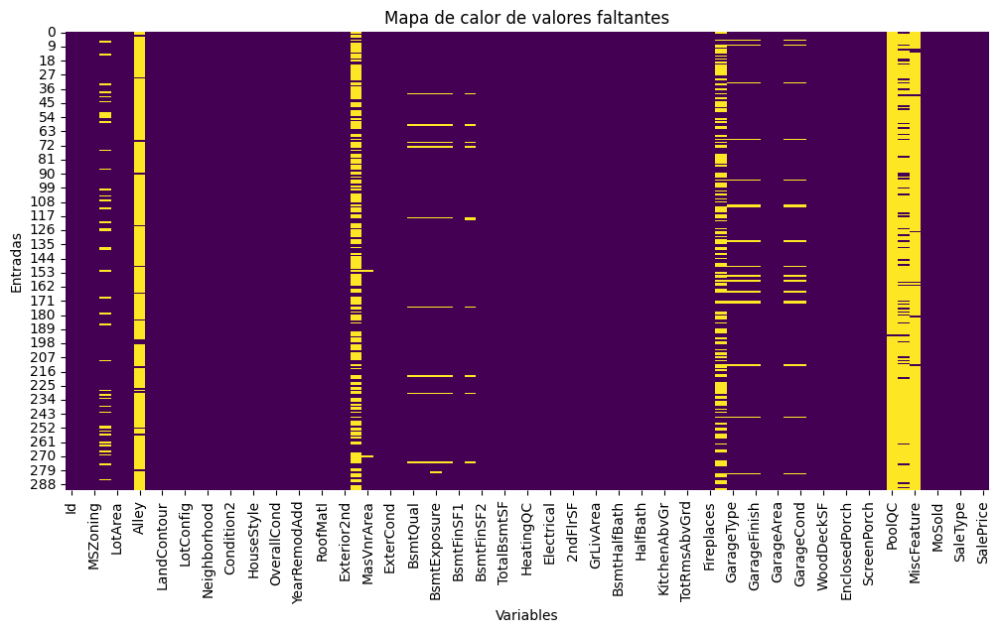

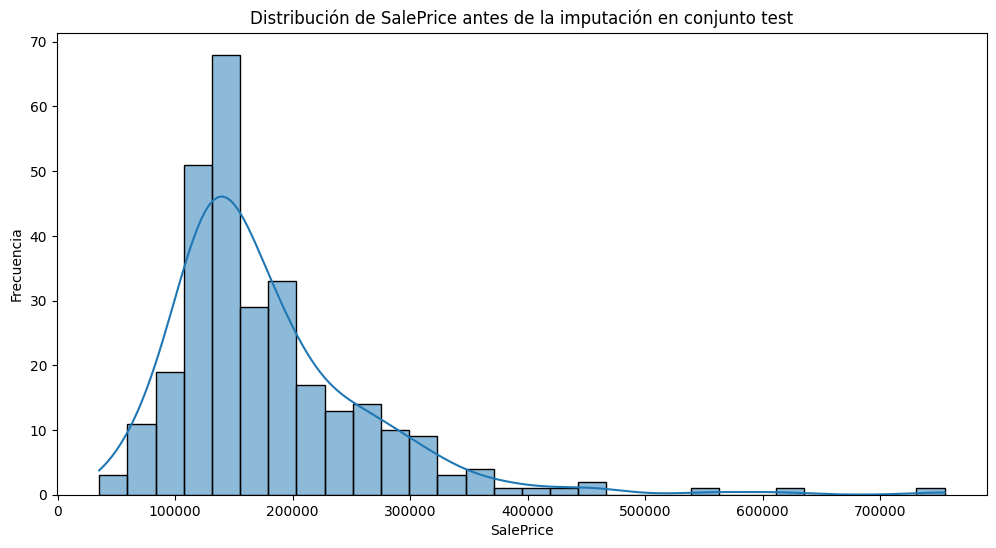

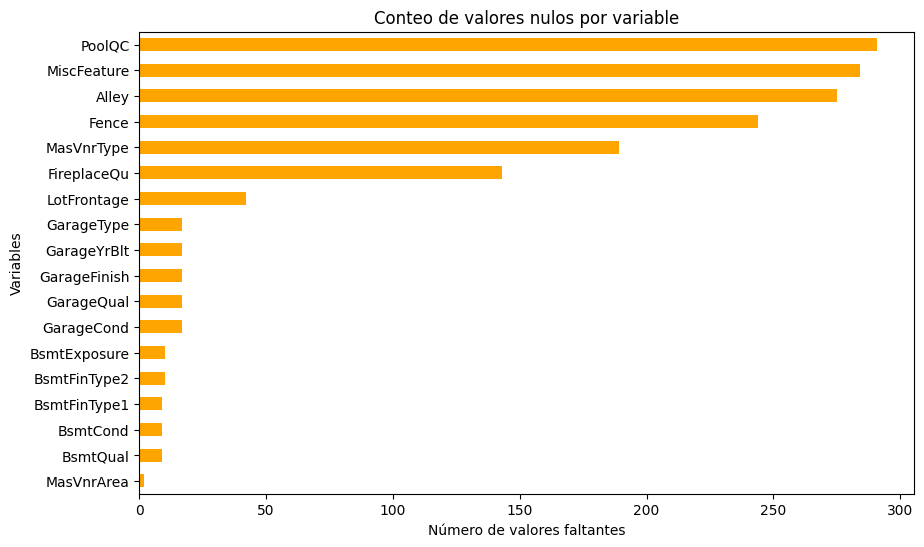

In [17]:
# Gráfico de calor para mostrar los valores faltantes
ft_heatplot_missing_values(df_train_test)
# Distribución de SalePrice antes de la imputación
ft_plot_distribution(df_train_test, 'SalePrice', 'antes de la imputación en conjunto test')
# Gráfico de barras para mostrar los valores faltantes
ft_histplot_missing_values(df_train_test)

| **Columna**         | **Descripción**                              | **Contexto**                                                                                   | **Imputación Sugerida**                   |
|---------------------|----------------------------------------------|-----------------------------------------------------------------------------------------------|-------------------------------------------|
| **LotFrontage**     | Ancho del lote en pies                      | Faltante si acceso irregular o sin medida de lote                                             | Media o mediana de lotes vecinos          |
| **Alley**           | Tipo de calle de acceso                     | La mayoría no tiene acceso por calle                                                          | "No Alley"                                |
| **MasVnrType**      | Tipo de revestimiento de mampostería        | Vacío si no hay revestimiento                                                                 | Moda o "None"                             |
| **MasVnrArea**      | Área de revestimiento en pies cuadrados     | Nulo si no hay revestimiento                                                                  | 0 o media de propiedades con revestimiento|
| **BsmtQual**        | Calidad del sótano                          | Faltante si no hay sótano                                                                     | "No Basement"                             |
| **BsmtCond**        | Condición del sótano                        | Similar a BsmtQual                                                                            | "No Basement"                             |
| **BsmtExposure**    | Exposición del sótano                       | Nulo si no hay sótano                                                                         | "No Basement"                             |
| **BsmtFinType1 / 2**| Tipo de acabado del sótano                  | Faltante si no hay sótano                                                                     | "No Basement"                             |
| **Electrical**      | Tipo de sistema eléctrico                   | Solo un valor nulo                                                                            | Moda                                      |
| **FireplaceQu**     | Calidad de la chimenea                      | Faltante si no hay chimenea                                                                   | "No Fireplace"                            |
| **GarageType**      | Tipo de garaje                              | Nulo si no hay garaje                                                                         | "No Garage"                               |
| **GarageYrBlt**     | Año de construcción del garaje              | Nulo si no hay garaje                                                                         | 0 o "No Garage"                           |
| **GarageFinish**    | Acabado del garaje                          | Faltante si no hay garaje                                                                     | "No Garage"                               |
| **GarageQual / Cond**| Calidad y condición del garaje             | Similar a otros campos de garaje                                                              | "No Garage"                               |
| **PoolQC**          | Calidad de la piscina                       | La mayoría no tiene piscina                                                                   | "No Pool"                                 |
| **Fence**           | Tipo de cerca                               | La mayoría probablemente no tenga cerca                                                       | "No Fence"                                |
| **MiscFeature**     | Otras características                       | Vacío si no hay características especiales                                                    | "No Feature"                              |

### Decisiones sobre el Manejo de Valores Faltantes:

| **Estrategia**                | **Columna(s)**                   | **Acción**                                      | **Razón**                                                                                                                                             |
|-------------------------------|----------------------------------|-------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Imputar con Media/Mediana** | LotFrontage                      | Imputar con la media o mediana                  | Valores numéricos donde la imputación con la media o mediana no debería afectar significativamente la distribución                                    |
| **Imputar con Moda**          | MasVnrType, MasVnrArea, Electrical | Imputar con la moda                             | Columnas categóricas donde la moda (valor más frecuente) es adecuada para imputar datos categóricos                                                  |
| **Eliminar Columnas**         | Alley, MiscFeature               | Eliminar columnas                               | Alta cantidad de datos faltantes y poco valor agregado para el análisis                                                                              |
| **Imputar con "No {tipo}"**   | BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageFinish, GarageQual, GarageCond, PoolQC, Fence | Imputar como "No {tipo}"       | Indica ausencia de elemento (por ejemplo, sin sótano o sin piscina), permitiendo imputación con "No {tipo}"                                          |
| **Otras Imputaciones**        | GarageYrBlt                      | Rellenar con YearBuilt                          | Si el garaje no tiene un año específico, es probable que se construyera al mismo tiempo que la casa, manteniendo consistencia y minimizando el sesgo |
| **Transformaciones**          | MasVnrType, GarageType, BsmtQual | Codificación adecuada (One-Hot o Label Encoding) | Para columnas categóricas después de la imputación, se necesita una codificación adecuada para preparar los datos para el modelo                      |


## Mapeo

Mapear columnas con un diccionario al principio del proyecto tiene múltiples beneficios importantes:

- **Preparación inicial consistente**: Garantiza que los datos categóricos se conviertan en valores numéricos de manera uniforme desde el inicio.
- **Facilita el flujo de trabajo**: Asegura que los datos estén listos para análisis, visualizaciones y modelado desde las primeras etapas.
- **Evita errores posteriores**: Al definir las transformaciones al principio, se reduce el riesgo de inconsistencias en pasos posteriores del pipeline.
- **Documentación temprana**: Proporciona claridad sobre cómo se procesaron las categorías, facilitando la comprensión del proyecto.
- **Aplicación universal**: Permite reutilizar estas transformaciones en todas las fases del proyecto, incluidos los datos de prueba y nuevas entradas.

In [18]:
# Diccionarios de mapeo para las columnas que tienen un orden implícito

ordinal_mapping = {
    'BsmtCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'BsmtExposure': {'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4, 'NA': 0, np.nan: 0},
    'BsmtFinType1': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'BsmtFinType2': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'FireplaceQu': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'GarageCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'Functional': {'Sal': 1, 'Sev': 2, 'Maj2': 3, 'Maj1': 4, 'Mod': 5, 'Min2': 6, 'Min1': 7, 'Typ': 8, np.nan: 0},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'BldgType': {'1Fam': 1, '2FmCon': 2, 'Duplx': 3, 'TwnhsE': 4, 'TwnhsI': 5, np.nan: 0},
    'CentralAir': {'N': 0, 'Y': 1, np.nan: 0},
    'Condition1': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Condition2': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Electrical': {'SBrkr': 1, 'FuseA': 2, 'FuseF': 3, 'FuseP': 4, 'Mix': 5, np.nan: 0},
    'Exterior1st': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Exterior2nd': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Fence': {'GdPrv': 1, 'MnPrv': 2, 'GdWo': 3, 'MnWo': 4, 'NA': 0, np.nan: 0},
    'Foundation': {'BrkTil': 1, 'CBlock': 2, 'PConc': 3, 'Slab': 4, 'Stone': 5, 'Wood': 6, np.nan: 0},
    'GarageFinish': {'Fin': 1, 'RFn': 2, 'Unf': 3, 'NA': 0, np.nan: 0},
    'GarageQual': {'Ex': 1, 'Gd': 2, 'TA': 3, 'Fa': 4, 'Po': 5, 'NA': 0, np.nan: 0},
    'Heating': {'Floor': 1, 'GasA': 2, 'GasW': 3, 'Grav': 4, 'OthW': 5, 'Wall': 6, np.nan: 0},
    'HouseStyle': {'1Story': 1, '1.5Fin': 2, '1.5Unf': 3, '2Story': 4, '2.5Fin': 5, '2.5Unf': 6, 'SFoyer': 7, 'SLvl': 8, np.nan: 0},
    'LandContour': {'Lvl': 1, 'Bnk': 2, 'HLS': 3, 'Low': 4, np.nan: 0},
    'LandSlope': {'Gtl': 1, 'Mod': 2, 'Sev': 3, np.nan: 0},
    'LotConfig': {'Inside': 1, 'Corner': 2, 'CulDSac': 3, 'FR2': 4, 'FR3': 5, np.nan: 0},
    'LotShape': {'Reg': 1, 'IR1': 2, 'IR2': 3, 'IR3': 4, np.nan: 0},
    'MSZoning': {'A': 1, 'C': 2, 'FV': 3, 'I': 4, 'RH': 5, 'RL': 6, 'RP': 7, 'RM': 8, np.nan: 0}
}


# Comprobar si hay valores nulos en las columnas específicas después de la codificación
print("antes")
null_values = df_train_train[ordinal_mapping.keys()].isnull().sum()
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Aplicamos la codificación ordinal
for column, mapping in ordinal_mapping.items():
    df_train_train[column] = df_train_train[column].map(mapping).fillna(0)  # Reemplaza los valores NA por 0 (o cualquier otro valor que decidas)
    # Convertir a tipo numérico
    df_train_train[column] = pd.to_numeric(df_train_train[column], errors='coerce')  # 'coerce' convierte cualquier error a NaN

# Comprobar si hay valores nulos en las columnas específicas después de la codificación
null_values = df_train_train[ordinal_mapping.keys()].isnull().sum()
print("despues")
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Mostrar el DataFrame con las columnas ordinalmente codificadas
df_train_train.head()

antes
BsmtCond         28
BsmtExposure     28
BsmtFinType1     28
BsmtFinType2     28
FireplaceQu     547
GarageCond       64
Functional        0
KitchenQual       0
HeatingQC         0
ExterCond         0
BldgType          0
CentralAir        0
Condition1        0
Condition2        0
Electrical        1
Exterior1st       0
Exterior2nd       0
Fence           935
Foundation        0
GarageFinish     64
GarageQual       64
Heating           0
HouseStyle        0
LandContour       0
LandSlope         0
LotConfig         0
LotShape          0
MSZoning          0
dtype: int64
despues
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
FireplaceQu     0
GarageCond      0
Functional      0
KitchenQual     0
HeatingQC       0
ExterCond       0
BldgType        0
CentralAir      0
Condition1      0
Condition2      0
Electrical      0
Exterior1st     0
Exterior2nd     0
Fence           0
Foundation      0
GarageFinish    0
GarageQual      0
Heating         0
HouseStyle      0

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,255,20,6.0,70.0,8400,Pave,NaN,1,1,AllPub,...,0,NaN,0.0,NaN,0,6,2010,WD,Normal,145000
1,1067,60,6.0,59.0,7837,Pave,NaN,2,1,AllPub,...,0,NaN,0.0,NaN,0,5,2009,WD,Normal,178000
2,639,30,6.0,67.0,8777,Pave,NaN,1,1,AllPub,...,0,NaN,2.0,NaN,0,5,2008,WD,Normal,85000
3,800,50,6.0,60.0,7200,Pave,NaN,1,1,AllPub,...,0,NaN,2.0,NaN,0,6,2007,WD,Normal,175000
4,381,50,6.0,50.0,5000,Pave,Pave,1,1,AllPub,...,0,NaN,0.0,NaN,0,5,2010,WD,Normal,127000


In [19]:
# Diccionarios de mapeo para las columnas que tienen un orden implícito

ordinal_mapping = {
    'BsmtCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'BsmtExposure': {'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4, 'NA': 0, np.nan: 0},
    'BsmtFinType1': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'BsmtFinType2': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'FireplaceQu': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'GarageCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'Functional': {'Sal': 1, 'Sev': 2, 'Maj2': 3, 'Maj1': 4, 'Mod': 5, 'Min2': 6, 'Min1': 7, 'Typ': 8, np.nan: 0},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'BldgType': {'1Fam': 1, '2FmCon': 2, 'Duplx': 3, 'TwnhsE': 4, 'TwnhsI': 5, np.nan: 0},
    'CentralAir': {'N': 0, 'Y': 1, np.nan: 0},
    'Condition1': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Condition2': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Electrical': {'SBrkr': 1, 'FuseA': 2, 'FuseF': 3, 'FuseP': 4, 'Mix': 5, np.nan: 0},
    'Exterior1st': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Exterior2nd': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Fence': {'GdPrv': 1, 'MnPrv': 2, 'GdWo': 3, 'MnWo': 4, 'NA': 0, np.nan: 0},
    'Foundation': {'BrkTil': 1, 'CBlock': 2, 'PConc': 3, 'Slab': 4, 'Stone': 5, 'Wood': 6, np.nan: 0},
    'GarageFinish': {'Fin': 1, 'RFn': 2, 'Unf': 3, 'NA': 0, np.nan: 0},
    'GarageQual': {'Ex': 1, 'Gd': 2, 'TA': 3, 'Fa': 4, 'Po': 5, 'NA': 0, np.nan: 0},
    'Heating': {'Floor': 1, 'GasA': 2, 'GasW': 3, 'Grav': 4, 'OthW': 5, 'Wall': 6, np.nan: 0},
    'HouseStyle': {'1Story': 1, '1.5Fin': 2, '1.5Unf': 3, '2Story': 4, '2.5Fin': 5, '2.5Unf': 6, 'SFoyer': 7, 'SLvl': 8, np.nan: 0},
    'LandContour': {'Lvl': 1, 'Bnk': 2, 'HLS': 3, 'Low': 4, np.nan: 0},
    'LandSlope': {'Gtl': 1, 'Mod': 2, 'Sev': 3, np.nan: 0},
    'LotConfig': {'Inside': 1, 'Corner': 2, 'CulDSac': 3, 'FR2': 4, 'FR3': 5, np.nan: 0},
    'LotShape': {'Reg': 1, 'IR1': 2, 'IR2': 3, 'IR3': 4, np.nan: 0},
    'MSZoning': {'A': 1, 'C': 2, 'FV': 3, 'I': 4, 'RH': 5, 'RL': 6, 'RP': 7, 'RM': 8, np.nan: 0}
}


# Comprobar si hay valores nulos en las columnas específicas después de la codificación
print("antes")
null_values = df_train_test[ordinal_mapping.keys()].isnull().sum()
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Aplicamos la codificación ordinal
for column, mapping in ordinal_mapping.items():
    df_train_test[column] = df_train_test[column].map(mapping).fillna(0)  # Reemplaza los valores NA por 0 (o cualquier otro valor que decidas)
    # Convertir a tipo numérico
    df_train_test[column] = pd.to_numeric(df_train_test[column], errors='coerce')  # 'coerce' convierte cualquier error a NaN

# Comprobar si hay valores nulos en las columnas específicas después de la codificación
null_values = df_train_test[ordinal_mapping.keys()].isnull().sum()
print("despues")
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Mostrar el DataFrame con las columnas ordinalmente codificadas
df_train_test.head()

antes
BsmtCond          9
BsmtExposure     10
BsmtFinType1      9
BsmtFinType2     10
FireplaceQu     143
GarageCond       17
Functional        0
KitchenQual       0
HeatingQC         0
ExterCond         0
BldgType          0
CentralAir        0
Condition1        0
Condition2        0
Electrical        0
Exterior1st       0
Exterior2nd       0
Fence           244
Foundation        0
GarageFinish     17
GarageQual       17
Heating           0
HouseStyle        0
LandContour       0
LandSlope         0
LotConfig         0
LotShape          0
MSZoning          0
dtype: int64
despues
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
FireplaceQu     0
GarageCond      0
Functional      0
KitchenQual     0
HeatingQC       0
ExterCond       0
BldgType        0
CentralAir      0
Condition1      0
Condition2      0
Electrical      0
Exterior1st     0
Exterior2nd     0
Fence           0
Foundation      0
GarageFinish    0
GarageQual      0
Heating         0
HouseStyle      0

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,893,20,6.0,70.0,8414,Pave,NaN,1,1,AllPub,...,0,NaN,2.0,NaN,0,2,2006,WD,Normal,154500
1,1106,60,6.0,98.0,12256,Pave,NaN,2,1,AllPub,...,0,NaN,0.0,NaN,0,4,2010,WD,Normal,325000
2,414,30,8.0,56.0,8960,Pave,Grvl,1,1,AllPub,...,0,NaN,0.0,NaN,0,3,2010,WD,Normal,115000
3,523,50,8.0,50.0,5000,Pave,NaN,1,1,AllPub,...,0,NaN,0.0,NaN,0,10,2006,WD,Normal,159000
4,1037,20,6.0,89.0,12898,Pave,NaN,2,3,AllPub,...,0,NaN,0.0,NaN,0,9,2009,WD,Normal,315500


In [20]:
# Diccionarios de mapeo para las columnas que tienen un orden implícito

ordinal_mapping = {
    'BsmtCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'BsmtExposure': {'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4, 'NA': 0, np.nan: 0},
    'BsmtFinType1': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'BsmtFinType2': {'Unf': 1, 'LwQ': 2, 'BLQ': 3, 'Rec': 4, 'ALQ': 5, 'GLQ': 6, 'NA': 0, np.nan: 0},
    'FireplaceQu': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'GarageCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, 'NA': 0, np.nan: 0},
    'Functional': {'Sal': 1, 'Sev': 2, 'Maj2': 3, 'Maj1': 4, 'Mod': 5, 'Min2': 6, 'Min1': 7, 'Typ': 8, np.nan: 0},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5, np.nan: 0},
    'BldgType': {'1Fam': 1, '2FmCon': 2, 'Duplx': 3, 'TwnhsE': 4, 'TwnhsI': 5, np.nan: 0},
    'CentralAir': {'N': 0, 'Y': 1, np.nan: 0},
    'Condition1': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Condition2': {'Artery': 1, 'Feedr': 2, 'Norm': 3, 'RRNn': 4, 'RRAn': 5, 'PosN': 6, 'PosA': 7, 'RRNe': 8, 'RRAe': 9, np.nan: 0},
    'Electrical': {'SBrkr': 1, 'FuseA': 2, 'FuseF': 3, 'FuseP': 4, 'Mix': 5, np.nan: 0},
    'Exterior1st': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Exterior2nd': {'AsbShng': 1, 'AsphShn': 2, 'BrkComm': 3, 'BrkFace': 4, 'CBlock': 5, 'CemntBd': 6, 'HdBoard': 7, 'ImStucc': 8, 'MetalSd': 9, 'Other': 10, 'Plywood': 11, 'PreCast': 12, 'Stone': 13, 'Stucco': 14, 'VinylSd': 15, 'Wd Sdng': 16, 'WdShing': 17, np.nan: 0},
    'Fence': {'GdPrv': 1, 'MnPrv': 2, 'GdWo': 3, 'MnWo': 4, 'NA': 0, np.nan: 0},
    'Foundation': {'BrkTil': 1, 'CBlock': 2, 'PConc': 3, 'Slab': 4, 'Stone': 5, 'Wood': 6, np.nan: 0},
    'GarageFinish': {'Fin': 1, 'RFn': 2, 'Unf': 3, 'NA': 0, np.nan: 0},
    'GarageQual': {'Ex': 1, 'Gd': 2, 'TA': 3, 'Fa': 4, 'Po': 5, 'NA': 0, np.nan: 0},
    'Heating': {'Floor': 1, 'GasA': 2, 'GasW': 3, 'Grav': 4, 'OthW': 5, 'Wall': 6, np.nan: 0},
    'HouseStyle': {'1Story': 1, '1.5Fin': 2, '1.5Unf': 3, '2Story': 4, '2.5Fin': 5, '2.5Unf': 6, 'SFoyer': 7, 'SLvl': 8, np.nan: 0},
    'LandContour': {'Lvl': 1, 'Bnk': 2, 'HLS': 3, 'Low': 4, np.nan: 0},
    'LandSlope': {'Gtl': 1, 'Mod': 2, 'Sev': 3, np.nan: 0},
    'LotConfig': {'Inside': 1, 'Corner': 2, 'CulDSac': 3, 'FR2': 4, 'FR3': 5, np.nan: 0},
    'LotShape': {'Reg': 1, 'IR1': 2, 'IR2': 3, 'IR3': 4, np.nan: 0},
    'MSZoning': {'A': 1, 'C': 2, 'FV': 3, 'I': 4, 'RH': 5, 'RL': 6, 'RP': 7, 'RM': 8, np.nan: 0}
}


# Comprobar si hay valores nulos en las columnas específicas después de la codificación
print("antes")
null_values = df_test[ordinal_mapping.keys()].isnull().sum()
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Aplicamos la codificación ordinal
for column, mapping in ordinal_mapping.items():
    df_test[column] = df_test[column].map(mapping).fillna(0)  # Reemplaza los valores NA por 0 (o cualquier otro valor que decidas)
    # Convertir a tipo numérico
    df_test[column] = pd.to_numeric(df_test[column], errors='coerce')  # 'coerce' convierte cualquier error a NaN

# Comprobar si hay valores nulos en las columnas específicas después de la codificación
null_values = df_test[ordinal_mapping.keys()].isnull().sum()
print("despues")
# Mostrar las columnas que tienen valores nulos
print(null_values)

# Mostrar el DataFrame con las columnas ordinalmente codificadas
df_test.head()

antes
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinType2      42
FireplaceQu      730
GarageCond        78
Functional         2
KitchenQual        1
HeatingQC          0
ExterCond          0
BldgType           0
CentralAir         0
Condition1         0
Condition2         0
Electrical         0
Exterior1st        1
Exterior2nd        1
Fence           1169
Foundation         0
GarageFinish      78
GarageQual        78
Heating            0
HouseStyle         0
LandContour        0
LandSlope          0
LotConfig          0
LotShape           0
MSZoning           4
dtype: int64
despues
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
FireplaceQu     0
GarageCond      0
Functional      0
KitchenQual     0
HeatingQC       0
ExterCond       0
BldgType        0
CentralAir      0
Condition1      0
Condition2      0
Electrical      0
Exterior1st     0
Exterior2nd     0
Fence           0
Foundation      0
GarageFinish    0
GarageQual      0
Heating

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,5.0,80.0,11622,Pave,NaN,1,1,AllPub,...,120,0,NaN,2.0,NaN,0,6,2010,WD,Normal
1,1462,20,6.0,81.0,14267,Pave,NaN,2,1,AllPub,...,0,0,NaN,0.0,Gar2,12500,6,2010,WD,Normal
2,1463,60,6.0,74.0,13830,Pave,NaN,2,1,AllPub,...,0,0,NaN,2.0,NaN,0,3,2010,WD,Normal
3,1464,60,6.0,78.0,9978,Pave,NaN,2,1,AllPub,...,0,0,NaN,0.0,NaN,0,6,2010,WD,Normal
4,1465,120,6.0,43.0,5005,Pave,NaN,2,3,AllPub,...,144,0,NaN,0.0,NaN,0,1,2010,WD,Normal


## Imputaión de Valores Faltantes

### Media

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


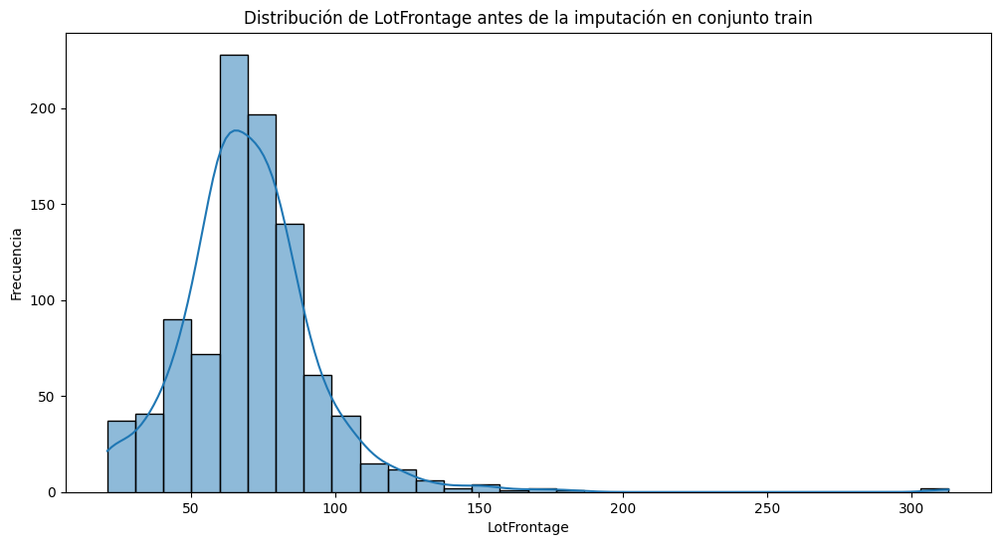

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


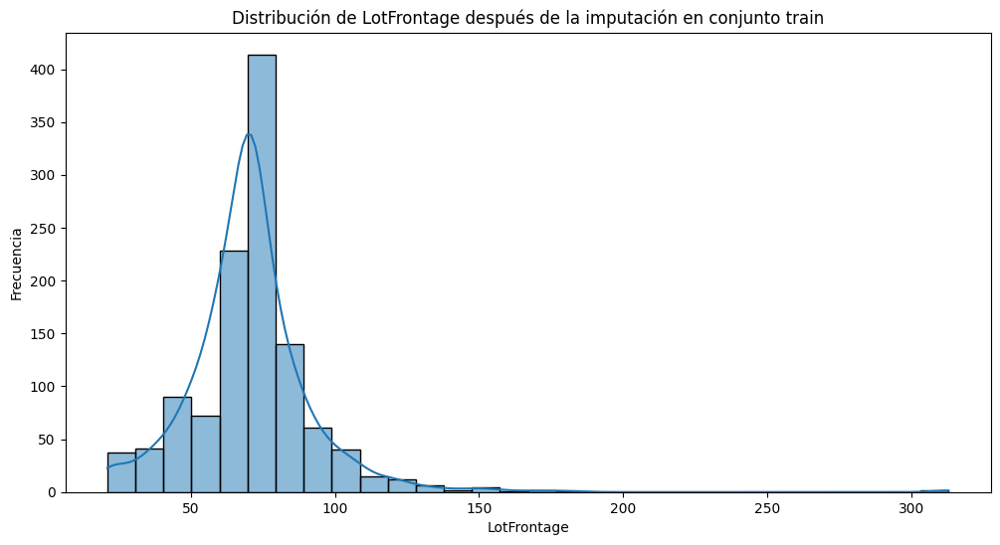

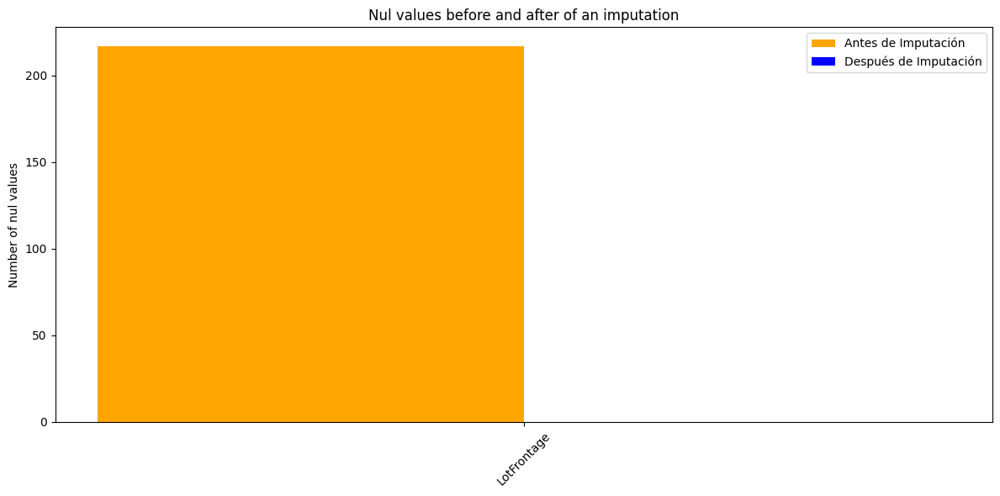

In [21]:
# Distribución de 'LotFrontage' antes de la imputación
ft_plot_distribution(df_train_train, 'LotFrontage', 'antes de la imputación en conjunto train')

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_train["LotFrontage"].isnull().sum()]

ft_imputar_media(df_train_train, 'LotFrontage')

# Contar valores nulos después de la imputación
nulos_despues = [df_train_train["LotFrontage"].isnull().sum()]

# Distribución de 'LotFrontage' después de la imputación
ft_plot_distribution(df_train_train, 'LotFrontage', 'después de la imputación en conjunto train')

ft_nulbefore_vs_nulafter(["LotFrontage"], nulos_antes, nulos_despues)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


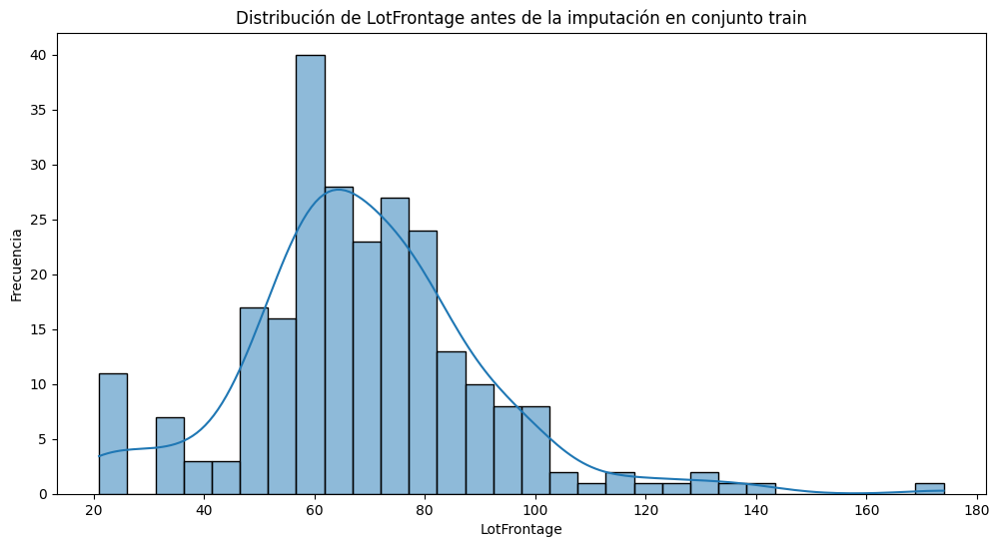

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


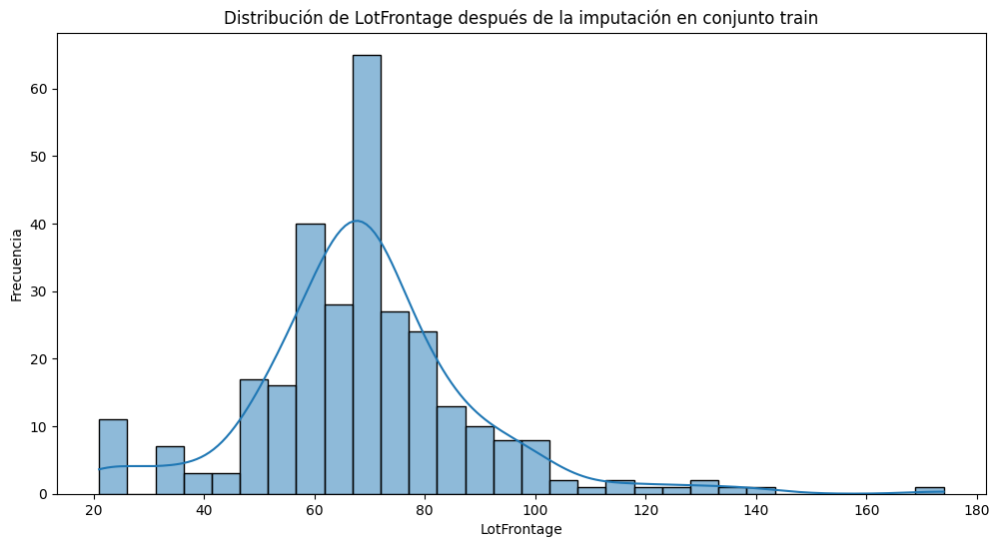

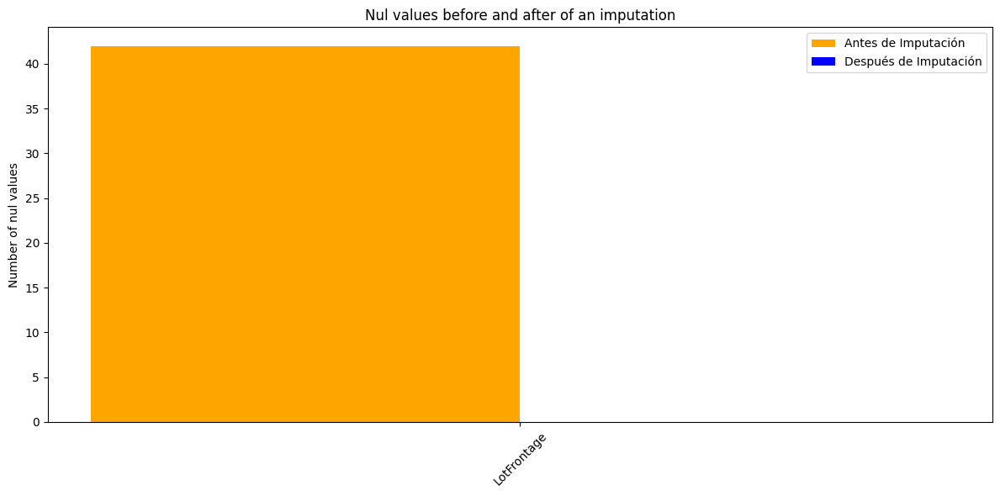

In [22]:
# Distribución de 'LotFrontage' antes de la imputación
ft_plot_distribution(df_train_test, 'LotFrontage', 'antes de la imputación en conjunto train')

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_test["LotFrontage"].isnull().sum()]

ft_imputar_media(df_train_test, 'LotFrontage')

# Contar valores nulos después de la imputación
nulos_despues = [df_train_test["LotFrontage"].isnull().sum()]

# Distribución de 'LotFrontage' después de la imputación
ft_plot_distribution(df_train_test, 'LotFrontage', 'después de la imputación en conjunto train')

ft_nulbefore_vs_nulafter(["LotFrontage"], nulos_antes, nulos_despues)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


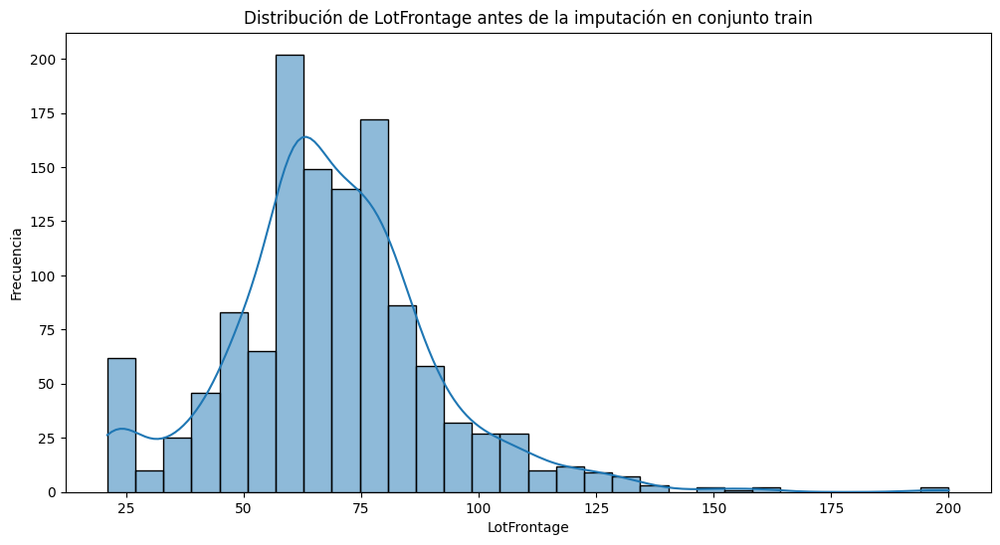

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


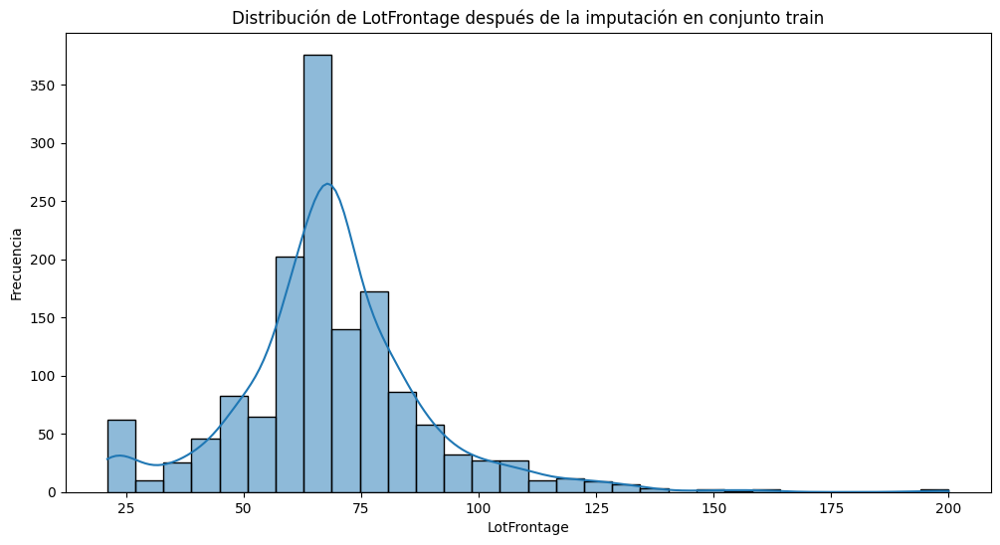

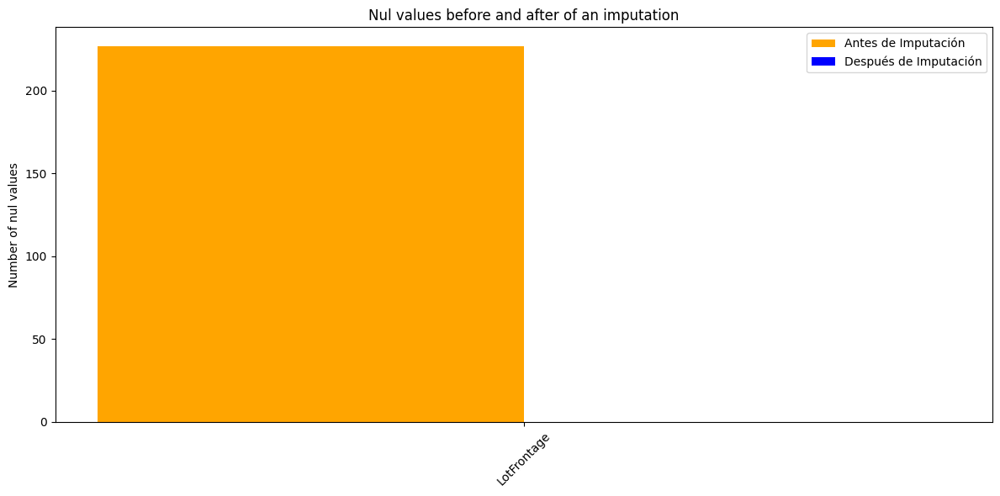

In [23]:
# Distribución de 'LotFrontage' antes de la imputación
ft_plot_distribution(df_test, 'LotFrontage', 'antes de la imputación en conjunto train')

# Contar valores nulos antes de la imputación
nulos_antes = [df_test["LotFrontage"].isnull().sum()]

ft_imputar_media(df_test, 'LotFrontage')

# Contar valores nulos después de la imputación
nulos_despues = [df_test["LotFrontage"].isnull().sum()]

# Distribución de 'LotFrontage' después de la imputación
ft_plot_distribution(df_test, 'LotFrontage', 'después de la imputación en conjunto train')

ft_nulbefore_vs_nulafter(["LotFrontage"], nulos_antes, nulos_despues)

### Moda

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


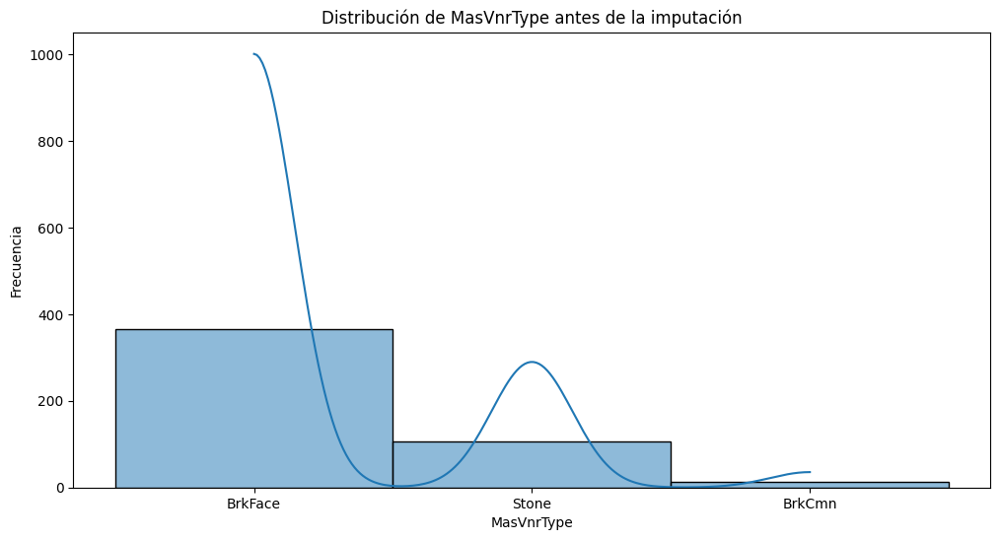

BrkFace


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


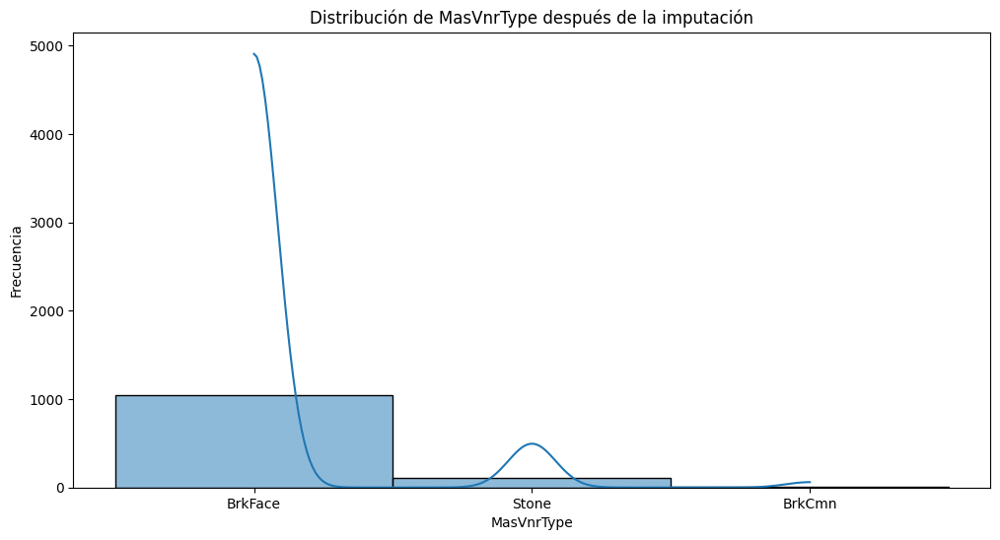

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


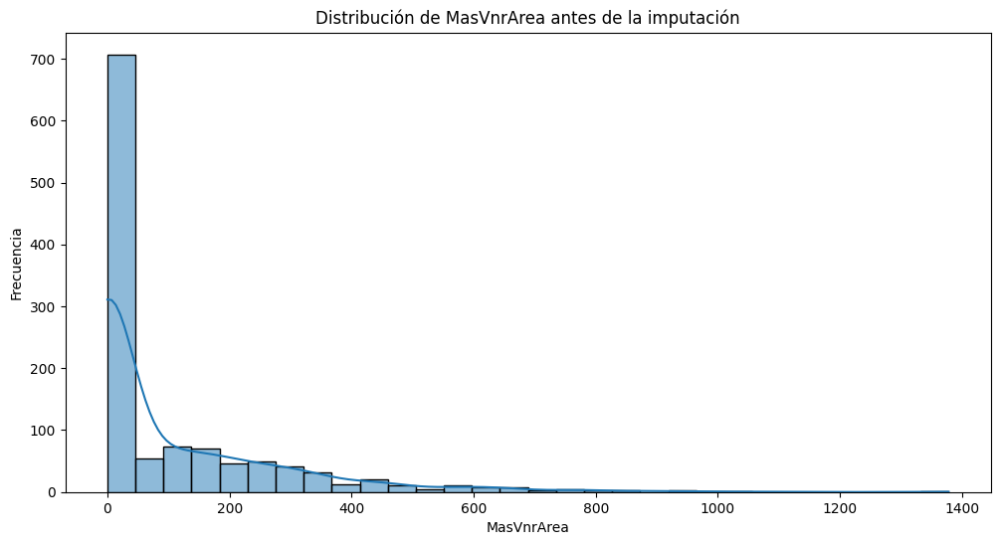

0.0


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


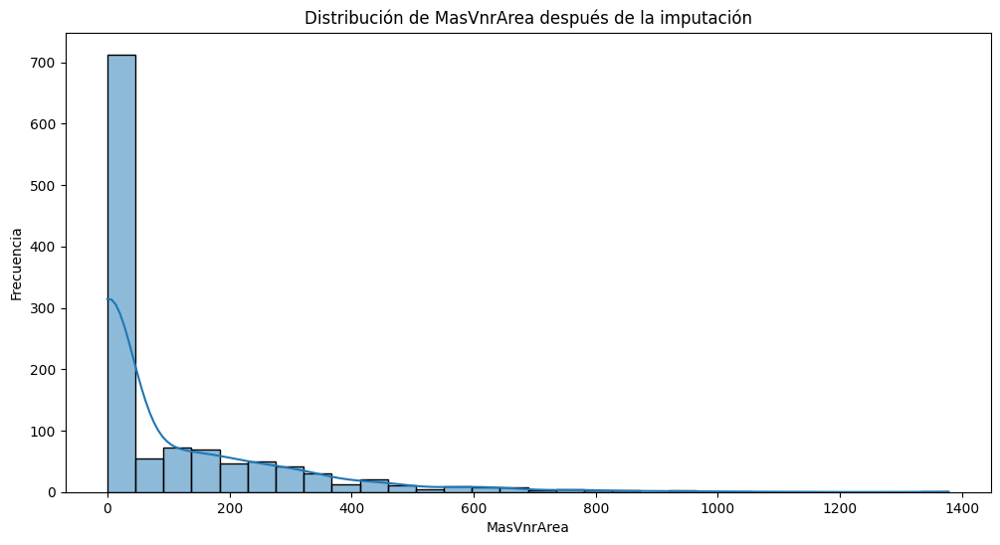

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


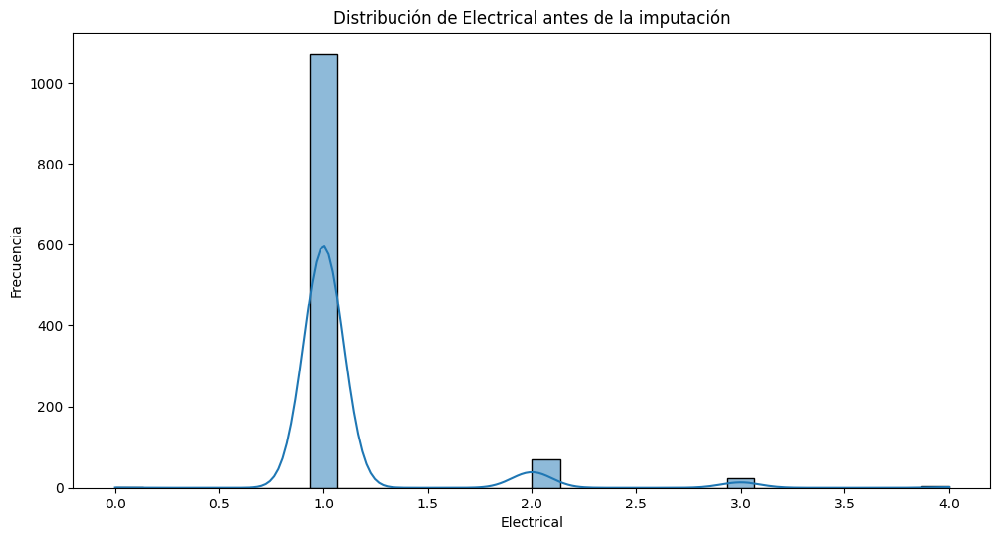

1


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


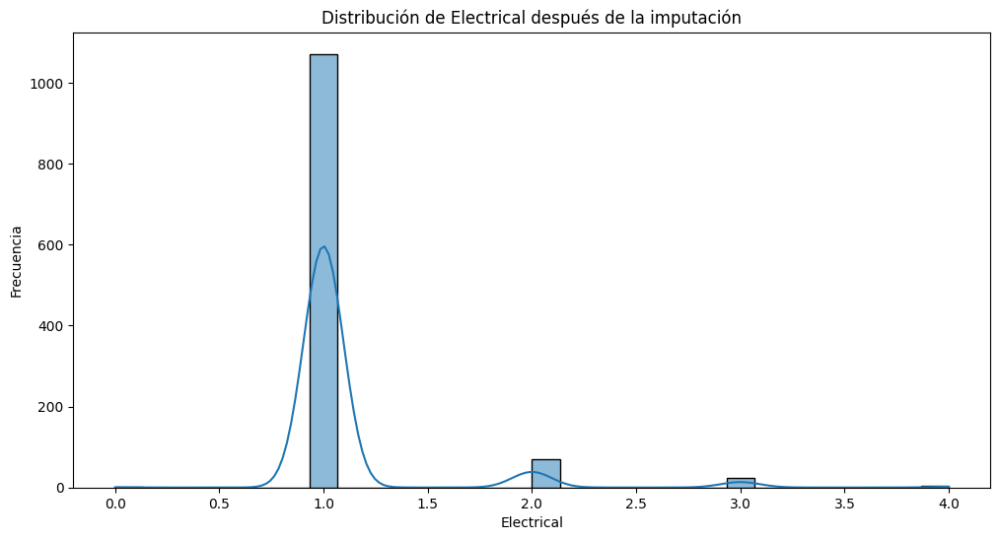

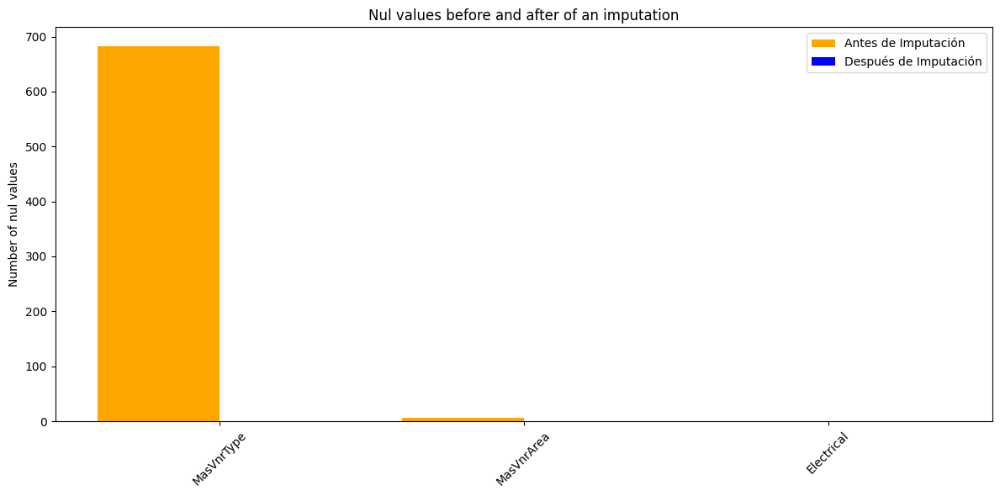

In [24]:
imputaciones_titulos = ["MasVnrType", "MasVnrArea", "Electrical"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_train[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_plot_distribution(df_train_train, i, 'antes de la imputación')
    ft_imputar_moda(df_train_train, i)
    ft_plot_distribution(df_train_train, i, 'después de la imputación')

# Contar valores nulos después de la imputación
nulos_despues = [df_train_train[col].isnull().sum() for col in imputaciones_titulos]

ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


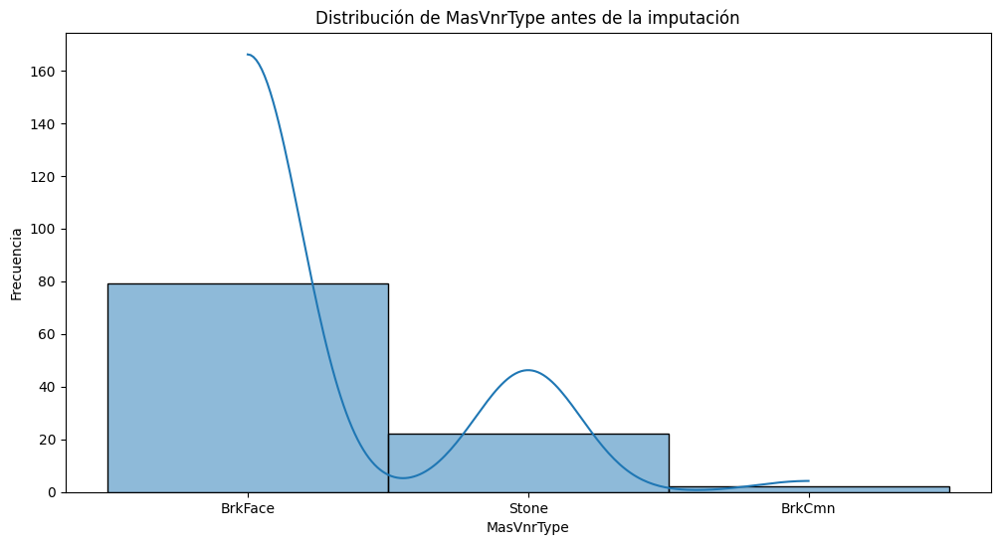

BrkFace


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


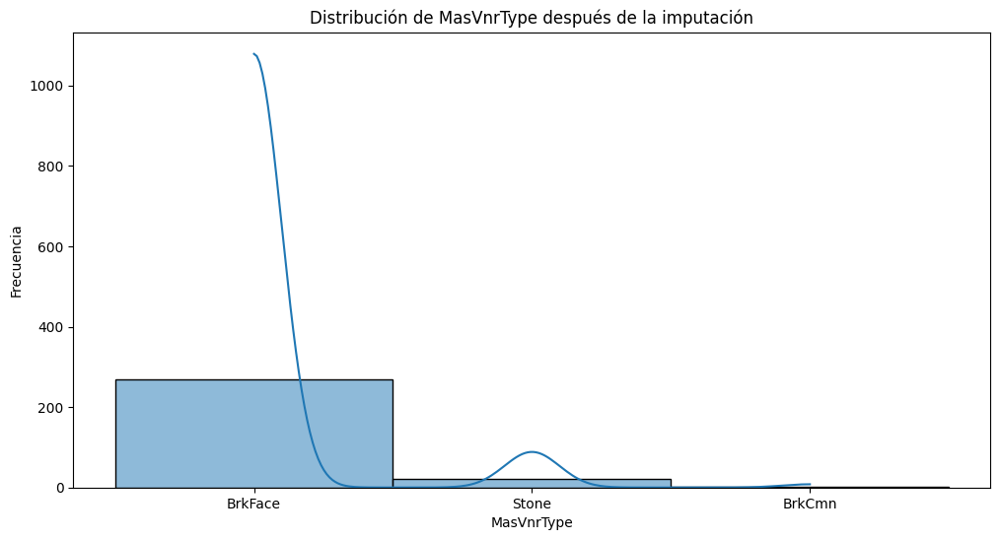

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


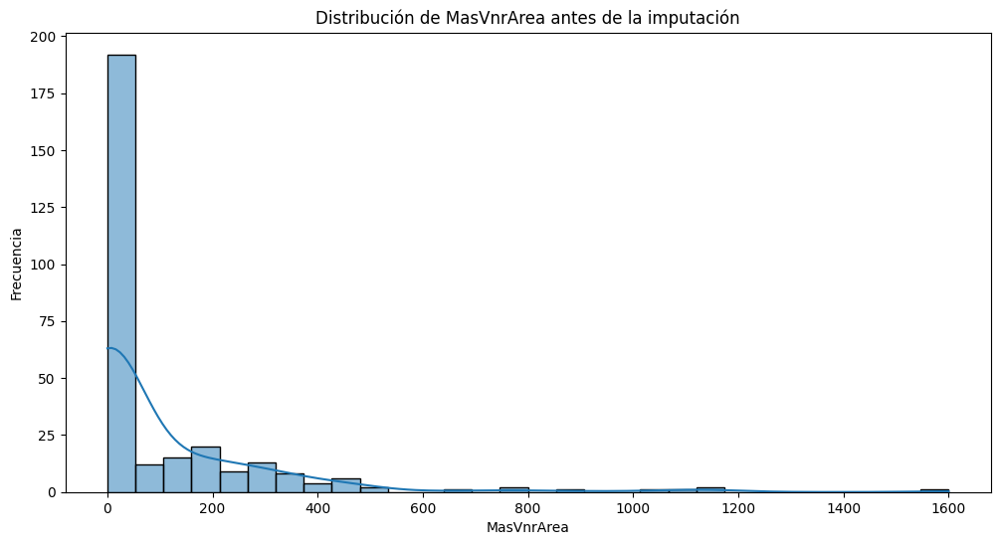

0.0


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


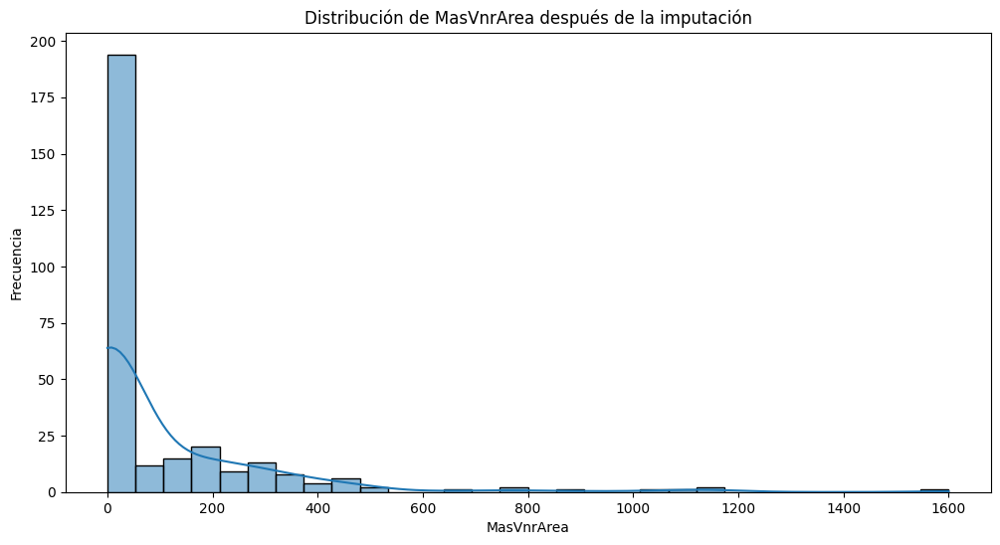

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


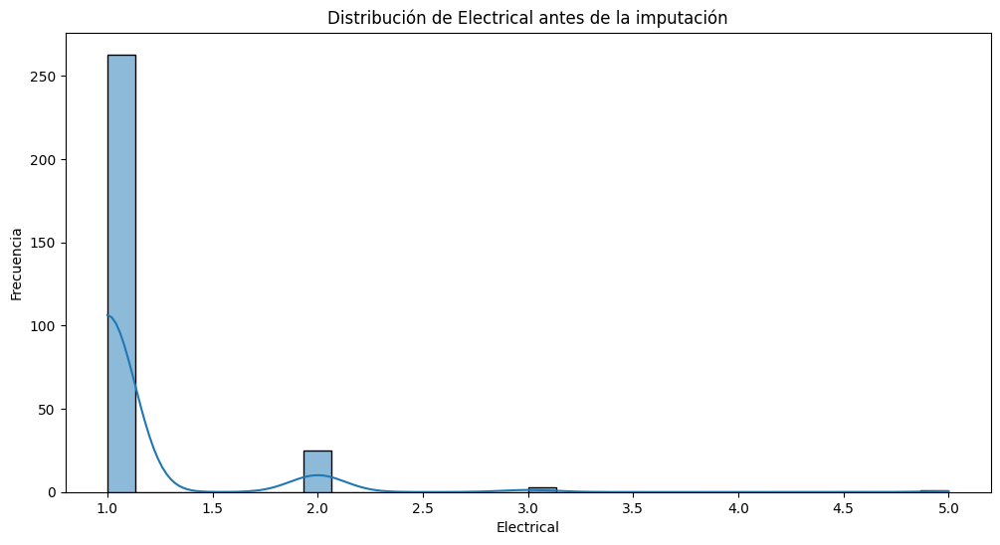

1


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


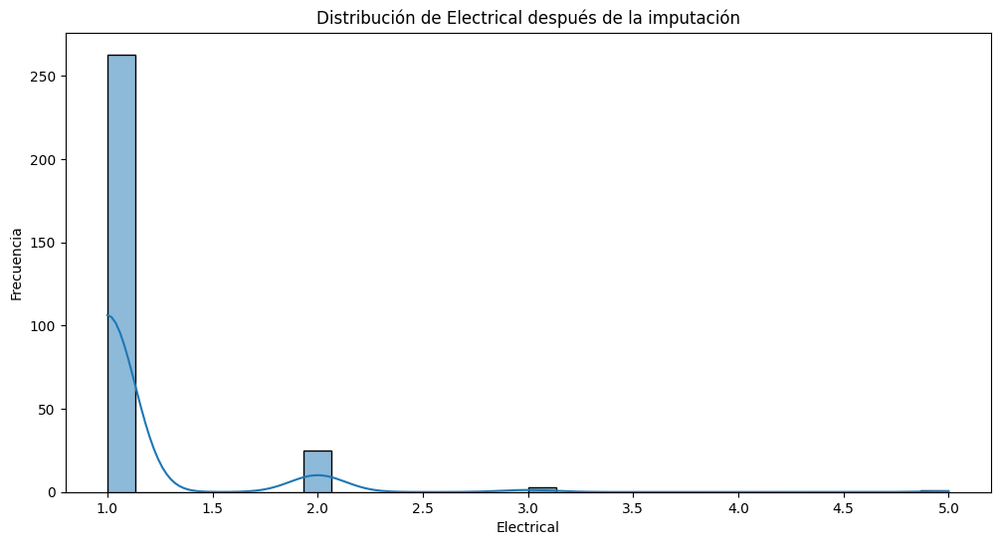

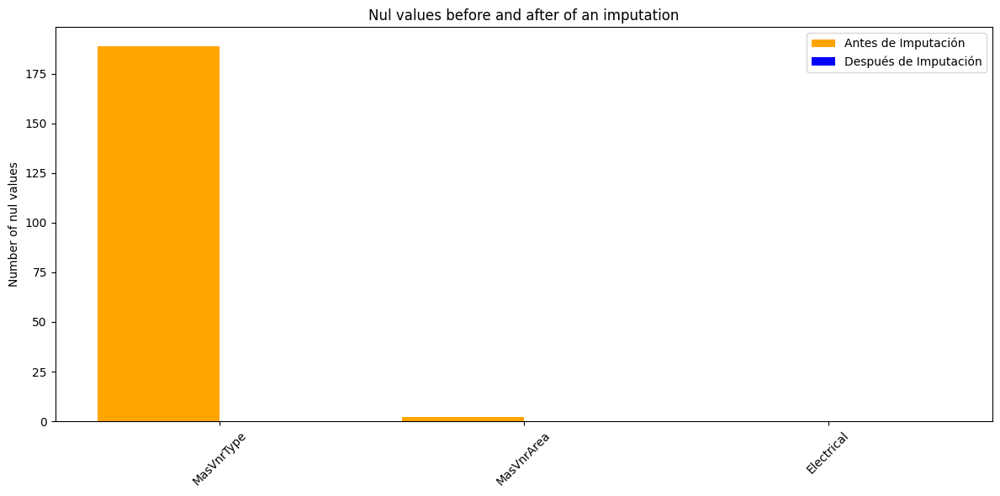

In [25]:
imputaciones_titulos = ["MasVnrType", "MasVnrArea", "Electrical"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_test[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_plot_distribution(df_train_test, i, 'antes de la imputación')
    ft_imputar_moda(df_train_test, i)
    ft_plot_distribution(df_train_test, i, 'después de la imputación')

# Contar valores nulos después de la imputación
nulos_despues = [df_train_test[col].isnull().sum() for col in imputaciones_titulos]

ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


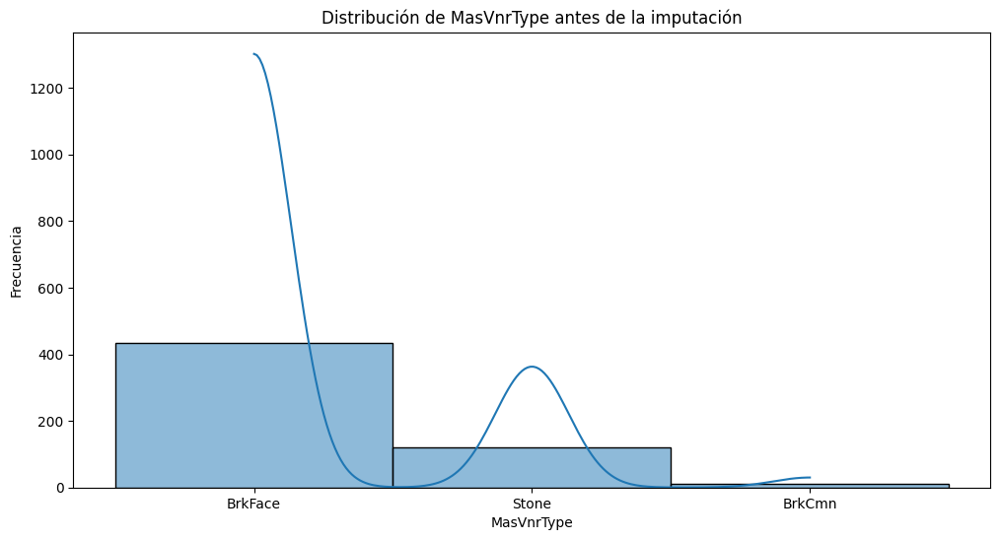

BrkFace


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


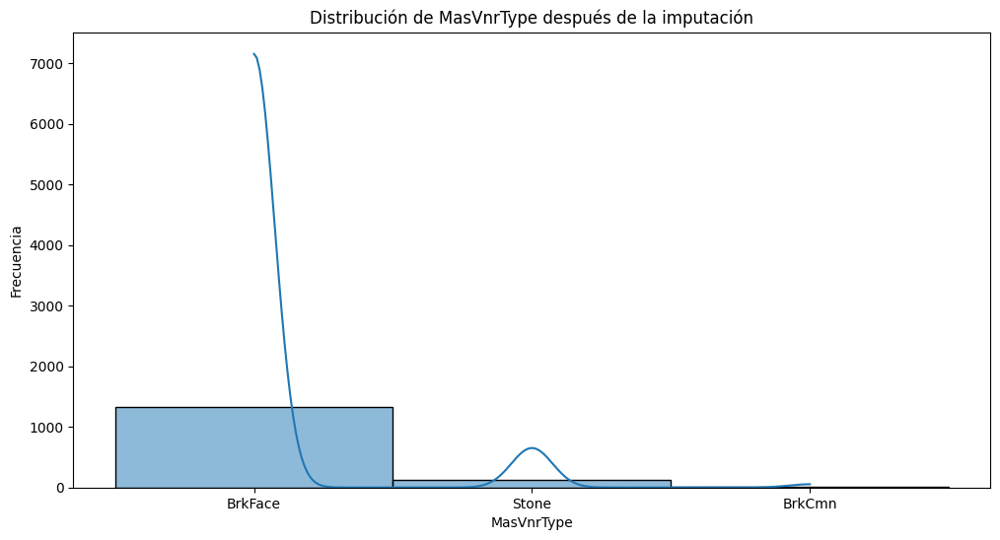

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


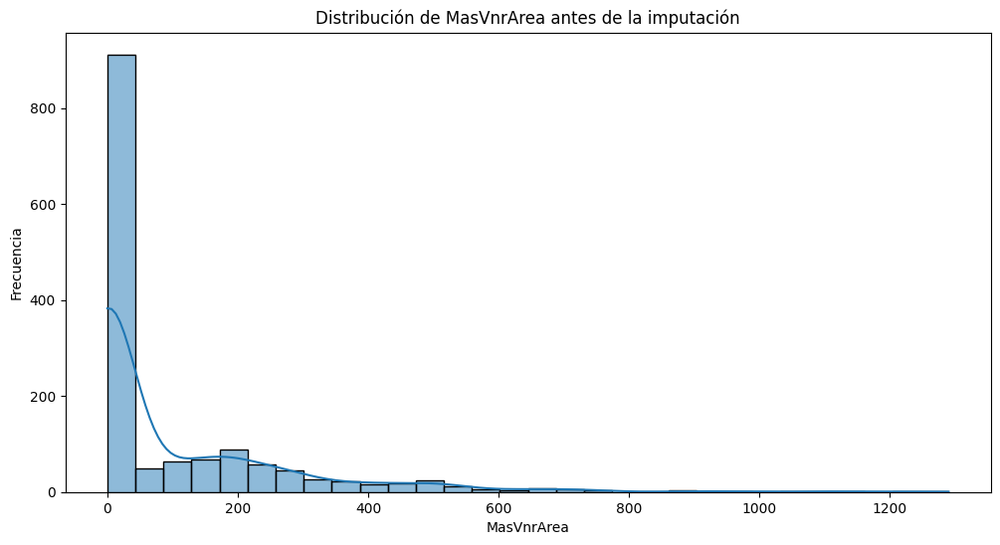

0.0


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


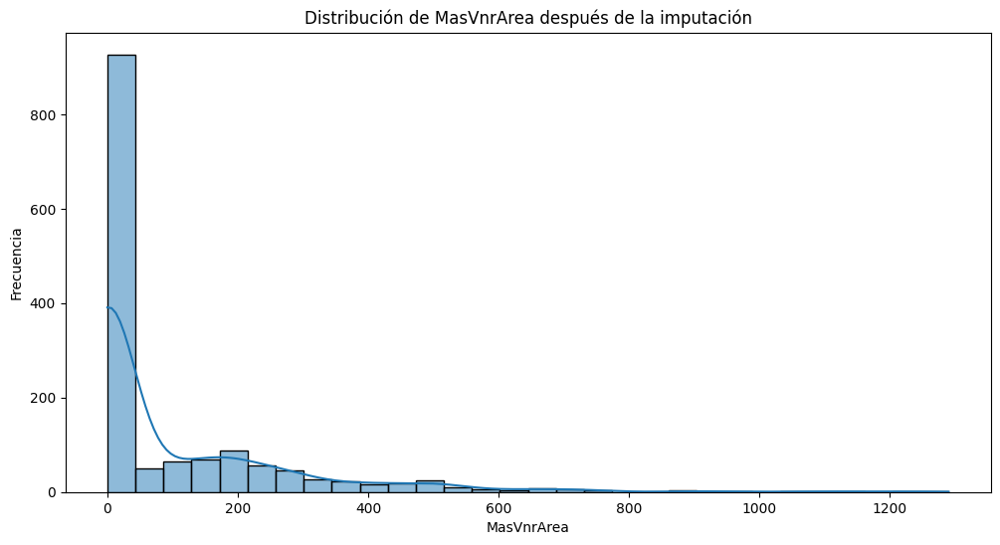

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


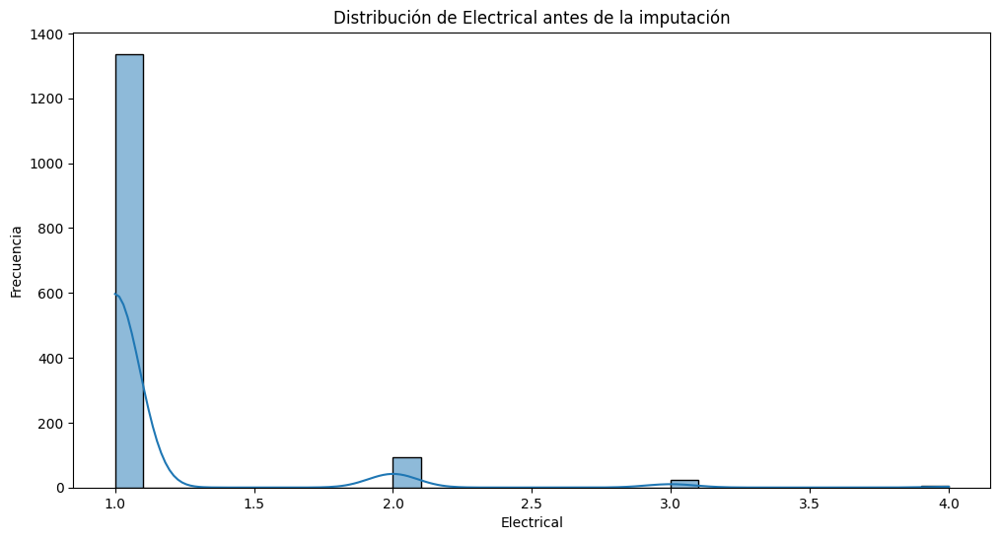

1


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


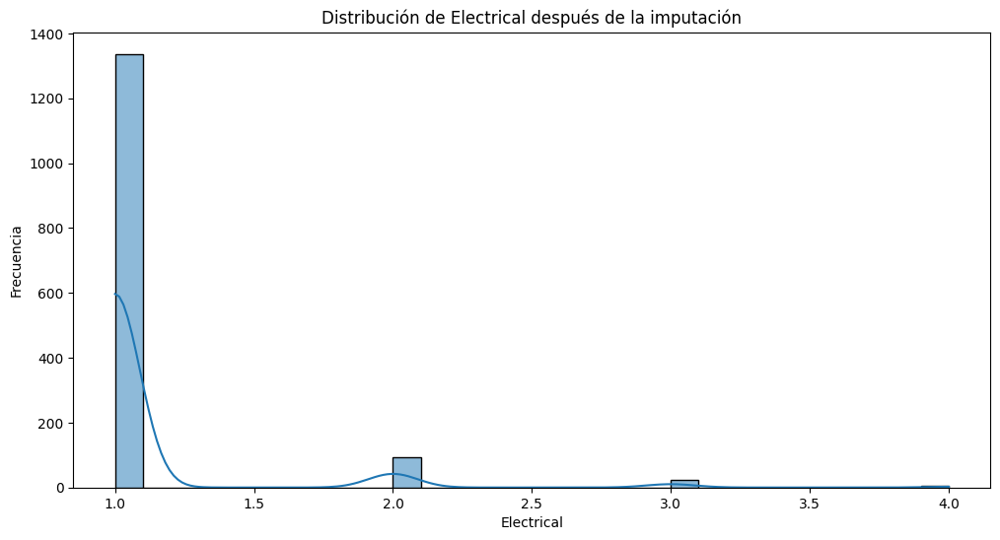

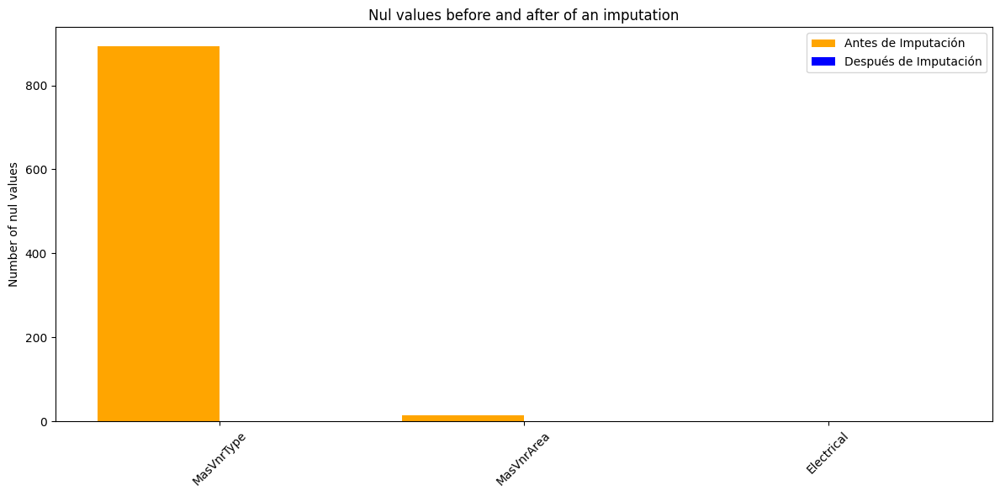

In [26]:
imputaciones_titulos = ["MasVnrType", "MasVnrArea", "Electrical"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_test[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_plot_distribution(df_test, i, 'antes de la imputación')
    ft_imputar_moda(df_test, i)
    ft_plot_distribution(df_test, i, 'después de la imputación')

# Contar valores nulos después de la imputación
nulos_despues = [df_test[col].isnull().sum() for col in imputaciones_titulos]

ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

### Transformaciones

In [27]:
# rellenar los valores nulos de la columna de año de construcción del garaje (GarageYrBlt)
# con los valores de YearBuilt
df_train_train['GarageYrBlt'] = df_train_train['GarageYrBlt'].fillna(df_train_train['YearBuilt'])
# Establecer el día como 1 y crear la fecha utilizando cada columna por separado
df_train_train['SaleDate'] = pd.to_datetime(
    df_train_train['YrSold'].astype(str) + '-' + df_train_train['MoSold'].astype(str) + '-01',
    format='%Y-%m-%d')
print(df_train_train[['YrSold', 'MoSold', 'SaleDate', 'GarageYrBlt', 'YearBuilt']].head())

   YrSold  MoSold   SaleDate  GarageYrBlt  YearBuilt
0    2010       6 2010-06-01       1957.0       1957
1    2009       5 2009-05-01       1993.0       1993
2    2008       5 2008-05-01       1910.0       1910
3    2007       6 2007-06-01       1939.0       1937
4    2010       5 2010-05-01       1924.0       1924


In [28]:
# rellenar los valores nulos de la columna de año de construcción del garaje (GarageYrBlt)
# con los valores de YearBuilt
df_train_test['GarageYrBlt'] = df_train_test['GarageYrBlt'].fillna(df_train_test['YearBuilt'])
# Establecer el día como 1 y crear la fecha utilizando cada columna por separado
df_train_test['SaleDate'] = pd.to_datetime(
    df_train_test['YrSold'].astype(str) + '-' + df_train_test['MoSold'].astype(str) + '-01',
    format='%Y-%m-%d')
# Verificar los primeros registros de la nueva columna SaleDate
print(df_train_test[['YrSold', 'MoSold', 'SaleDate', 'GarageYrBlt', 'YearBuilt']].head())

   YrSold  MoSold   SaleDate  GarageYrBlt  YearBuilt
0    2006       2 2006-02-01       1963.0       1963
1    2010       4 2010-04-01       1994.0       1994
2    2010       3 2010-03-01       1927.0       1927
3    2006      10 2006-10-01       1950.0       1947
4    2009       9 2009-09-01       2008.0       2007


In [29]:
# rellenar los valores nulos de la columna de año de construcción del garaje (GarageYrBlt)
# con los valores de YearBuilt
df_test['GarageYrBlt'] = df_test['GarageYrBlt'].fillna(df_test['YearBuilt'])
# Establecer el día como 1 y crear la fecha utilizando cada columna por separado
df_test['SaleDate'] = pd.to_datetime(
    df_test['YrSold'].astype(str) + '-' + df_test['MoSold'].astype(str) + '-01',
    format='%Y-%m-%d')
# Verificar los primeros registros de la nueva columna SaleDate
print(df_test[['YrSold', 'MoSold', 'SaleDate', 'GarageYrBlt', 'YearBuilt']].head())

   YrSold  MoSold   SaleDate  GarageYrBlt  YearBuilt
0    2010       6 2010-06-01       1961.0       1961
1    2010       6 2010-06-01       1958.0       1958
2    2010       3 2010-03-01       1997.0       1997
3    2010       6 2010-06-01       1998.0       1998
4    2010       1 2010-01-01       1992.0       1992


### Eliminación de Features

In [30]:
# Eliminamos la columna Alley & MiscFeature
df_train_train.drop(columns=['Alley'], inplace=True)
df_train_train.drop(columns=['MiscFeature'], inplace=True)
df_train_train.shape

(1168, 80)

In [31]:
# Eliminamos la columna Alley & MiscFeature
df_train_test.drop(columns=['Alley'], inplace=True)
df_train_test.drop(columns=['MiscFeature'], inplace=True)
df_train_test.shape

(292, 80)

In [32]:
# Eliminamos la columna Alley & MiscFeature
df_test.drop(columns=['Alley'], inplace=True)
df_test.drop(columns=['MiscFeature'], inplace=True)
df_test.shape

(1459, 79)

### Imputación "No {tipo}"

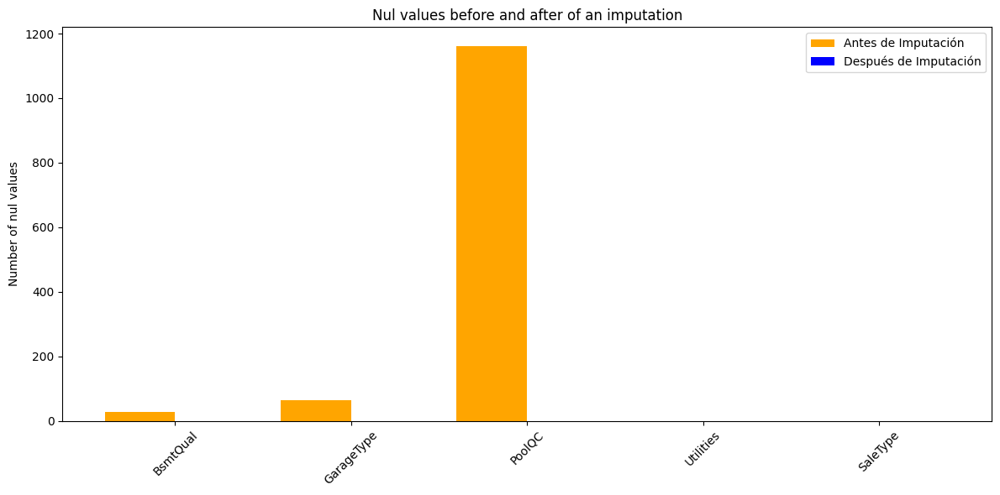

In [33]:
imputaciones_titulos = ["BsmtQual","GarageType","PoolQC", "Utilities", "SaleType"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_train[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_imputar_string(df_train_train, i, f"No {i}")

# Contar valores nulos después de la imputación
nulos_despues = [df_train_train[col].isnull().sum() for col in imputaciones_titulos]

# Crear gráfico: Valores Nulos Antes y Después de la Imputación
ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

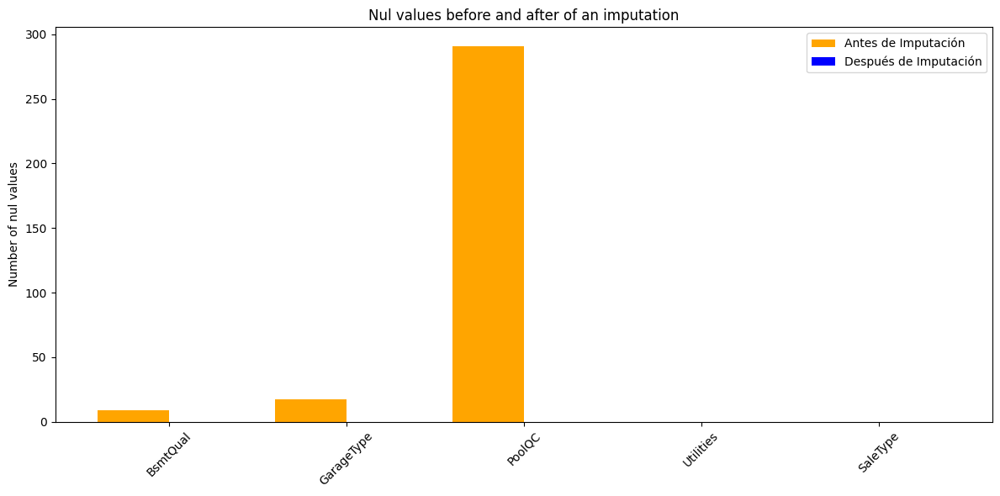

In [34]:
imputaciones_titulos = ["BsmtQual","GarageType","PoolQC", "Utilities", "SaleType"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_train_test[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_imputar_string(df_train_test, i, f"No {i}")

# Contar valores nulos después de la imputación
nulos_despues = [df_train_test[col].isnull().sum() for col in imputaciones_titulos]

# Crear gráfico: Valores Nulos Antes y Después de la Imputación
ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

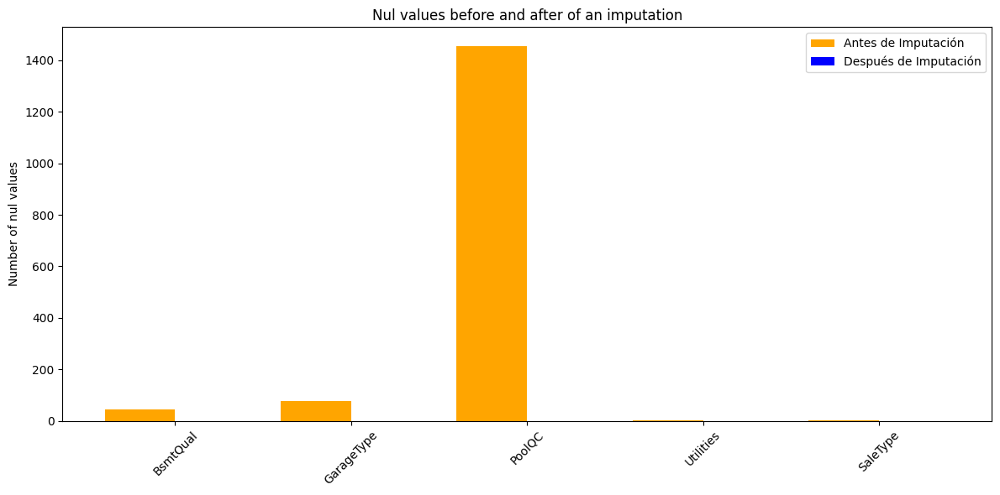

In [35]:
imputaciones_titulos = ["BsmtQual","GarageType","PoolQC", "Utilities", "SaleType"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_test[col].isnull().sum() for col in imputaciones_titulos]

for i in imputaciones_titulos:
    ft_imputar_string(df_test, i, f"No {i}")

# Contar valores nulos después de la imputación
nulos_despues = [df_test[col].isnull().sum() for col in imputaciones_titulos]

# Crear gráfico: Valores Nulos Antes y Después de la Imputación
ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

### Comprobación

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


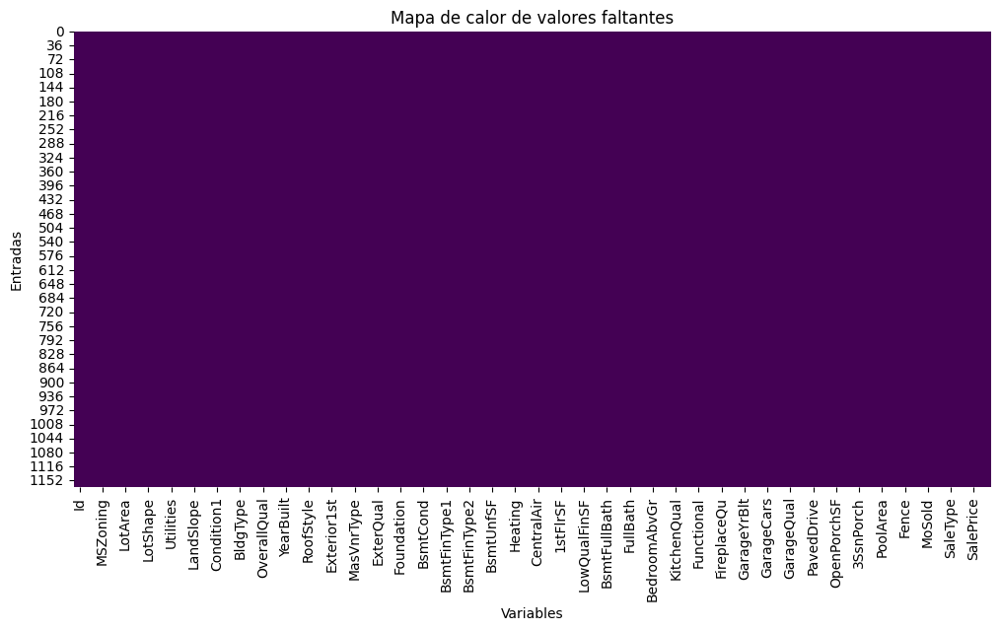

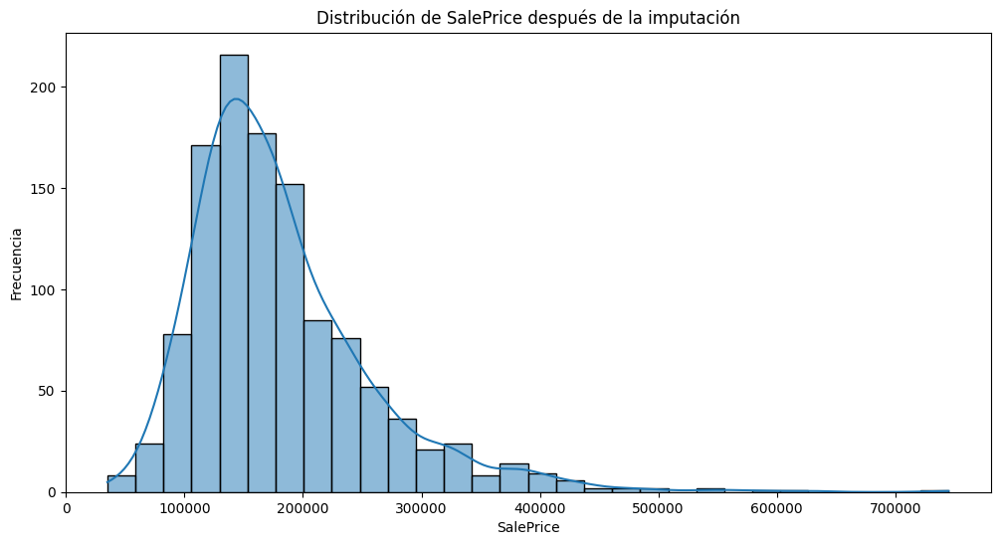

Series([], dtype: int64)


In [36]:
# Comprobación de valores nulos
ft_heatplot_missing_values(df_train_train)
# Distribución de SalePrice después de la imputación
ft_plot_distribution(df_train_train, 'SalePrice', 'después de la imputación')

# Número de valores nulos por columna
nulos = df_train_train.isnull().sum()

# Mostrar solo las columnas con nulos
nulos = nulos[nulos > 0]
print(nulos)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


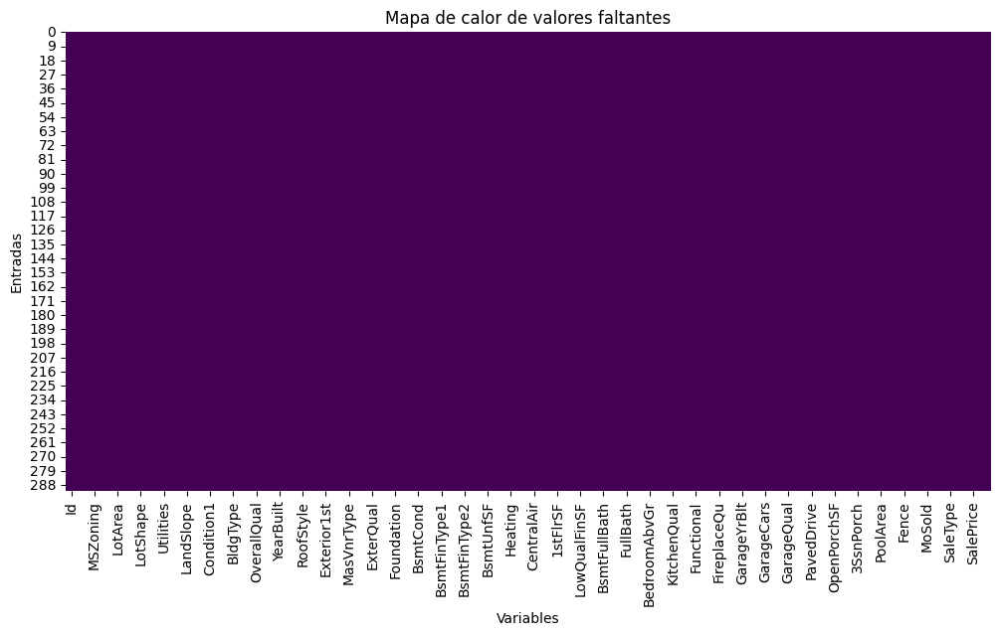

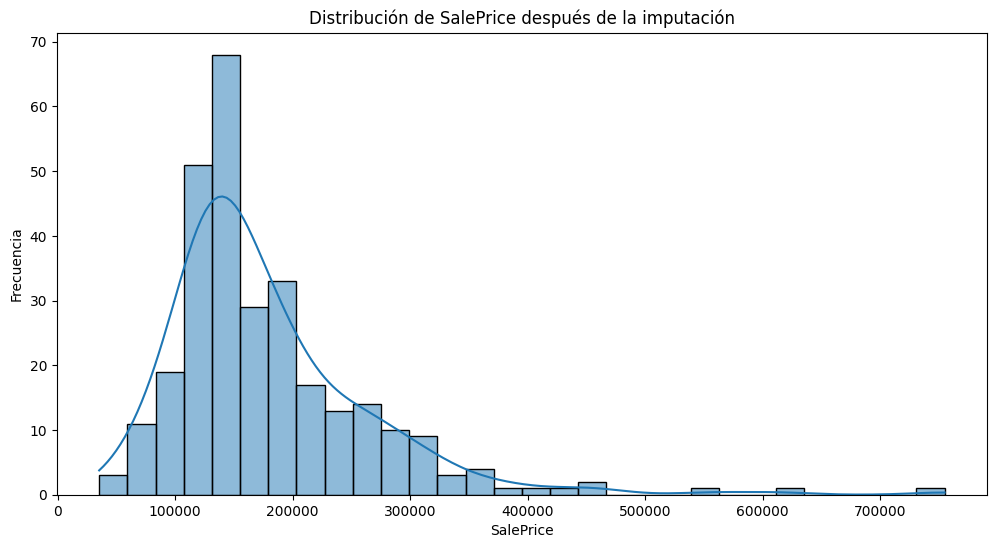

Series([], dtype: int64)


In [37]:
# Comprobación de valores nulos
ft_heatplot_missing_values(df_train_test)
# Distribución de SalePrice después de la imputación

ft_plot_distribution(df_train_test, 'SalePrice', 'después de la imputación')

# Número de valores nulos por columna
nulos = df_train_test.isnull().sum()

# Mostrar solo las columnas con nulos
nulos = nulos[nulos > 0]
print(nulos)

In [38]:
# Número de valores nulos por columna
nulos = df_test.isnull().sum()

# Mostrar solo las columnas con nulos
nulos = nulos[nulos > 0]
print(nulos)

BsmtFinSF1      1
BsmtFinSF2      1
BsmtUnfSF       1
TotalBsmtSF     1
BsmtFullBath    2
BsmtHalfBath    2
GarageCars      1
GarageArea      1
dtype: int64


In [39]:
# Ver los tipos de las columnas con nulos
tipos_columnas_nulas = df_test[nulos.index].dtypes
print(tipos_columnas_nulas)

BsmtFinSF1      float64
BsmtFinSF2      float64
BsmtUnfSF       float64
TotalBsmtSF     float64
BsmtFullBath    float64
BsmtHalfBath    float64
GarageCars      float64
GarageArea      float64
dtype: object


### Imputaciones 0

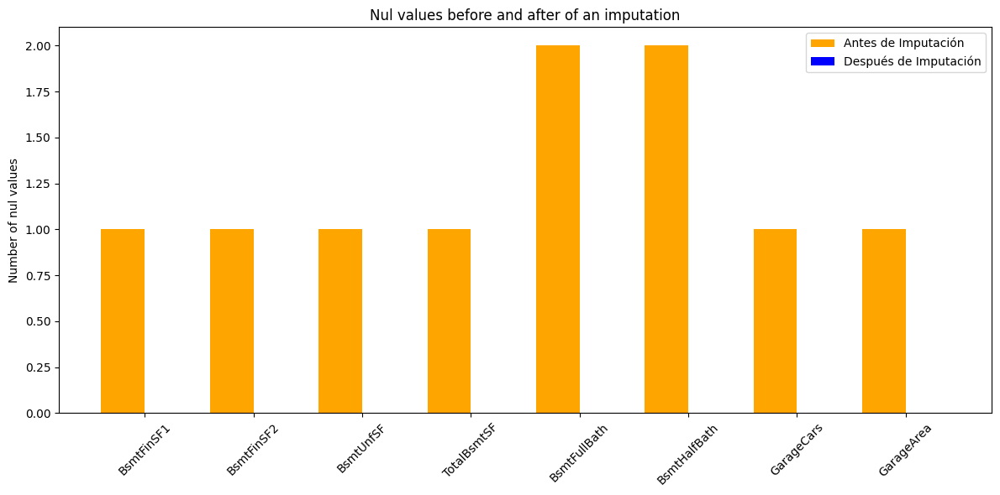

In [40]:
# Títulos de las columnas a imputar
imputaciones_titulos = ["BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", 
                        "TotalBsmtSF", "BsmtFullBath", "BsmtHalfBath", 
                        "GarageCars", "GarageArea"]

# Contar valores nulos antes de la imputación
nulos_antes = [df_test[col].isnull().sum() for col in imputaciones_titulos]

# Realizar la imputación con 0
for col in imputaciones_titulos:
    df_test[col] = df_test[col].fillna(0)

# Contar valores nulos después de la imputación
nulos_despues = [df_test[col].isnull().sum() for col in imputaciones_titulos]

ft_nulbefore_vs_nulafter(imputaciones_titulos, nulos_antes, nulos_despues)

In [41]:
# Número de valores nulos por columna
nulos = df_test.isnull().sum()

# Mostrar solo las columnas con nulos
nulos = nulos[nulos > 0]
print(nulos)

Series([], dtype: int64)


## Creación de Features

| **New Feature**                             | **Descripción**                                                                                                  | **Fórmula**                                                          |
|------------------------------------------------|------------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------|
| **Antigüedad de la Construcción**              | Diferencia entre el año de venta y el año de construcción.                                                        | `AntigüedadConstrucción = YrSold - YearBuilt`                        |
| **Tiempo desde la Última Remodelación**        | Tiempo transcurrido desde la última remodelación.                                                                  | `TiempoUltimaRemodelación = YrSold - YearRemodAdd`                   |
| **Total de Baños Combinados**                  | Número total de baños con peso específico para medios baños.                                                       | `TotalBaños = FullBath + 0.5 * HalfBath + BsmtFullBath + 0.5 * BsmtHalfBath` |
| **Porcentaje de Área del Garaje**              | Relación entre el área del garaje y el área total de la casa.                                                      | `PorcentajeAreaGaraje = GarageArea / (1stFlrSF + 2ndFlrSF + TotalBsmtSF)` |
| **Área Exterior Total**                        | Suma del espacio exterior disponible (como terrazas y porches).                                                    | `AreaExteriorTotal = WoodDeckSF + OpenPorchSF + EnclosedPorch`       |
| **Densidad de Habitaciones por Área**          | Densidad de habitaciones en relación con el área habitable.                                                        | `DensidadHabitaciones = TotRmsAbvGrd / GrLivArea`                    |
| **Relación entre Calidad y Condición General** | Medida compuesta de la calidad y condición general.                                                                | `CalidadCondiciónCompuesta = OverallQual * OverallCond`              |
| **Relación de Áreas Habitables y No Habitables**| Relación entre el área habitable y el área total de sótanos, porches, etc.                                         | `RelaciónÁreasHabitablesNoHabitables = GrLivArea / TotalBsmtSF`     |
BsmtSF`|

In [42]:
# 1. Antigüedad de la Construcción
df_train_train['AntigüedadConstrucción'] = df_train_train['YrSold'] - df_train_train['YearBuilt']

# 2. Tiempo desde la Última Remodelación
df_train_train['TiempoUltimaRemodelación'] = df_train_train['YrSold'] - df_train_train['YearRemodAdd']

# 3. Total de Baños Combinados
df_train_train['TotalBaños'] = df_train_train['FullBath'] + 0.5 * df_train_train['HalfBath'] + df_train_train['BsmtFullBath'] + 0.5 * df_train_train['BsmtHalfBath']

# 4. Porcentaje de Área del Garaje
# Protege contra la división por cero al reemplazar los ceros por NaN y luego calcular la relación
df_train_train['PorcentajeAreaGaraje'] = df_train_train['GarageArea'] / (
    df_train_train['1stFlrSF'] + df_train_train['2ndFlrSF'] + df_train_train['TotalBsmtSF']
).replace(0, np.nan)

# 5. Área Exterior Total
# No hay riesgo de división por cero, pero si alguna columna tiene valores negativos o NaN, se deben manejar
df_train_train['AreaExteriorTotal'] = df_train_train['WoodDeckSF'] + df_train_train['OpenPorchSF'] + df_train_train['EnclosedPorch']
df_train_train['AreaExteriorTotal'] = df_train_train['AreaExteriorTotal'].replace([np.inf, -np.inf], np.nan)

# 6. Densidad de Habitaciones por Área
# Protege contra la división por cero al reemplazar ceros por NaN en GrLivArea
df_train_train['DensidadHabitaciones'] = df_train_train['TotRmsAbvGrd'] / df_train_train['GrLivArea'].replace(0, np.nan)

# 7. Relación entre Calidad y Condición General
# No hay riesgos de valores infinitos, pero asegurémonos de que no haya valores nulos
df_train_train['CalidadCondiciónCompuesta'] = df_train_train['OverallQual'] * df_train_train['OverallCond']
df_train_train['CalidadCondiciónCompuesta'] = df_train_train['CalidadCondiciónCompuesta'].replace([np.inf, -np.inf], np.nan)

# 8. Relación de Áreas Habitables y No Habitables
# Protege contra la división por cero reemplazando ceros por NaN
df_train_train['RelaciónÁreasHabitablesNoHabitables'] = df_train_train['GrLivArea'] / df_train_train['TotRmsAbvGrd'].replace(0, np.nan)
df_train_train['RelaciónÁreasHabitablesNoHabitables'] = df_train_train['RelaciónÁreasHabitablesNoHabitables'].replace([np.inf, -np.inf], np.nan)

df_train_train.shape

(1168, 88)

In [43]:
# 1. Antigüedad de la Construcción
df_train_test['AntigüedadConstrucción'] = df_train_test['YrSold'] - df_train_test['YearBuilt']

# 2. Tiempo desde la Última Remodelación
df_train_test['TiempoUltimaRemodelación'] = df_train_test['YrSold'] - df_train_test['YearRemodAdd']

# 3. Total de Baños Combinados
df_train_test['TotalBaños'] = df_train_test['FullBath'] + 0.5 * df_train_test['HalfBath'] + df_train_test['BsmtFullBath'] + 0.5 * df_train_test['BsmtHalfBath']

# 4. Porcentaje de Área del Garaje
# Protege contra la división por cero al reemplazar los ceros por NaN y luego calcular la relación
df_train_test['PorcentajeAreaGaraje'] = df_train_test['GarageArea'] / (
    df_train_test['1stFlrSF'] + df_train_test['2ndFlrSF'] + df_train_test['TotalBsmtSF']
).replace(0, np.nan)

# 5. Área Exterior Total
# No hay riesgo de división por cero, pero si alguna columna tiene valores negativos o NaN, se deben manejar
df_train_test['AreaExteriorTotal'] = df_train_test['WoodDeckSF'] + df_train_test['OpenPorchSF'] + df_train_test['EnclosedPorch']
df_train_test['AreaExteriorTotal'] = df_train_test['AreaExteriorTotal'].replace([np.inf, -np.inf], np.nan)

# 6. Densidad de Habitaciones por Área
# Protege contra la división por cero al reemplazar ceros por NaN en GrLivArea
df_train_test['DensidadHabitaciones'] = df_train_test['TotRmsAbvGrd'] / df_train_test['GrLivArea'].replace(0, np.nan)

# 7. Relación entre Calidad y Condición General
# No hay riesgos de valores infinitos, pero asegurémonos de que no haya valores nulos
df_train_test['CalidadCondiciónCompuesta'] = df_train_test['OverallQual'] * df_train_test['OverallCond']
df_train_test['CalidadCondiciónCompuesta'] = df_train_test['CalidadCondiciónCompuesta'].replace([np.inf, -np.inf], np.nan)

# 8. Relación de Áreas Habitables y No Habitables
# Protege contra la división por cero reemplazando ceros por NaN
df_train_test['RelaciónÁreasHabitablesNoHabitables'] = df_train_test['GrLivArea'] / df_train_test['TotRmsAbvGrd'].replace(0, np.nan)
df_train_test['RelaciónÁreasHabitablesNoHabitables'] = df_train_test['RelaciónÁreasHabitablesNoHabitables'].replace([np.inf, -np.inf], np.nan)

df_train_test.shape

(292, 88)

In [44]:
# 1. Antigüedad de la Construcción
df_test['AntigüedadConstrucción'] = df_test['YrSold'] - df_test['YearBuilt']

# 2. Tiempo desde la Última Remodelación
df_test['TiempoUltimaRemodelación'] = df_test['YrSold'] - df_test['YearRemodAdd']

# 3. Total de Baños Combinados
df_test['TotalBaños'] = df_test['FullBath'] + 0.5 * df_test['HalfBath'] + df_test['BsmtFullBath'] + 0.5 * df_test['BsmtHalfBath']

# 4. Porcentaje de Área del Garaje
# Protege contra la división por cero al reemplazar los ceros por NaN y luego calcular la relación
df_test['PorcentajeAreaGaraje'] = df_test['GarageArea'] / (
    df_test['1stFlrSF'] + df_test['2ndFlrSF'] + df_test['TotalBsmtSF']
).replace(0, np.nan)

# 5. Área Exterior Total
# No hay riesgo de división por cero, pero si alguna columna tiene valores negativos o NaN, se deben manejar
df_test['AreaExteriorTotal'] = df_test['WoodDeckSF'] + df_test['OpenPorchSF'] + df_test['EnclosedPorch']
df_test['AreaExteriorTotal'] = df_test['AreaExteriorTotal'].replace([np.inf, -np.inf], np.nan)

# 6. Densidad de Habitaciones por Área
# Protege contra la división por cero al reemplazar ceros por NaN en GrLivArea
df_test['DensidadHabitaciones'] = df_test['TotRmsAbvGrd'] / df_test['GrLivArea'].replace(0, np.nan)

# 7. Relación entre Calidad y Condición General
# No hay riesgos de valores infinitos, pero asegurémonos de que no haya valores nulos
df_test['CalidadCondiciónCompuesta'] = df_test['OverallQual'] * df_test['OverallCond']
df_test['CalidadCondiciónCompuesta'] = df_test['CalidadCondiciónCompuesta'].replace([np.inf, -np.inf], np.nan)

# 8. Relación de Áreas Habitables y No Habitables
# Protege contra la división por cero reemplazando ceros por NaN
df_test['RelaciónÁreasHabitablesNoHabitables'] = df_test['GrLivArea'] / df_test['TotRmsAbvGrd'].replace(0, np.nan)
df_test['RelaciónÁreasHabitablesNoHabitables'] = df_test['RelaciónÁreasHabitablesNoHabitables'].replace([np.inf, -np.inf], np.nan)

df_test.shape

(1459, 87)

## Manejo de Outliers

Los outliers en variables numéricas pueden tener un impacto en las métricas del modelo y en la efectividad de técnicas como la normalización o estandarización.

- **Identificación de Outliers**
  - Método Intercuartílico (IQR): Calculamos el rango intercuartílico para las variables continuas y definimos como outliers aquellos valores fuera de 𝑄1 − 1.5 × 𝐼𝑄𝑅 o 𝑄3 + 1.5 × 𝐼𝑄𝑅
  - Visualización con diagramas de caja: Podemos ver visualmente los outliers en cada variable relevante.
  - Distribuciones Asimétricas: Usar histogramas o gráficos de dispersión para identificar valores extremos en distribuciones con colas largas.
- **Decisión y Manejo**
  - Ajuste: Reducir el impacto de los outliers aplicando transformaciones logarítmicas o normalización.
  - Eliminación: Para valores extremos que distorsionan demasiado la distribución y no aportan información.
  - Transformación: Si los outliers están asociados a una variable objetivo, como SalePrice, aplicar transformaciones que estabilicen la varianza.

In [45]:
# Lista de columnas a analizar, incluyendo las nuevas features
columns_to_check = [
    'LotArea', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 
    'TotalBsmtSF', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 
    'EnclosedPorch', '3SsnPorch', 'SalePrice', 'OverallQual', 
    'OverallCond', 'MasVnrArea', 'GarageCars', 
    'LotFrontage', 'YearBuilt', 'YearRemodAdd', 
    'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 
    'Fireplaces', 
    'AntigüedadConstrucción', 'TiempoUltimaRemodelación', 'TotalBaños', 
    'PorcentajeAreaGaraje', 'AreaExteriorTotal', 'DensidadHabitaciones', 
    'CalidadCondiciónCompuesta', 'RelaciónÁreasHabitablesNoHabitables'
]

# Crear una lista para almacenar los resultados
outliers_list = []
for i in columns_to_check:
    outliers = ft_detect_outliers_iqr(df_train_train[i])
    count_outliers = outliers.sum()  # Contar los True (outliers)
    outliers_list.append({'Column': i, 'Outlier Count': count_outliers})

# Crear un DataFrame a partir de la lista de resultados
outliers_count = pd.DataFrame(outliers_list)

outliers_count

,Column,Outlier Count
0,LotArea,54
1,1stFlrSF,13
2,2ndFlrSF,1
3,GrLivArea,23
4,TotalBsmtSF,47
5,GarageArea,18
6,WoodDeckSF,30
7,OpenPorchSF,60
8,EnclosedPorch,160
9,3SsnPorch,20


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


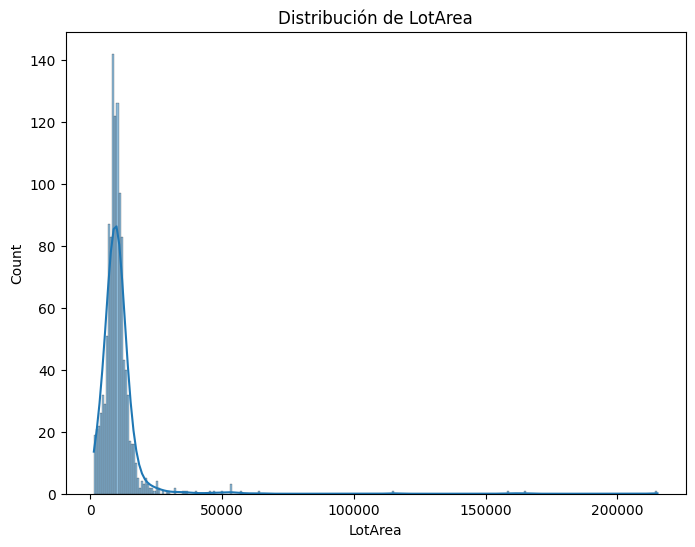

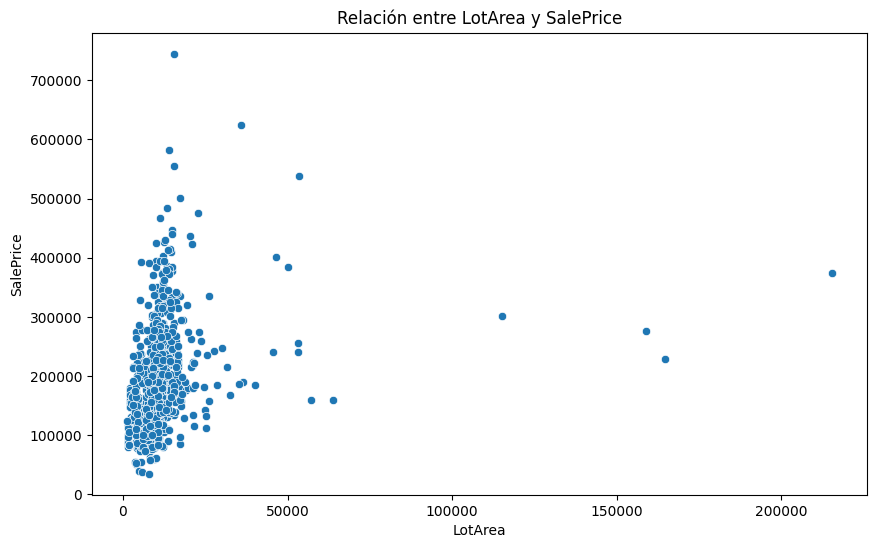

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


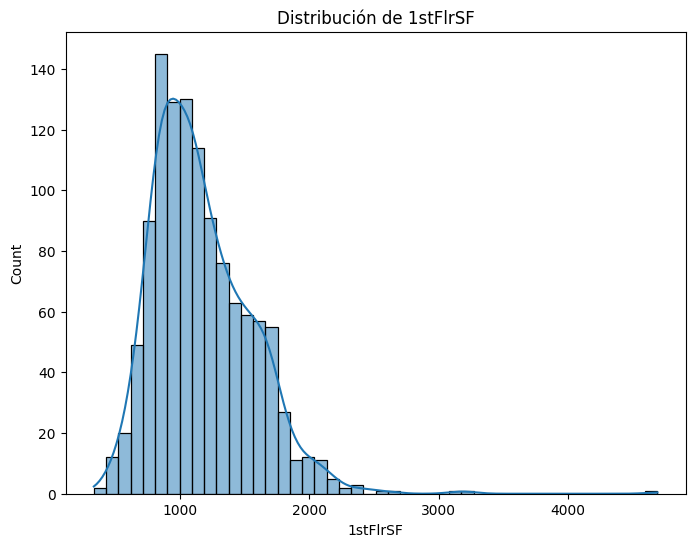

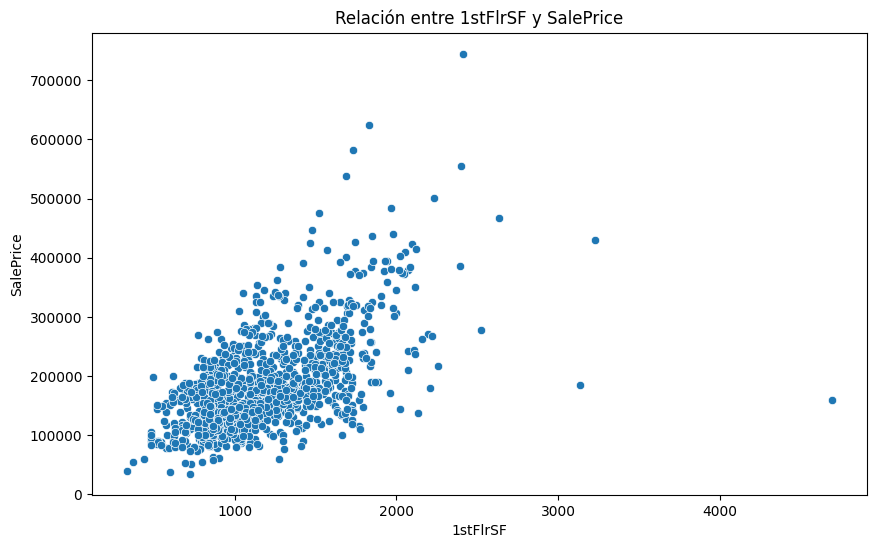

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


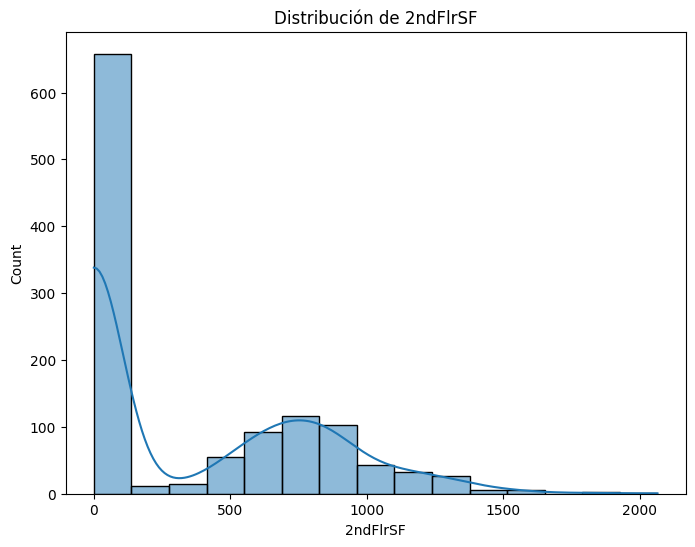

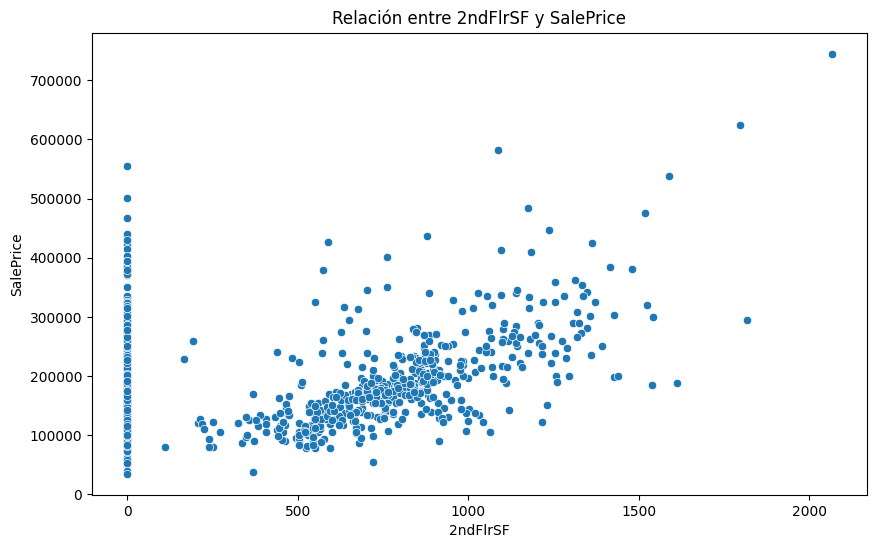

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


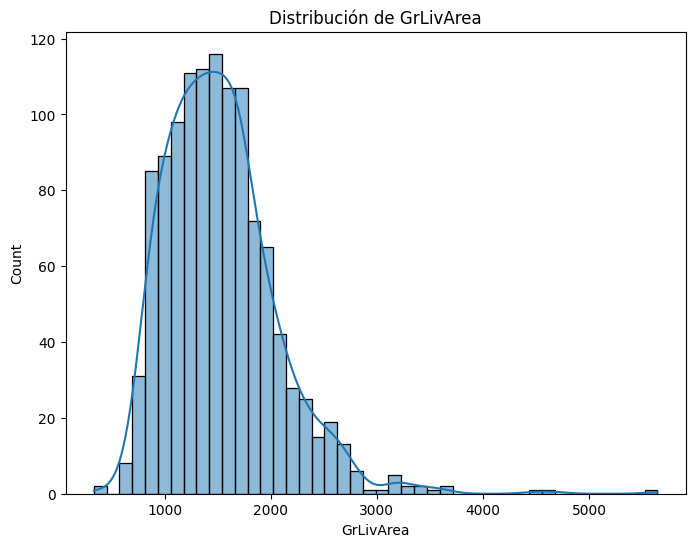

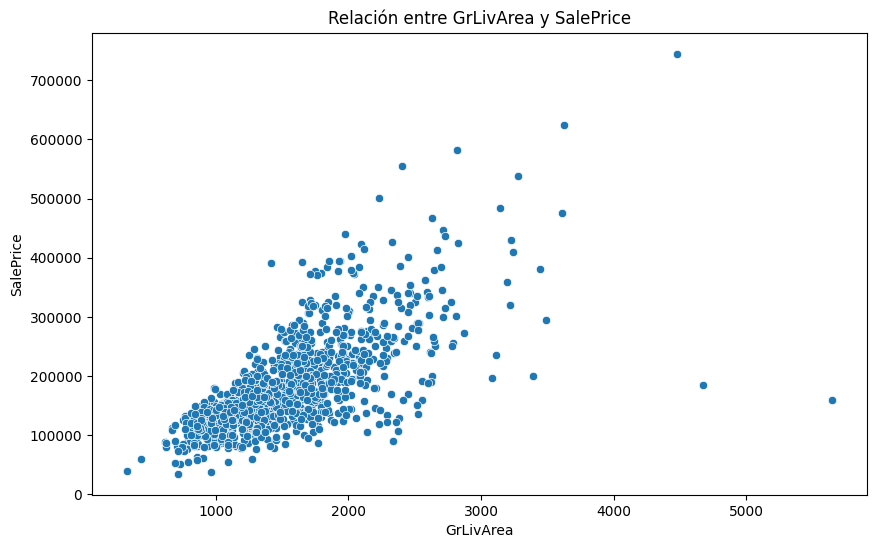

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


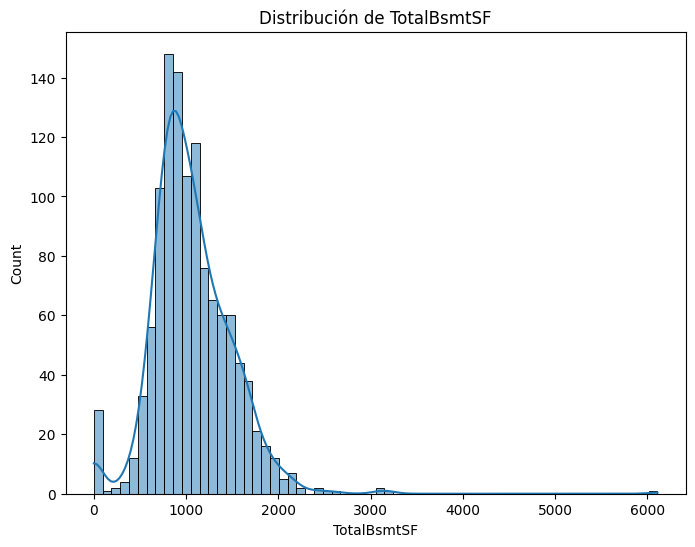

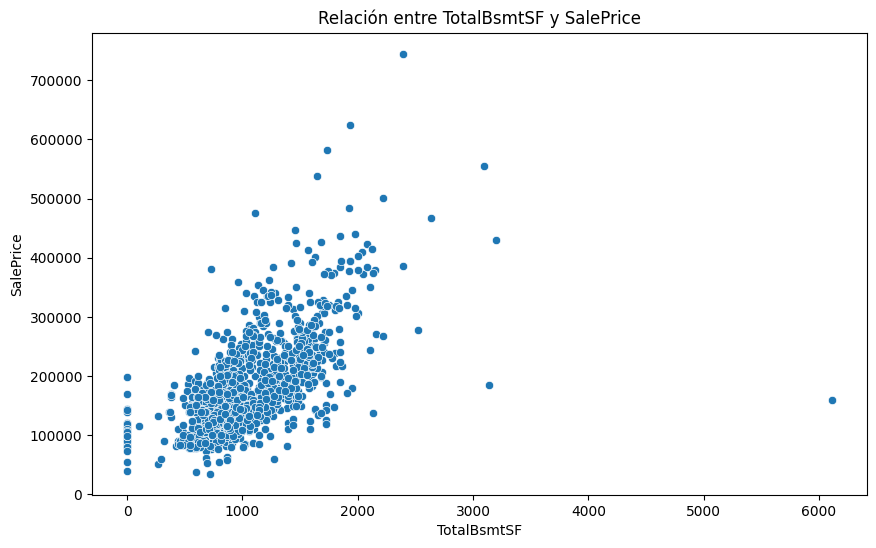

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


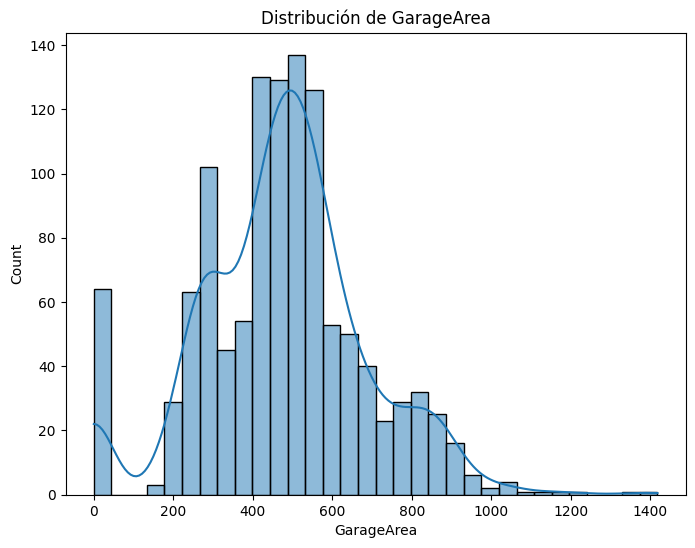

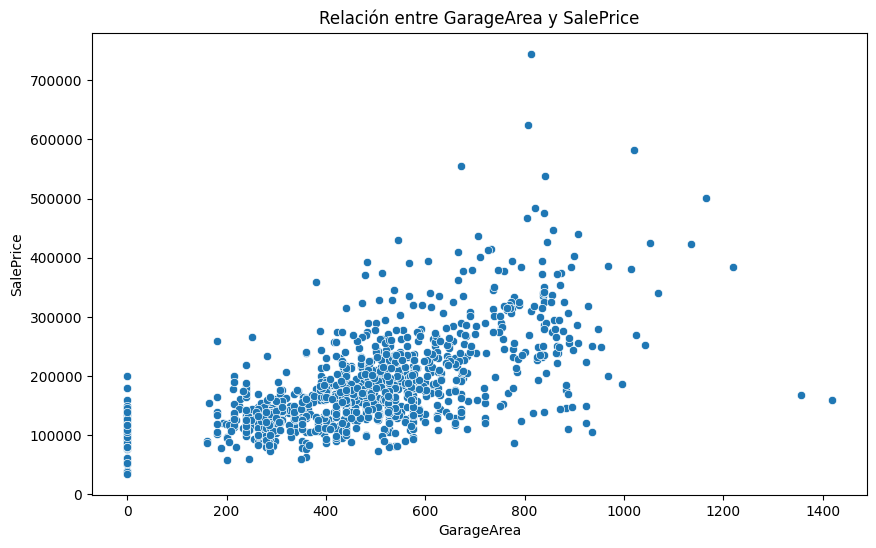

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


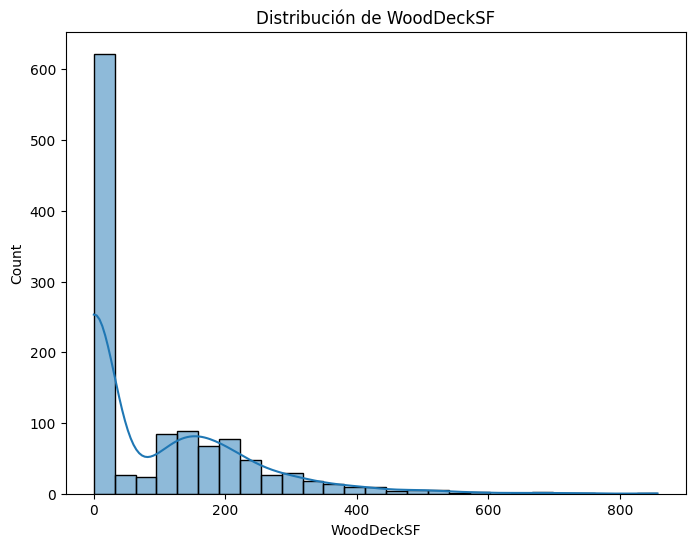

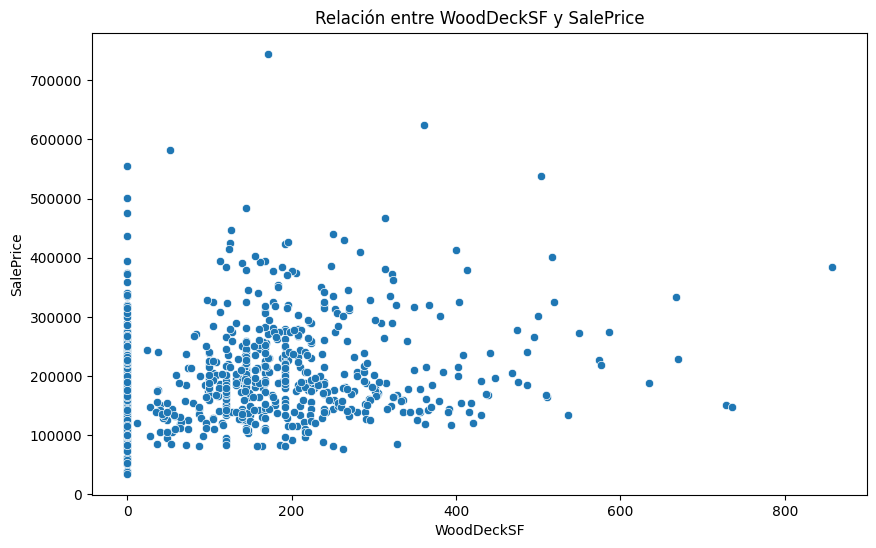

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


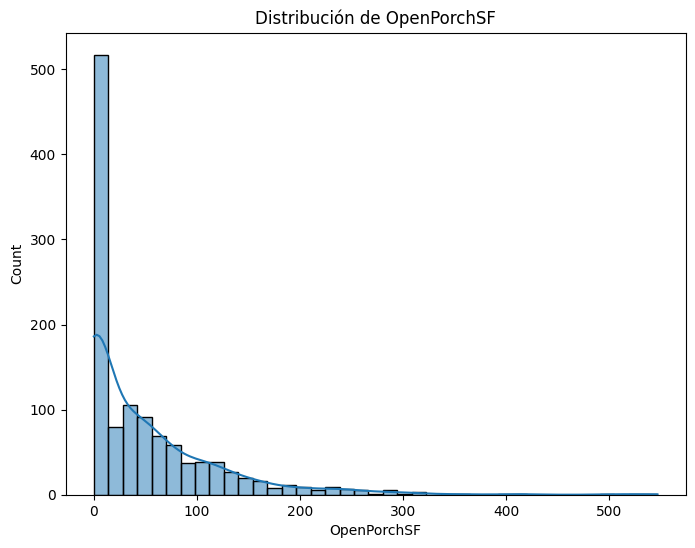

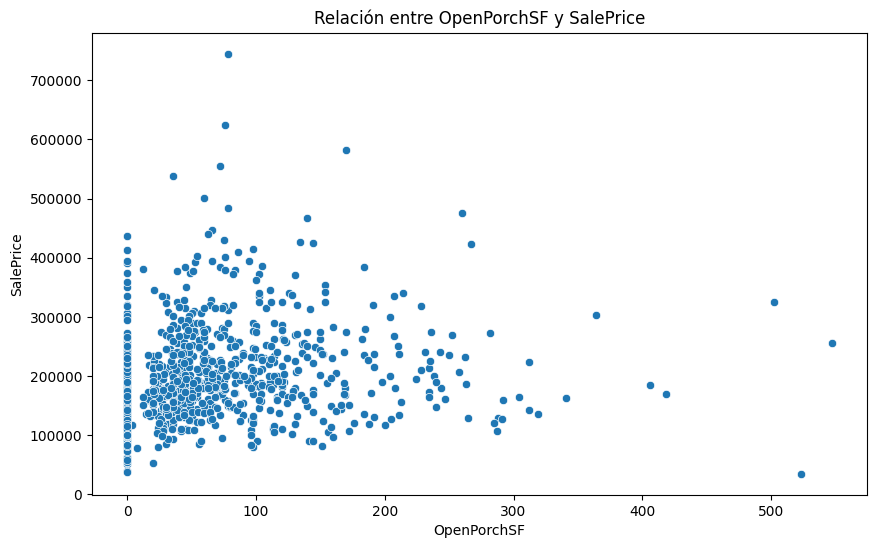

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


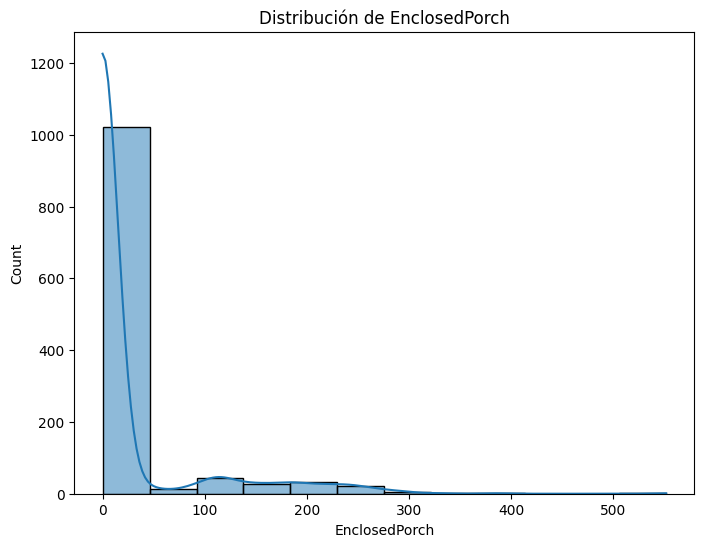

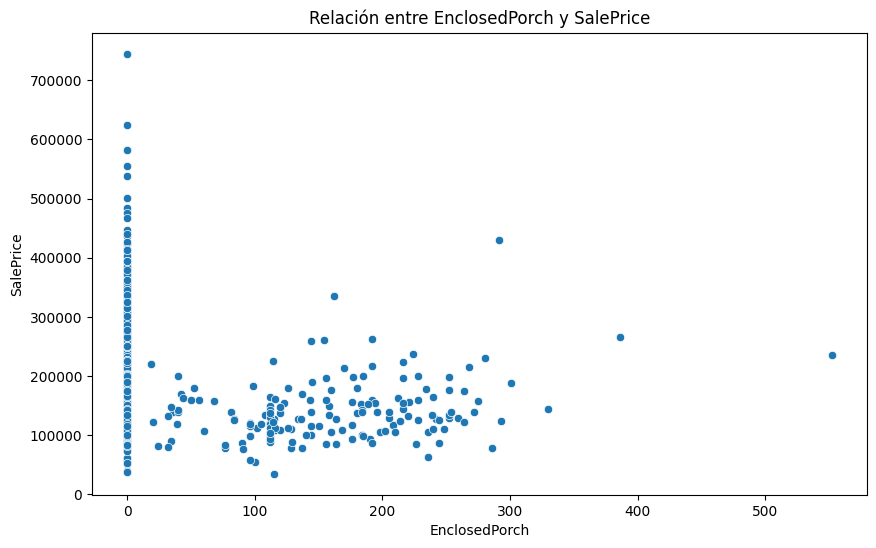

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


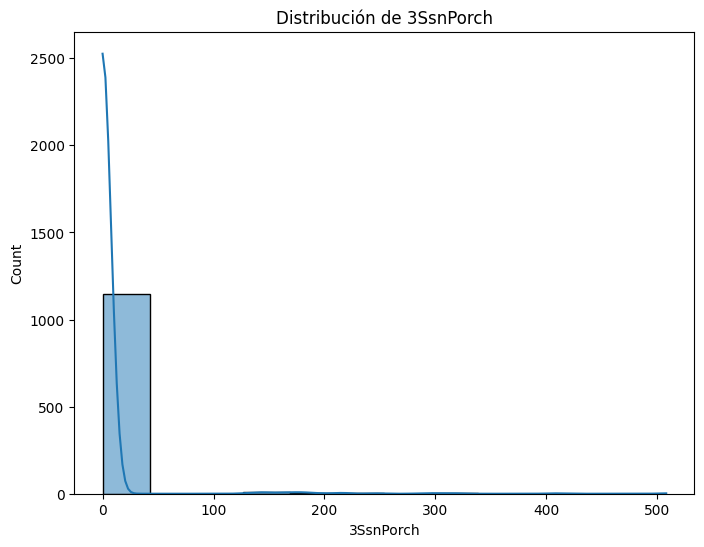

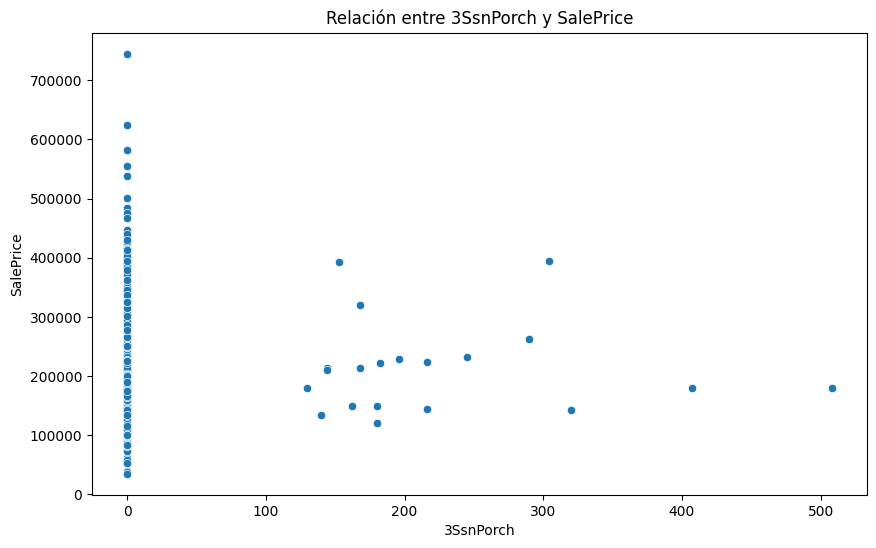

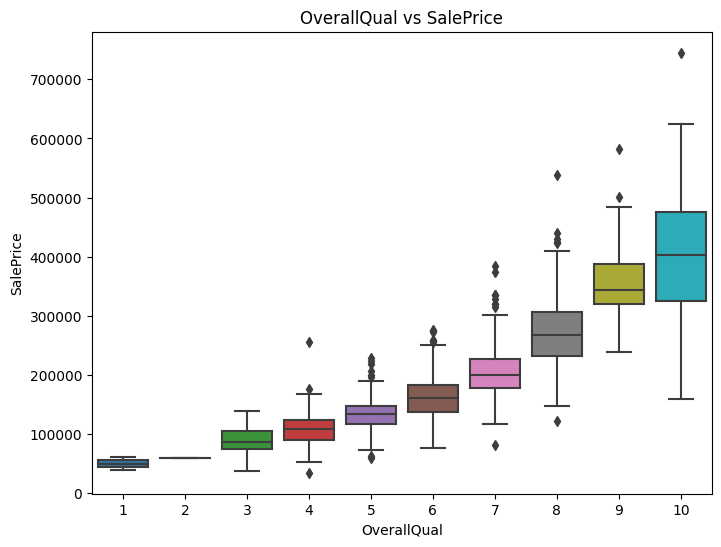

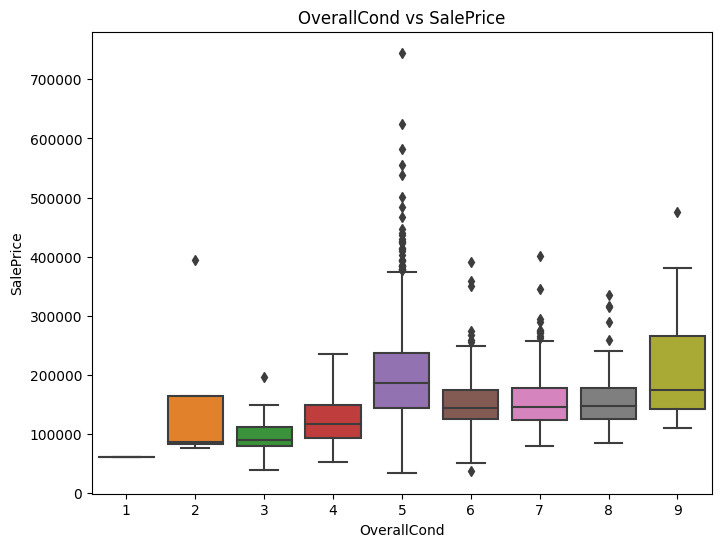

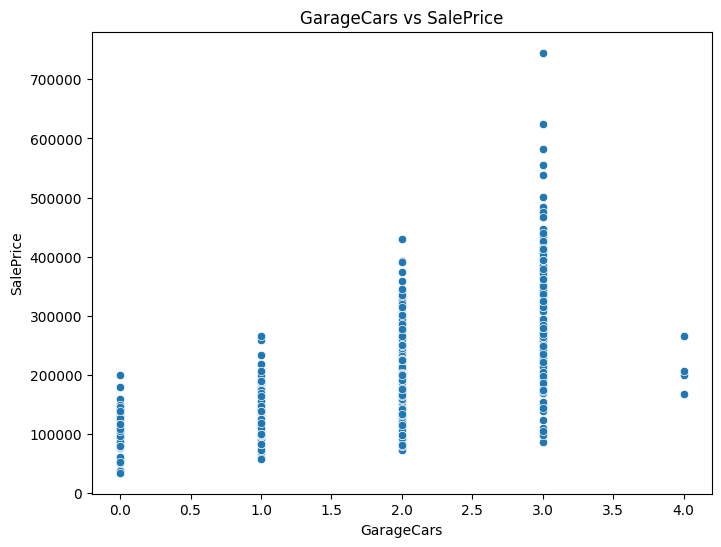

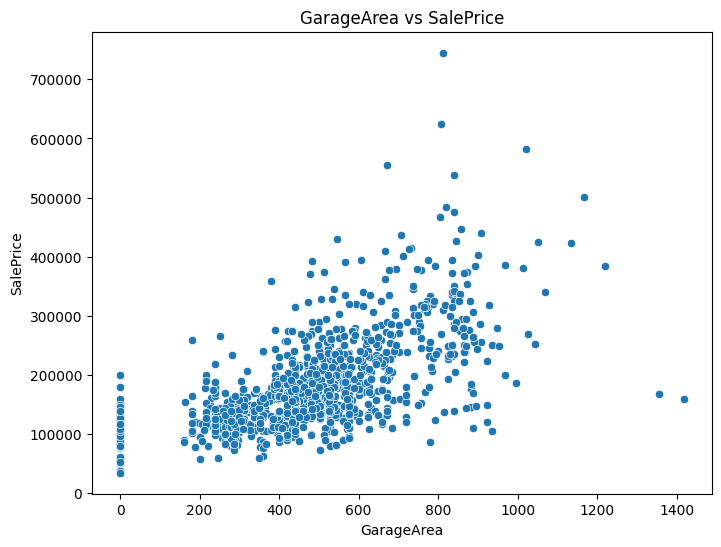

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


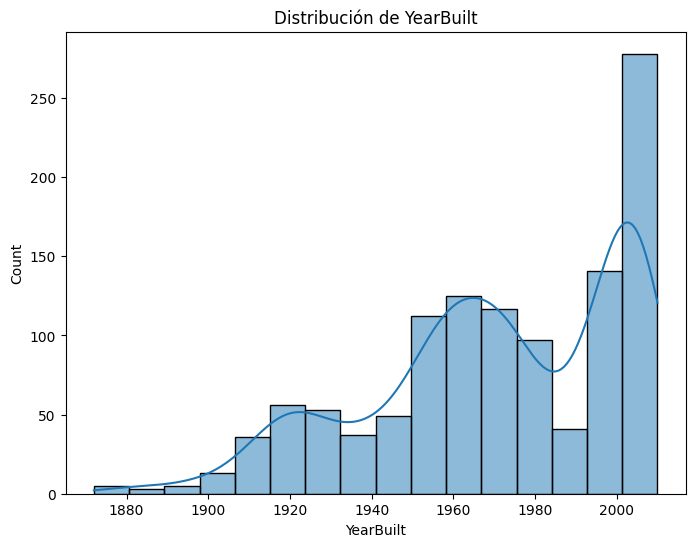

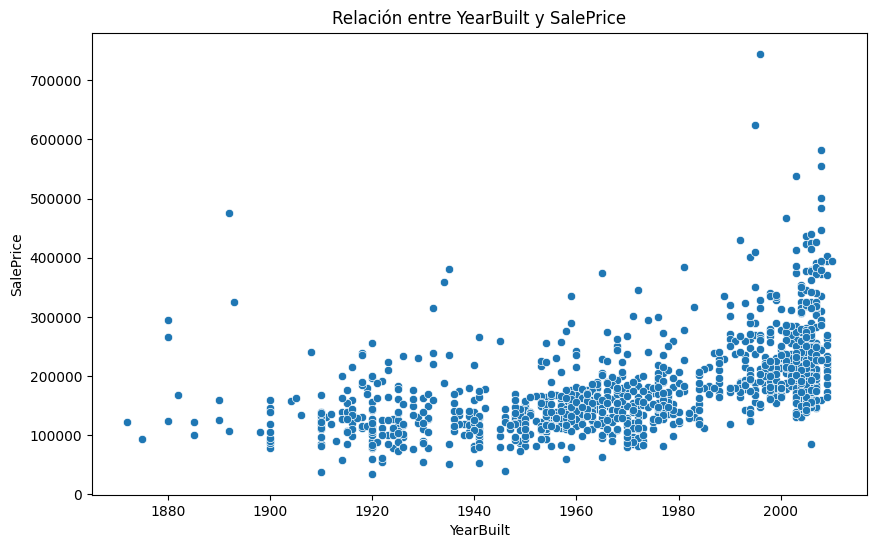

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


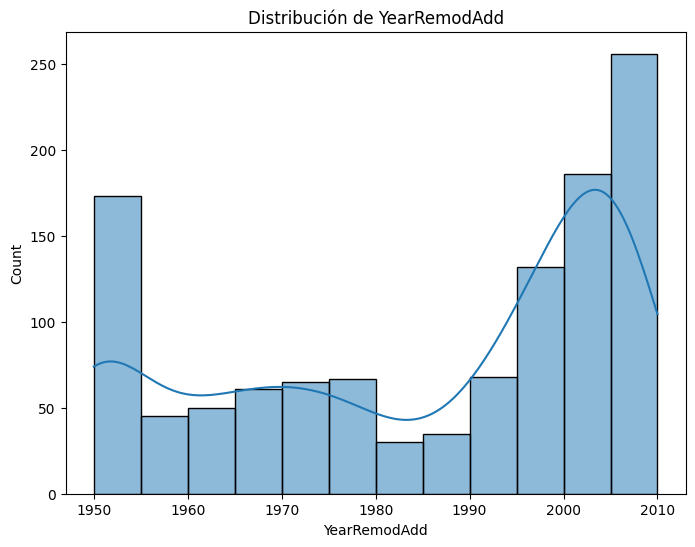

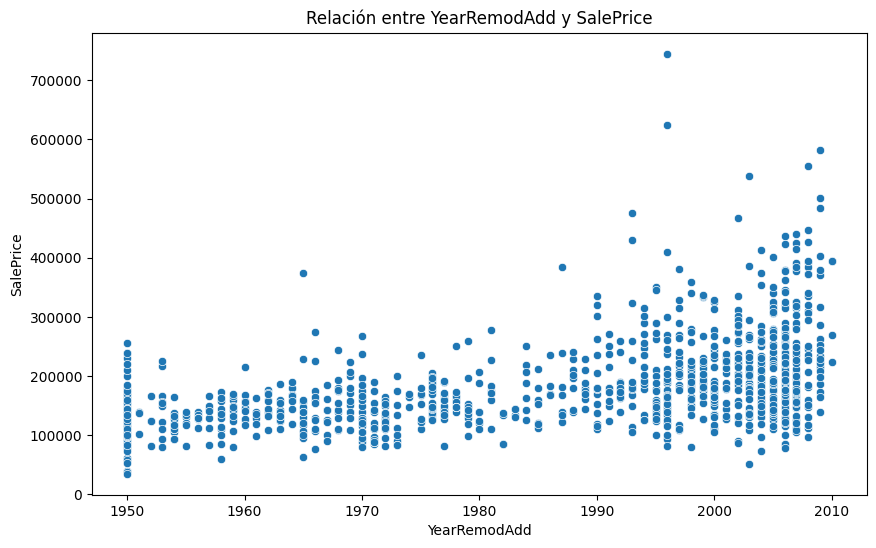

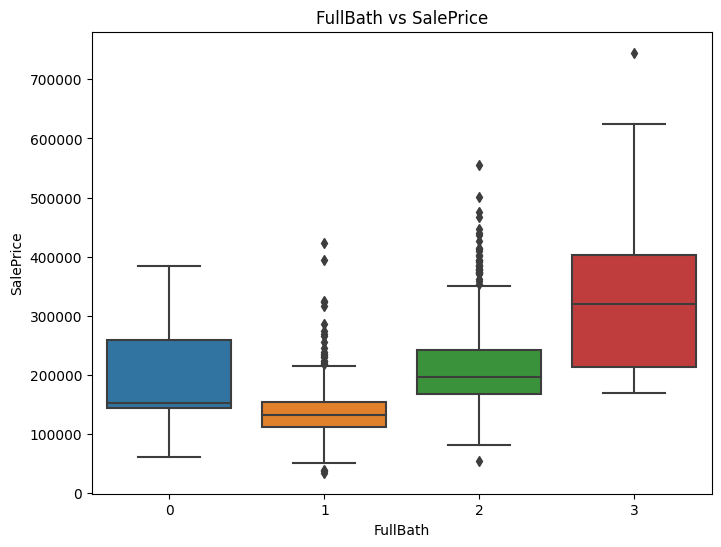

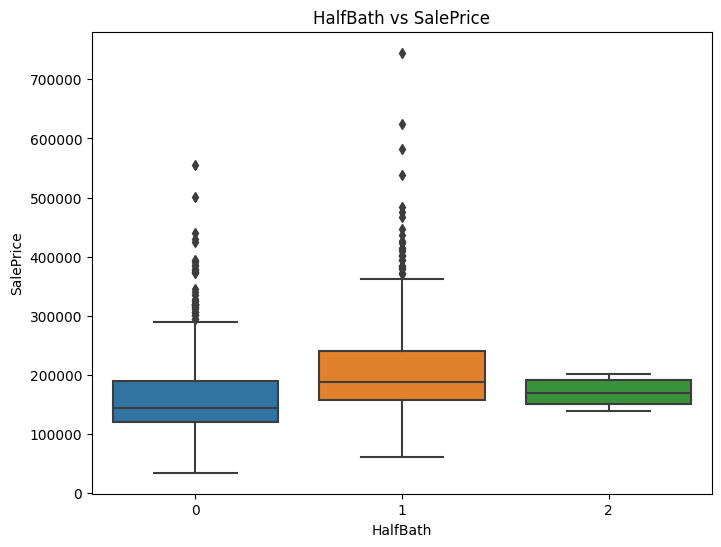

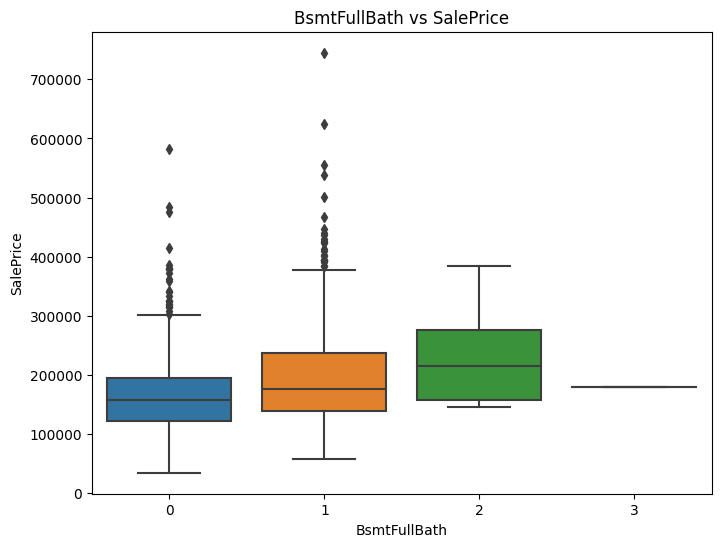

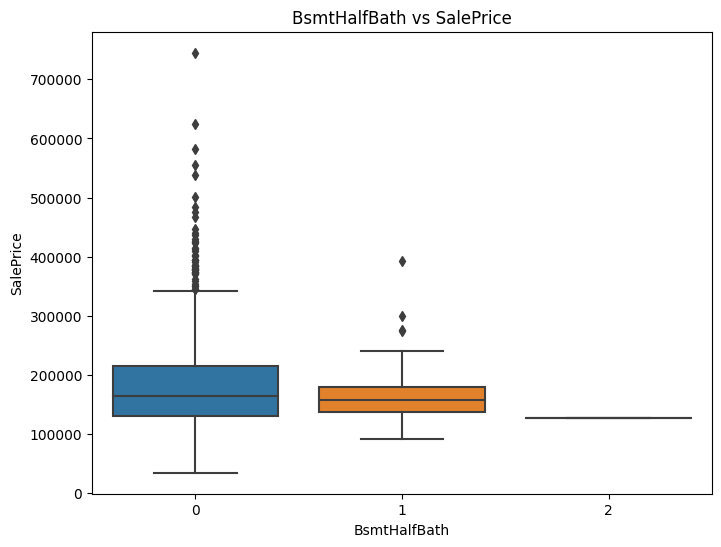

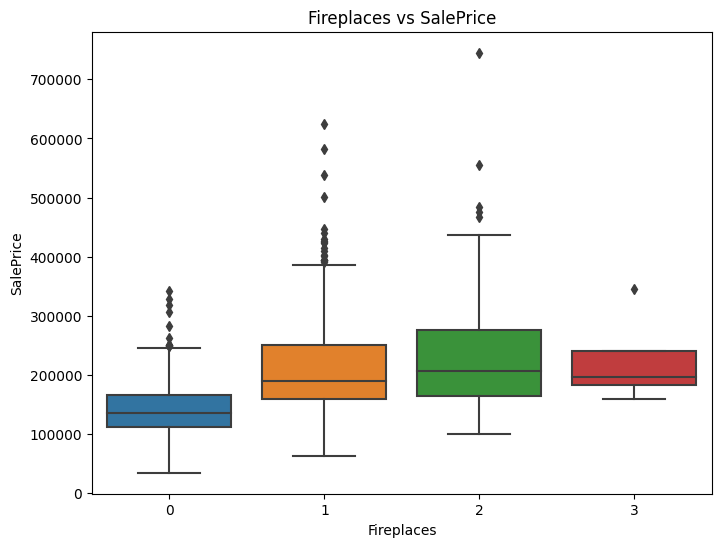

In [46]:
# Llamar a todas las funciones
analizar_espacio_vivienda(df_train_train)       # Función para analizar espacios de vivienda y área total
analizar_porches_terrazas(df_train_train)       # Función para analizar características exteriores y espacios adicionales
analizar_calificacion_condicion(df_train_train) # Función para analizar calidad y condiciones de la propiedad
analizar_garaje(df_train_train)                 # Función para analizar garage y estacionamiento
analizar_antiguedad_remodelacion(df_train_train) # Función para analizar antigüedad y remodelación
analizar_outliers_individuales(df_train_train)  # Función para analizar baños y chimeneas

### Análisis de Outliers por Columna y Propuestas de Tratamiento

| **Columna**             | **Número de Outliers** | **Tratamiento Sugerido**                                                                                                                                                  |
|-------------------------|------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **LotArea**             | 54                     | Revisa los valores extremos y verifica si representan terrenos de gran tamaño. Podría ser necesario eliminar los valores que se desvíen demasiado de la distribución normal o hacer una transformación logarítmica. |
| **1stFlrSF**            | 13                     | Evalúa si los valores extremos corresponden a casas con extensiones inusuales o grandes. Si se consideran válidos, mantén los outliers.                                   |
| **2ndFlrSF**            | 1                      | Un solo valor extremo, podría ser el resultado de una extensión especial del segundo piso. Verifica si es coherente con la propiedad.                                      |
| **GrLivArea**           | 23                     | Asegúrate de que los valores atípicos sean consistentes con el tipo de propiedad (casas grandes). Si no lo son, elimina los outliers.                                     |
| **TotalBsmtSF**         | 47                     | Verifica la consistencia entre TotalBsmtSF y GrLivArea para asegurar que no haya incoherencias. Si se detectan errores o valores inconsistentes, elimina los outliers.   |
| **GarageArea**          | 18                     | Revisa si los valores extremos corresponden a propiedades con garajes inusualmente grandes. Si no, elimina los outliers.                                                 |
| **WoodDeckSF**          | 30                     | Analiza si los outliers son coherentes con el tamaño de la propiedad. Si es un error de entrada, elimina los outliers.                                                    |
| **OpenPorchSF**         | 60                     | Revisa si los valores extremos son válidos, especialmente en propiedades con porches amplios. Si son errores, elimina los outliers.                                        |
| **EnclosedPorch**       | 160                    | Dado el alto número de outliers, revisa si estos valores corresponden a propiedades con porches cerrados grandes o a errores. Puede que sea necesario eliminar valores extremos. |
| **3SsnPorch**           | 20                     | Evalúa si los valores extremos corresponden a casas con características inusuales (porches de tres estaciones). Mantén los valores válidos y elimina los errores de entrada.  |
| **SalePrice**           | 48                     | A menudo, los valores extremos de SalePrice representan propiedades de alto valor o con características especiales. Mantén los outliers que son coherentes con otras características del inmueble. |
| **OverallQual**         | 2                      | Los valores extremos de OverallQual podrían reflejar una propiedad de alta o baja calidad. Mantén estos outliers si son válidos.                                        |
| **OverallCond**         | 99                     | Verifica la coherencia de los valores extremos. Si los valores parecen poco realistas, puede que sea necesario eliminarlos.                                                |
| **MasVnrArea**          | 0                      | No hay outliers en esta columna, no es necesario realizar ningún ajuste.                                                                                                 |
| **GarageCars**          | 4                      | Verifica si los valores que superan los tres coches son coherentes con la capacidad del garaje (y GarageArea). Mantén los val
válidos y elimina los outliers si son incoherentes. |
| **LotFrontage**         | 85                     | Los valores extremos de LotFrontage podrían ser consecuencia de terrenos inusuales. Mantén los valores coherentes con otras características del inmueble.                 |
| **YearBuilt**           | 5                      | Asegúrate de que los valores extremos no sean errores de entrada. Los años de construcción antiguos suelen ser válidos si tienen sentido dentro del contexto histórico de la zona. |
| **YearRemodAdd**        | 0                      | No hay outliers en esta columna, no se necesita tratamiento.                                                                                                             |
| **FullBath**            | 0                      | No hay outliers en esta columna, no se necesita tratamiento.                                                                                                             |
| **HalfBath**            | 0                      | No hay outliers en esta columna, no se necesita tratamiento.                                                                                                             |
| **BsmtFullBath**        | 1                      | Un único outlier, probablemente válido si representa una propiedad específica. Si es inconsistente, elimínalo.                                                           |
| **BsmtHalfBath**        | 66                     | Revisa si los outliers corresponden a propiedades con características especiales en el sótano. Si es necesario, elimina los valores extremos.                           |
| **Fireplaces**          | 4                      | Los valores de Fireplaces pueden ser coherentes con propiedades de lujo que tienen más chimeneas. Mantén los outliers si son válidos.                                    |
| **AntigüedadConstrucción** | 4                    | Si los valores extremos corresponden a edificios con antigüedad significativa, podrían ser válidos. Mantén los valores si son razonables.                               |
| **TiempoUltimaRemodelación** | 0                  | No hay outliers en esta columna, no es necesario tratamiento.                                                                                                           |
| **TotalBaños**          | 302                    | Esta columna tiene un número elevado de outliers. Deberías revisar las casas con valores extremos y decidir si deben eliminarse o corregirse.                           |
| **PorcentajeAreaGaraje**| 97                     | Revisa si estos valores son extremos debido a propiedades con garajes inusuales o si son errores de entrada.                                                            |


## Transformaciones

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


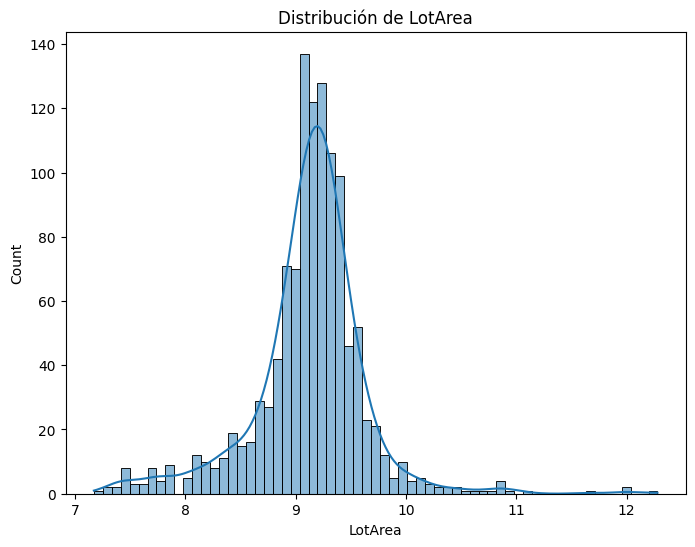

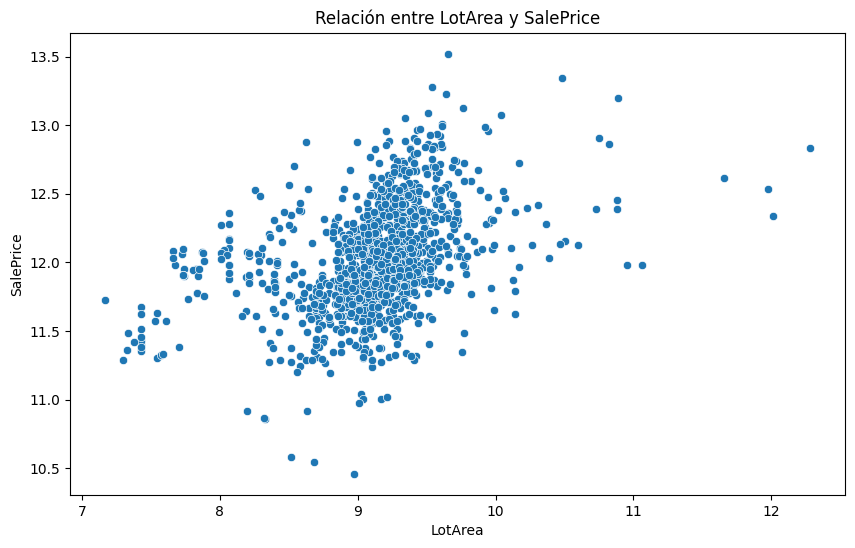

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


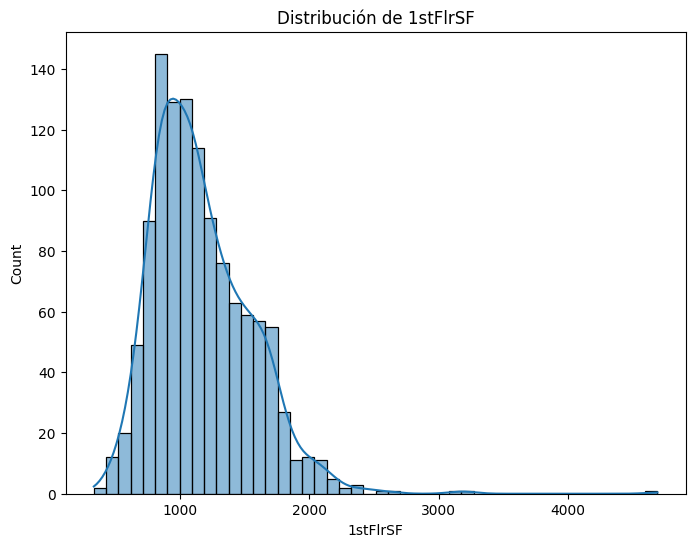

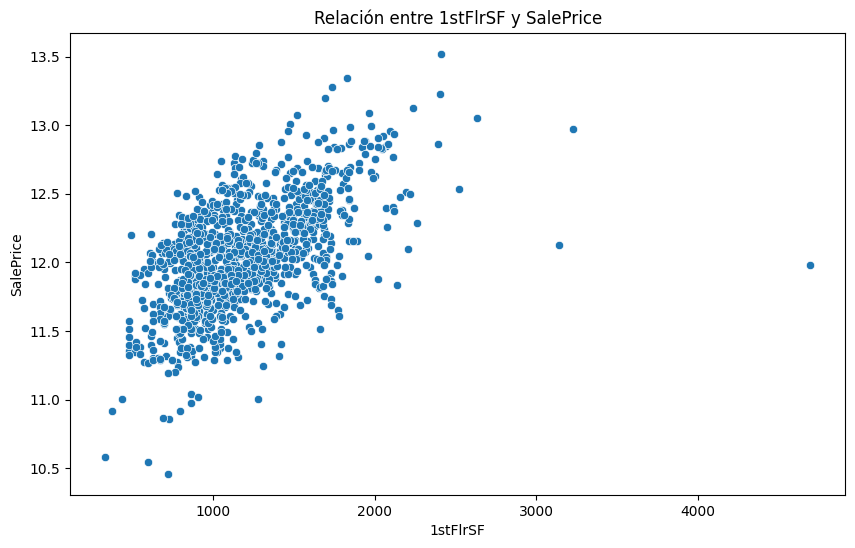

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


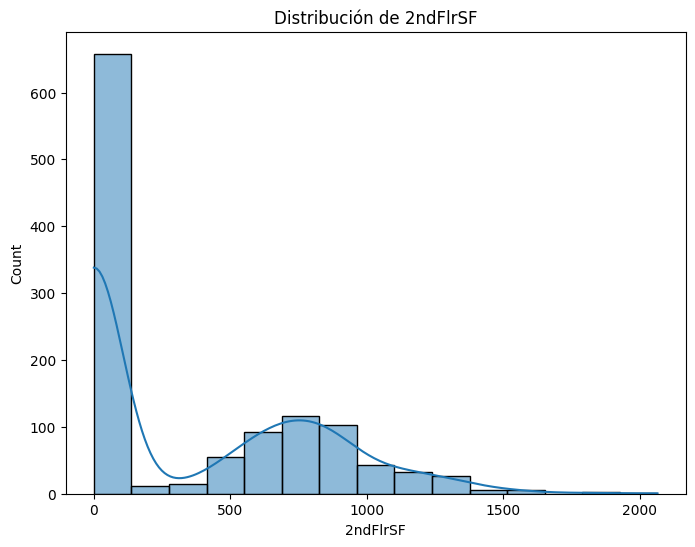

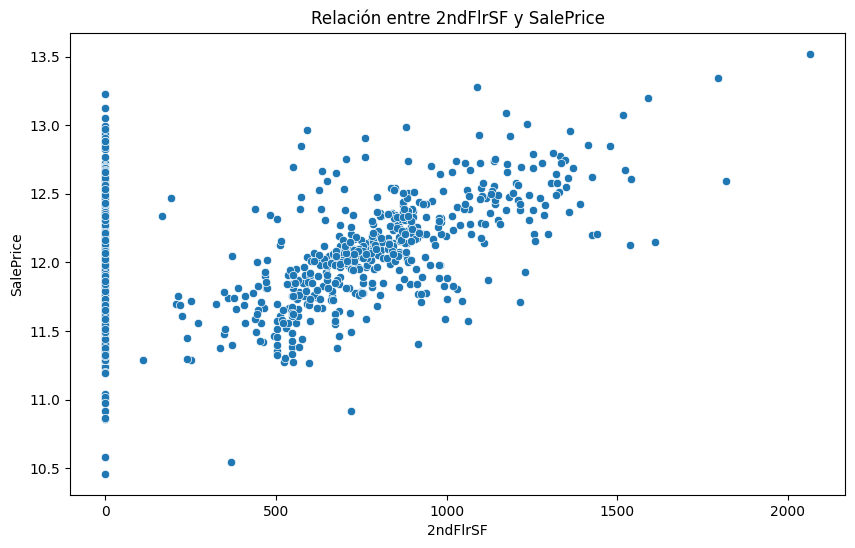

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


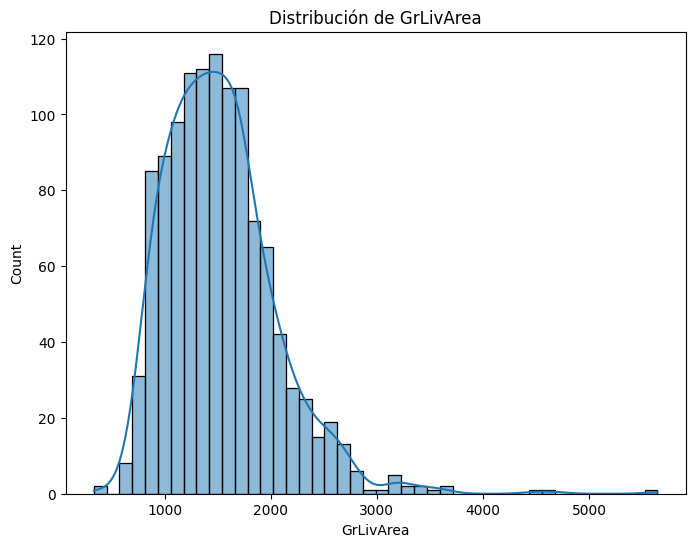

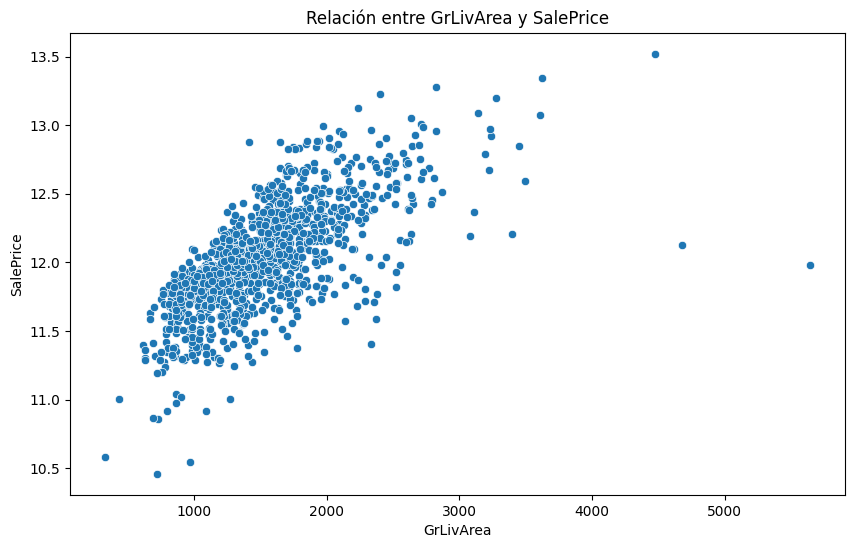

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


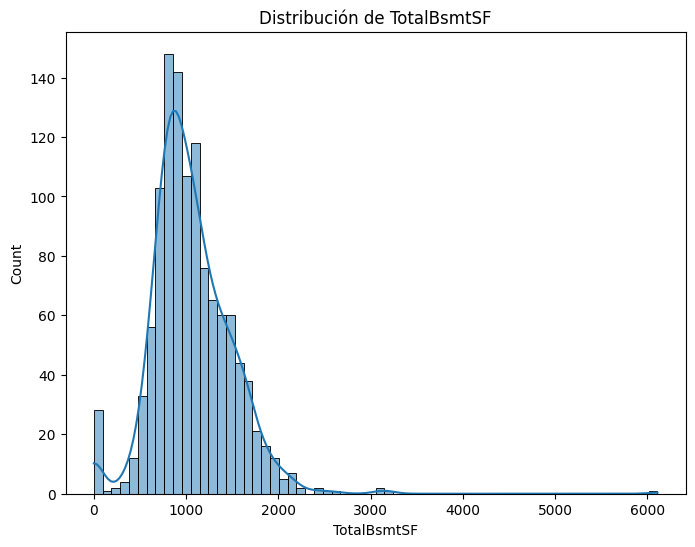

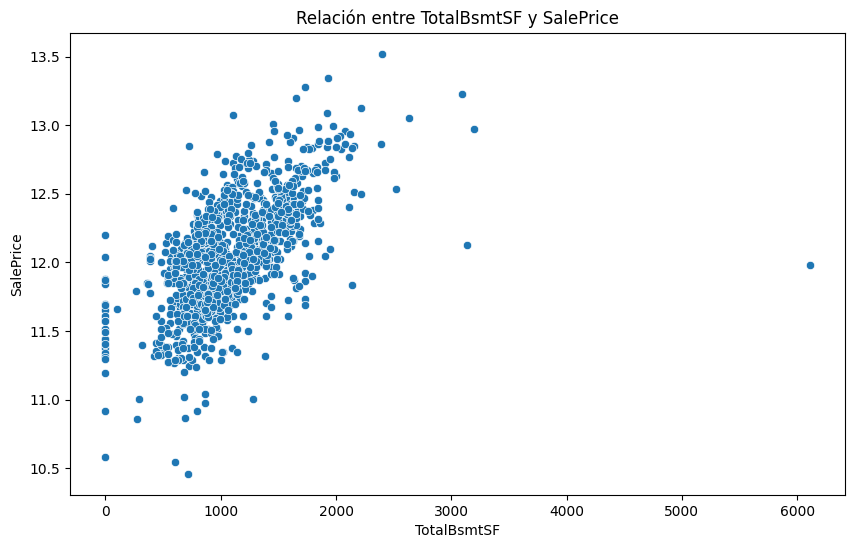

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


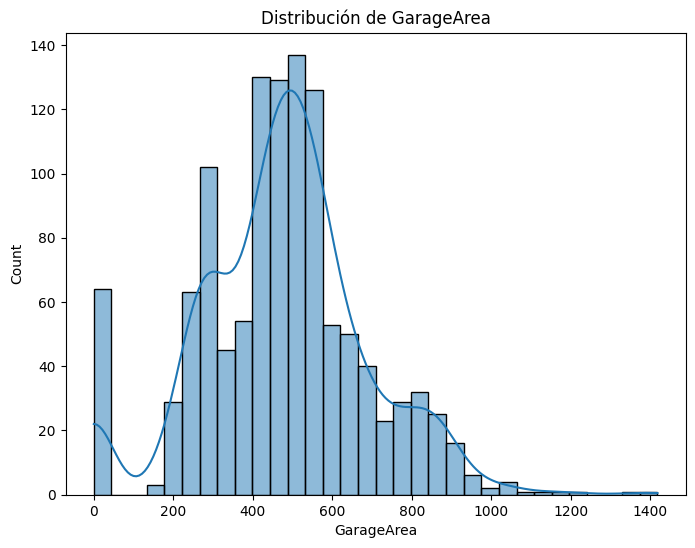

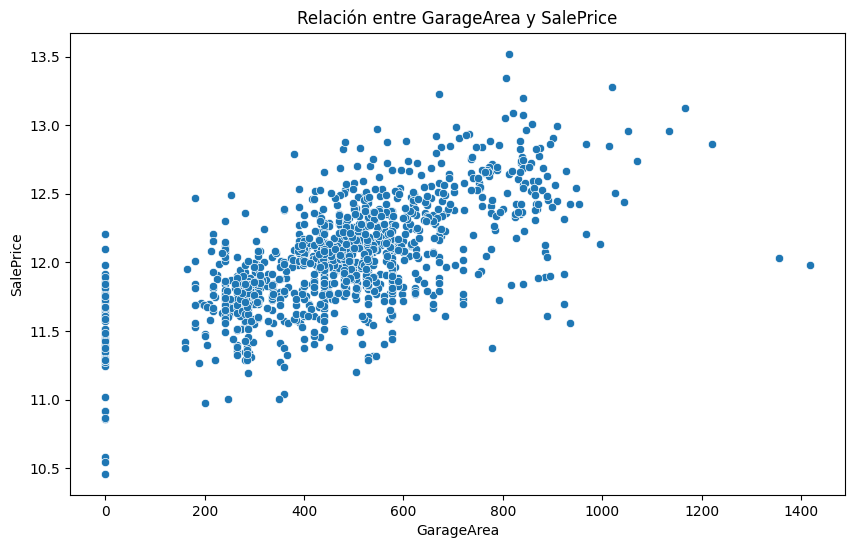

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


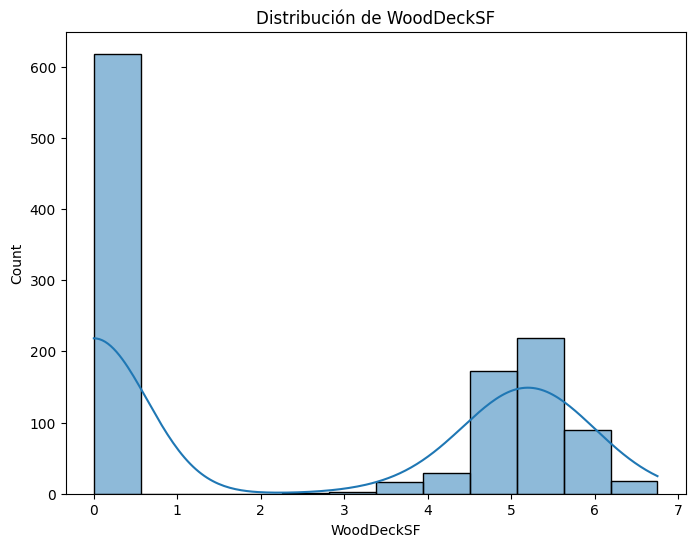

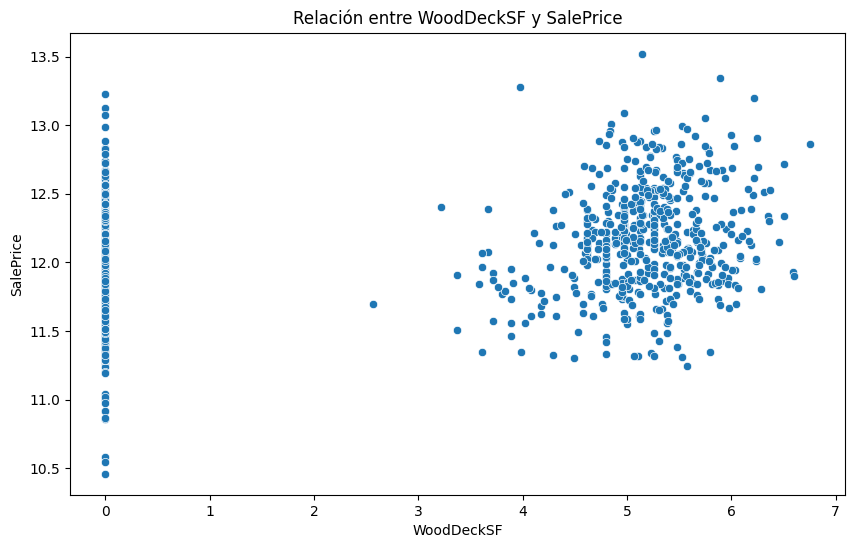

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


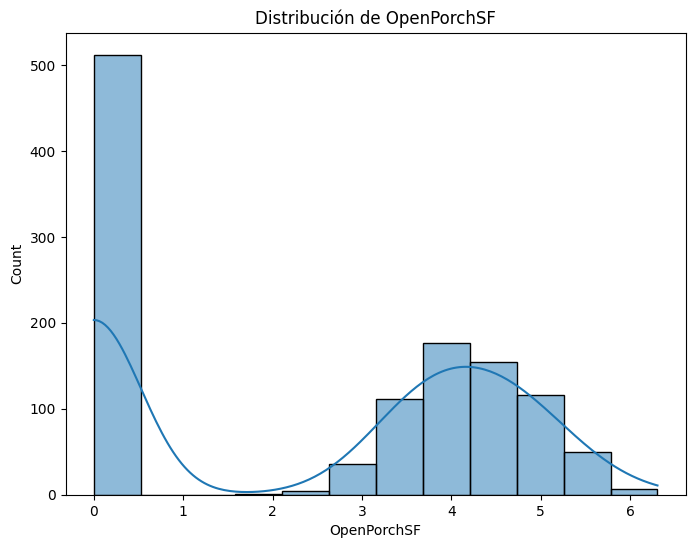

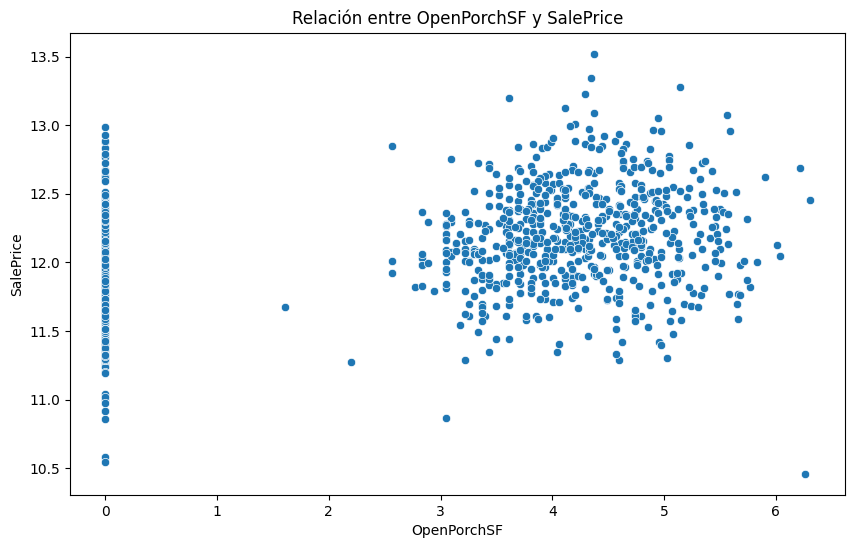

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


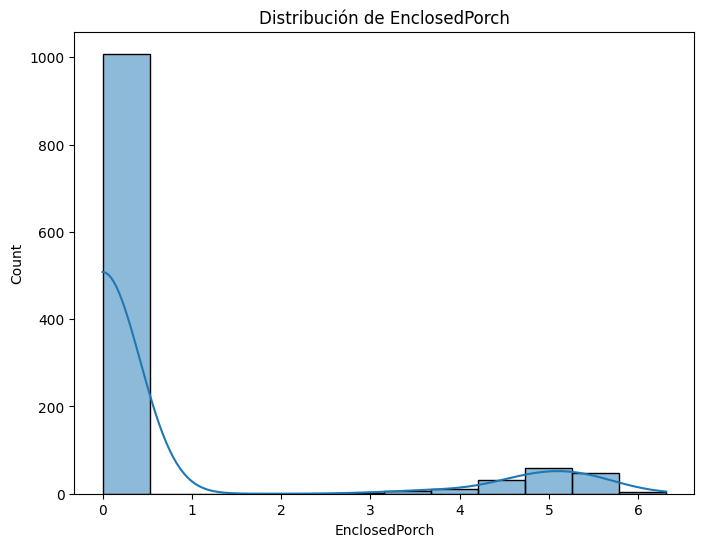

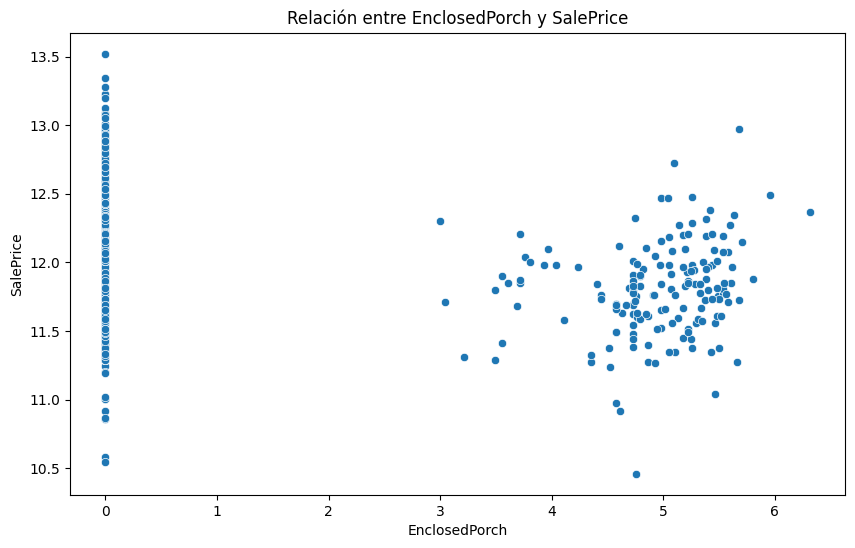

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


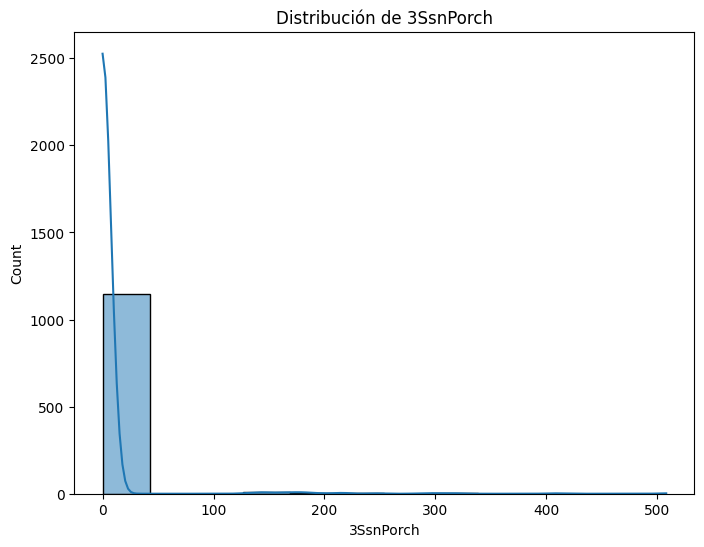

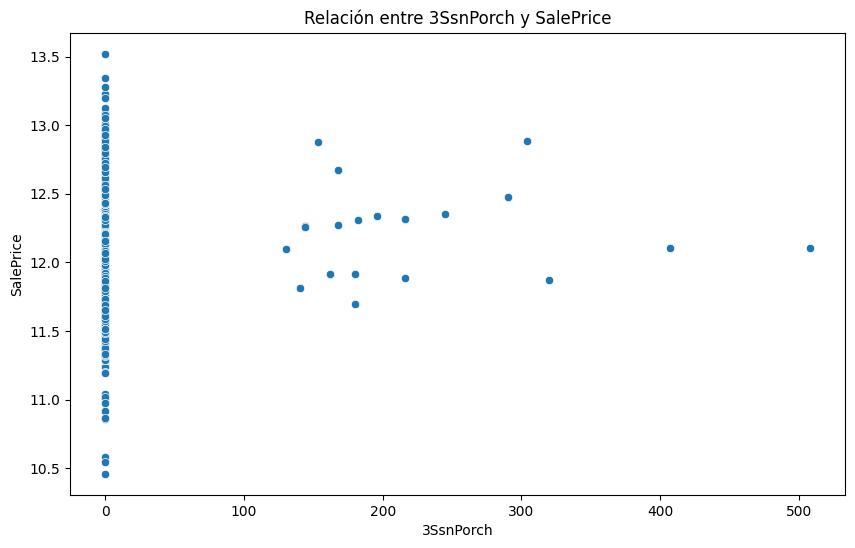

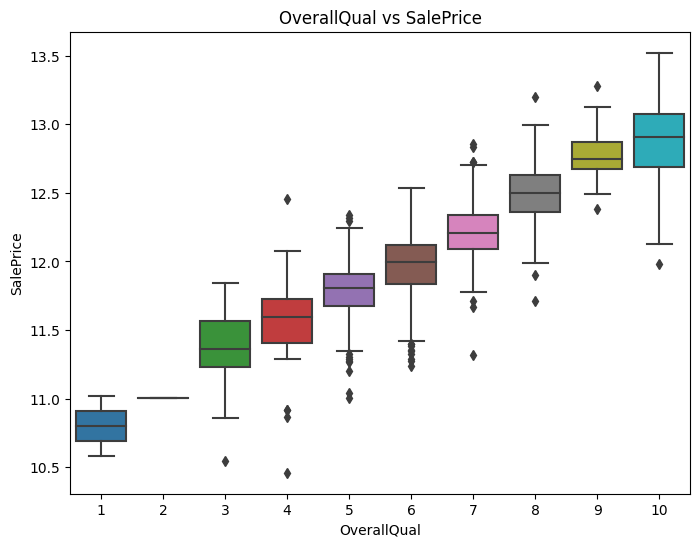

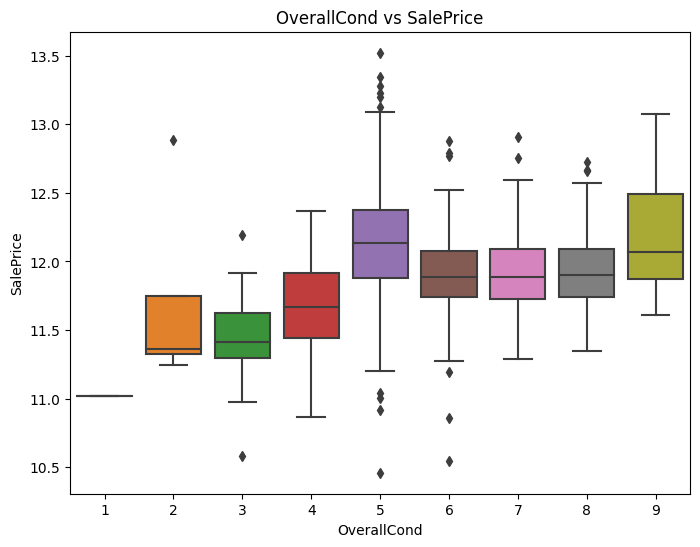

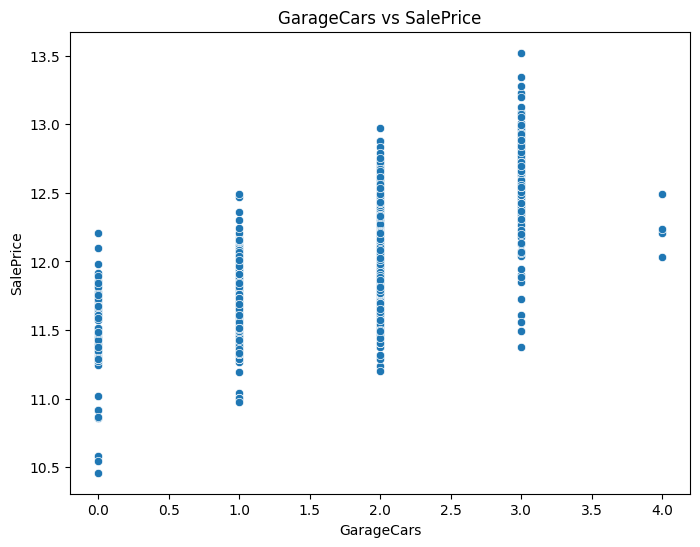

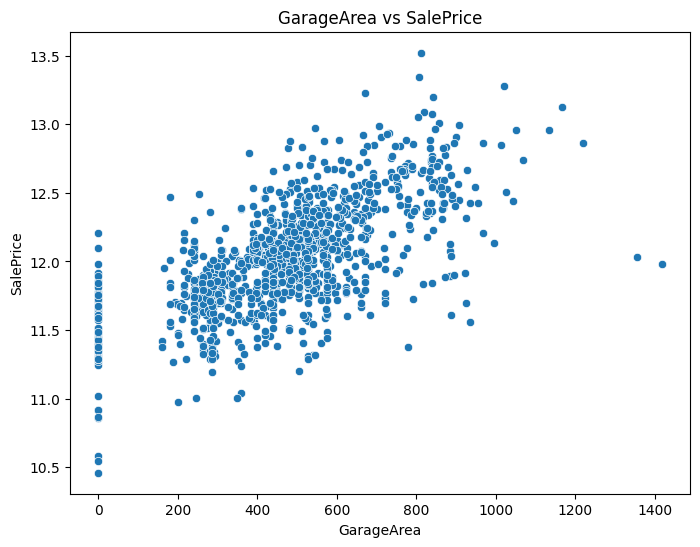

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


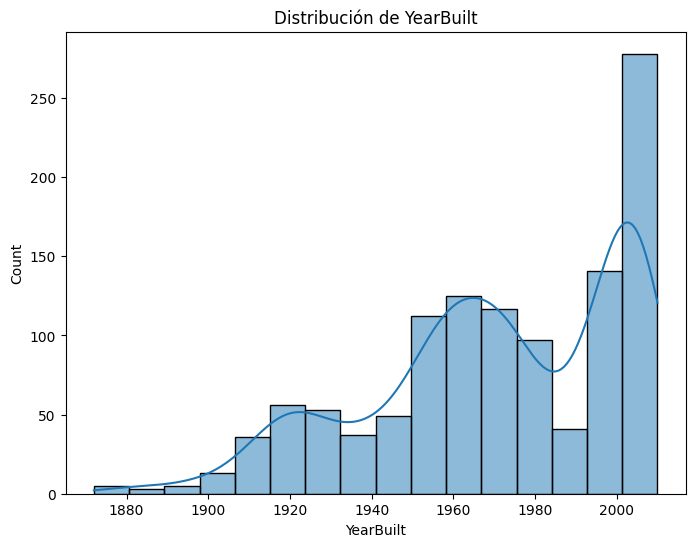

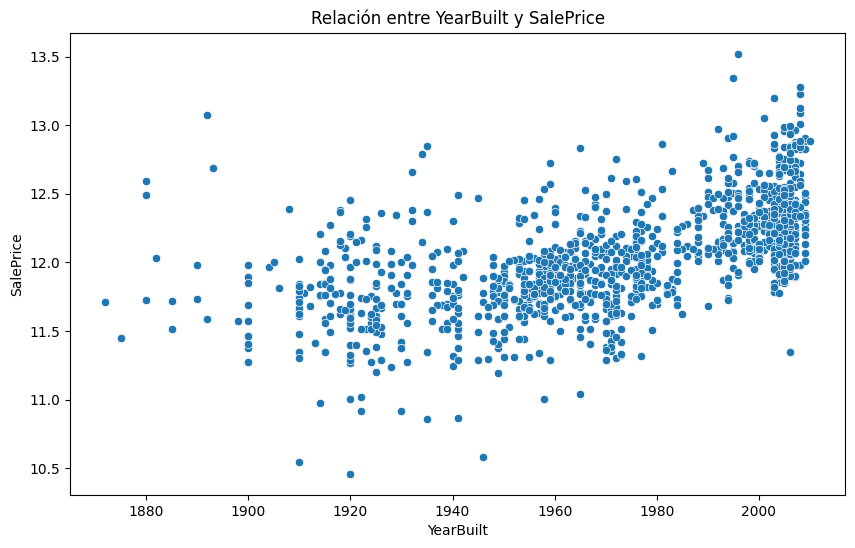

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


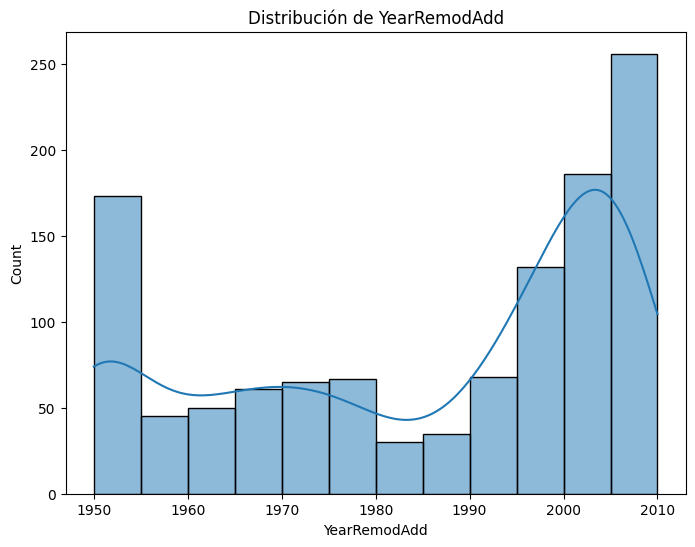

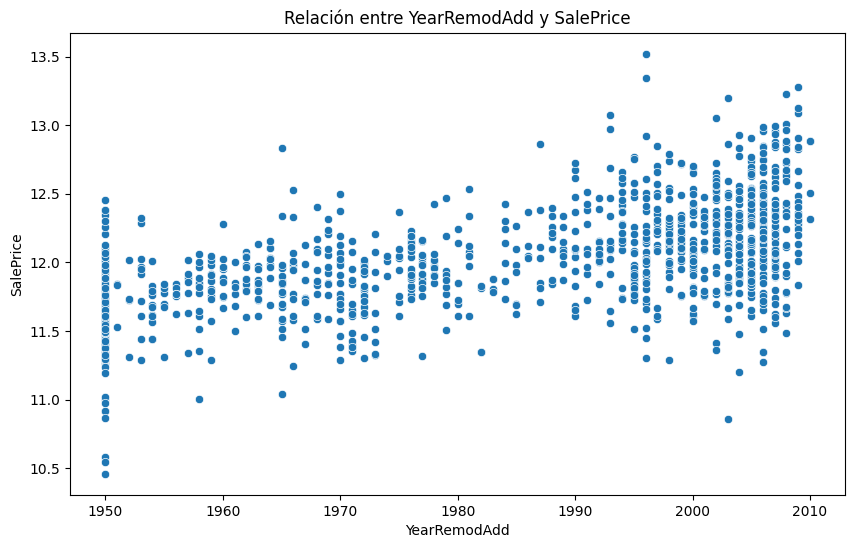

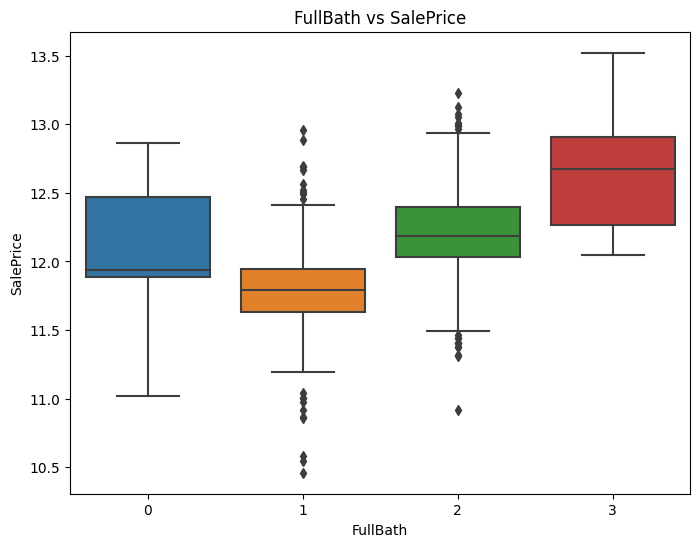

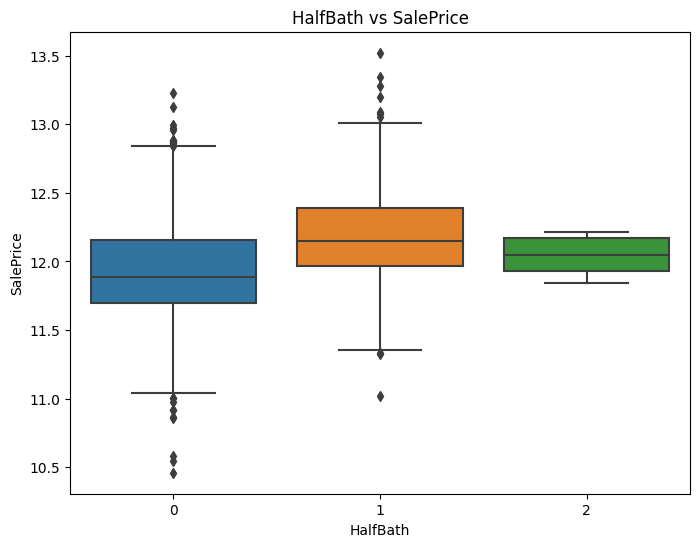

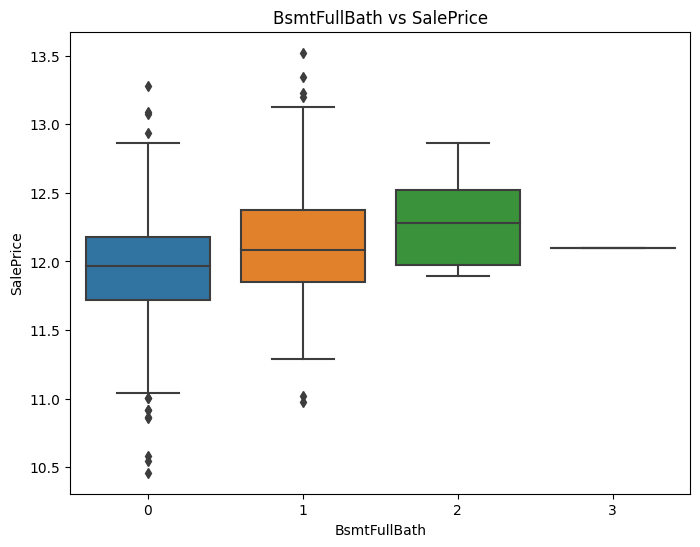

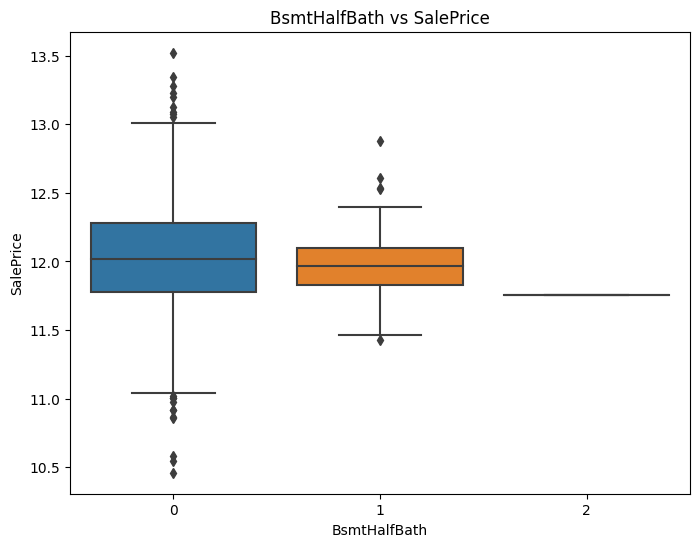

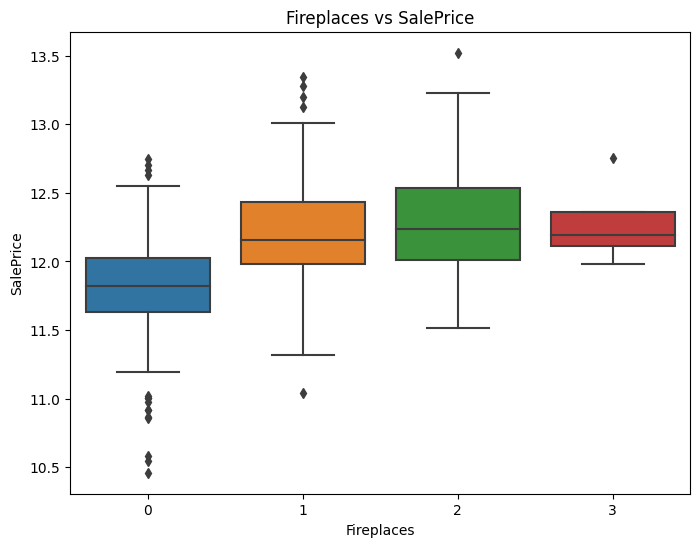

In [47]:
df_train_train['LotArea'] = np.log1p(df_train_train['LotArea'])  # Log-transformación de LotArea
df_train_train['WoodDeckSF'] = np.log1p(df_train_train['WoodDeckSF'])  # Log-transformación de WoodDeckSF
df_train_train['OpenPorchSF'] = np.log1p(df_train_train['OpenPorchSF'])  # Log-transformación de OpenPorchSF
df_train_train['EnclosedPorch'] = np.log1p(df_train_train['EnclosedPorch'])  # Log-transformación de EnclosedPorch
df_train_train['SalePrice'] = np.log1p(df_train_train['SalePrice'])  # Log-transformación de SalePrice

# Llamar a todas las funciones
analizar_espacio_vivienda(df_train_train)       # Función para analizar espacios de vivienda y área total
analizar_porches_terrazas(df_train_train)       # Función para analizar características exteriores y espacios adicionales
analizar_calificacion_condicion(df_train_train) # Función para analizar calidad y condiciones de la propiedad
analizar_garaje(df_train_train)                 # Función para analizar garage y estacionamiento
analizar_antiguedad_remodelacion(df_train_train) # Función para analizar antigüedad y remodelación
analizar_outliers_individuales(df_train_train)  # Función para analizar baños y chimeneas

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


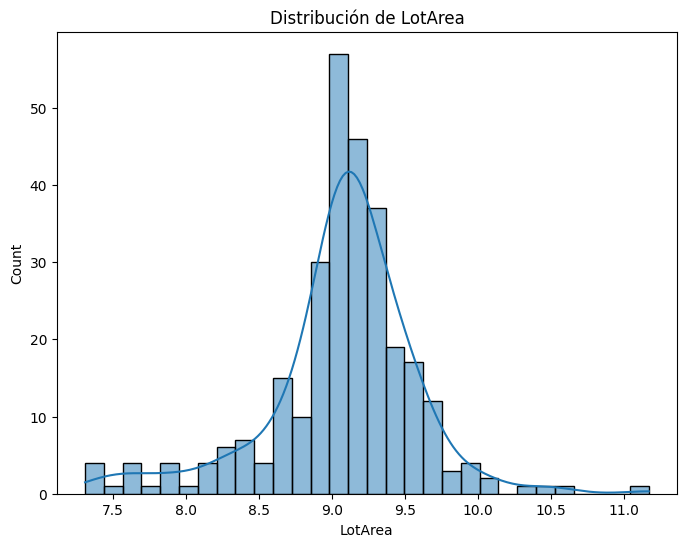

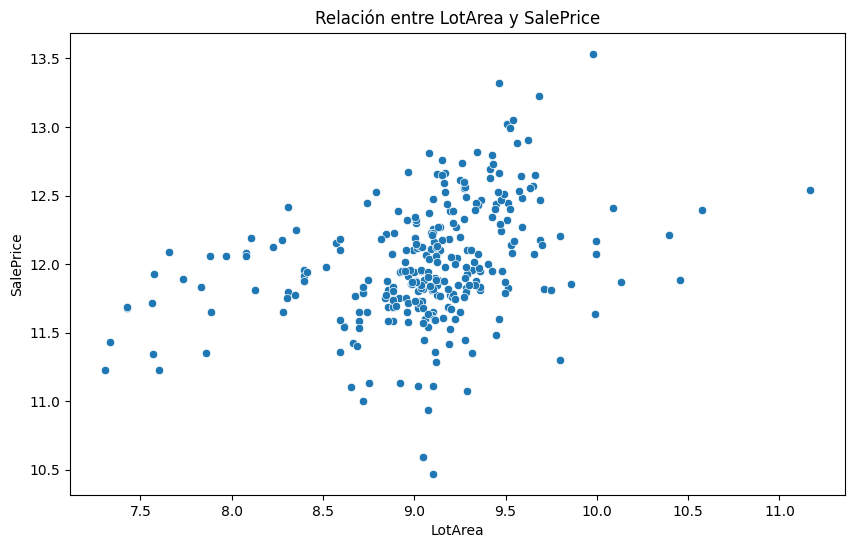

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


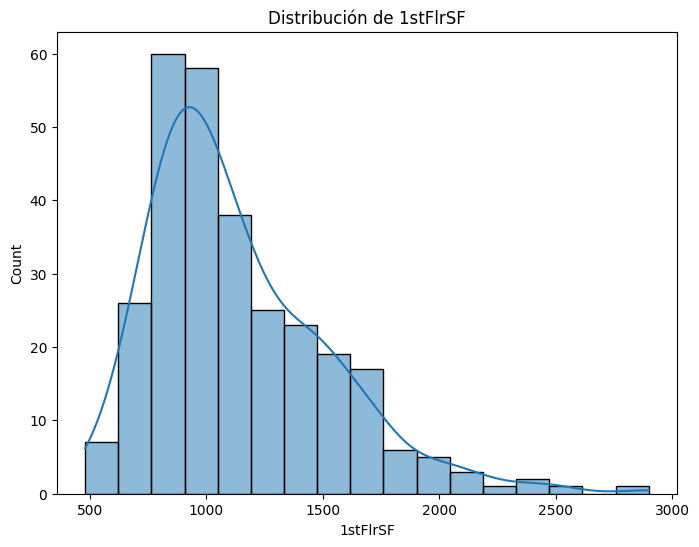

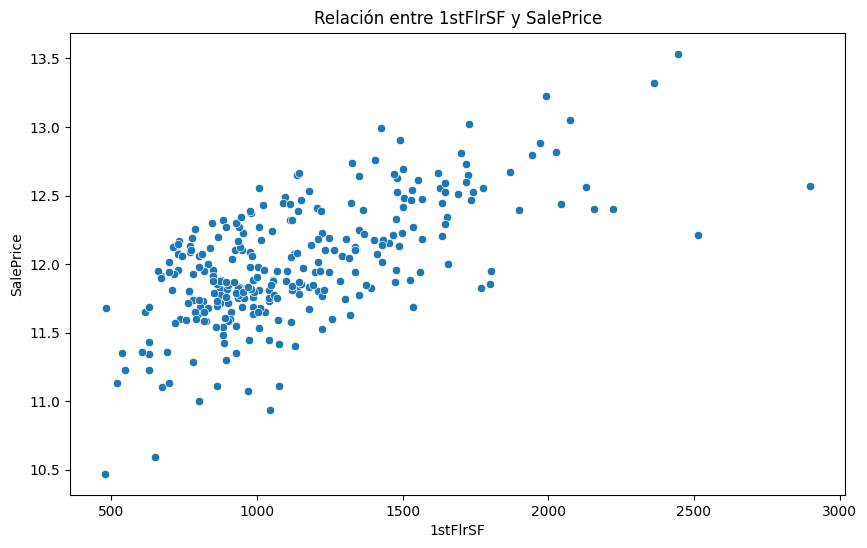

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


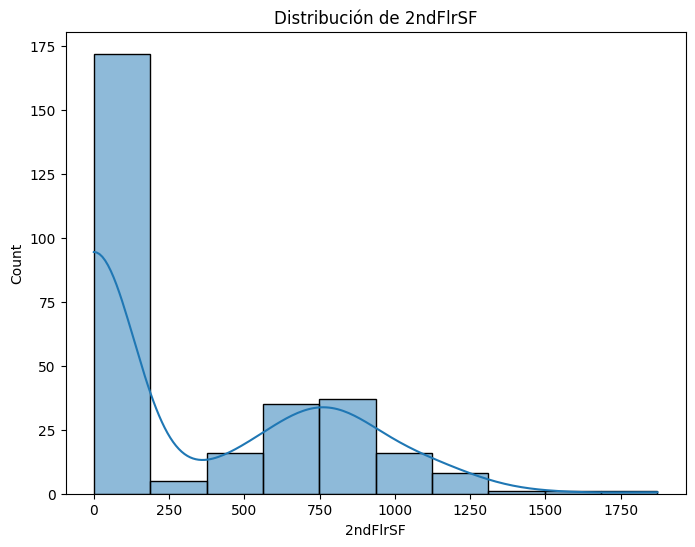

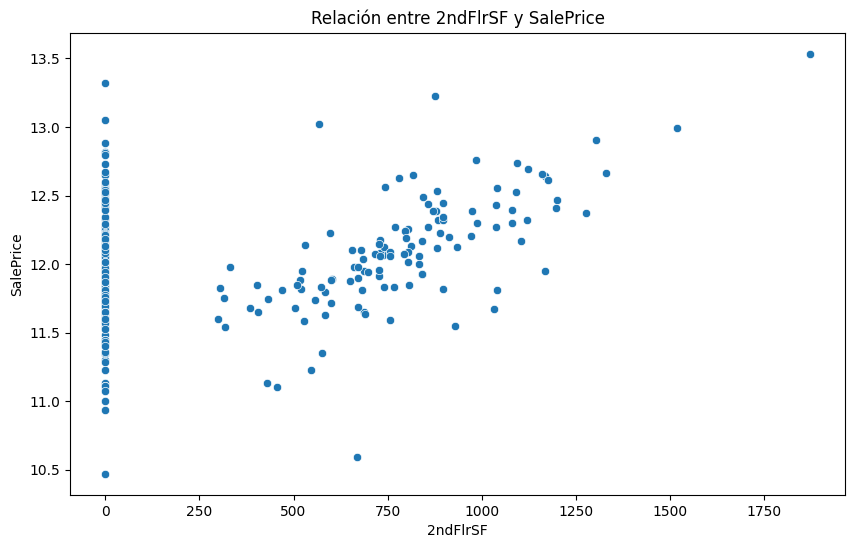

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


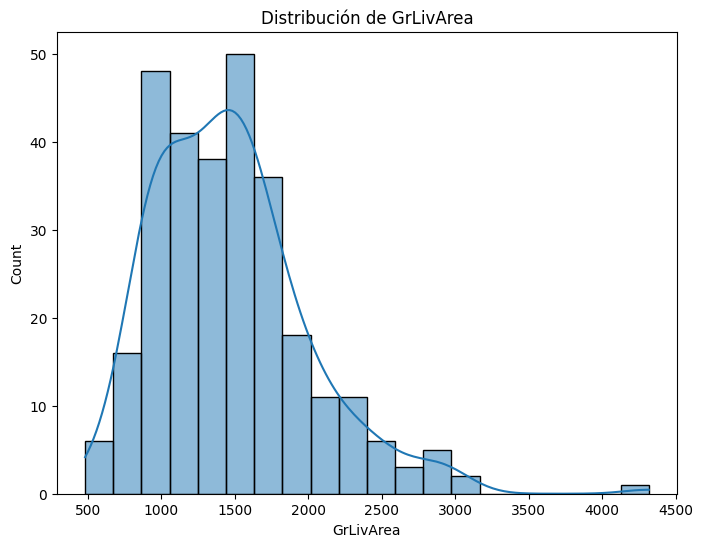

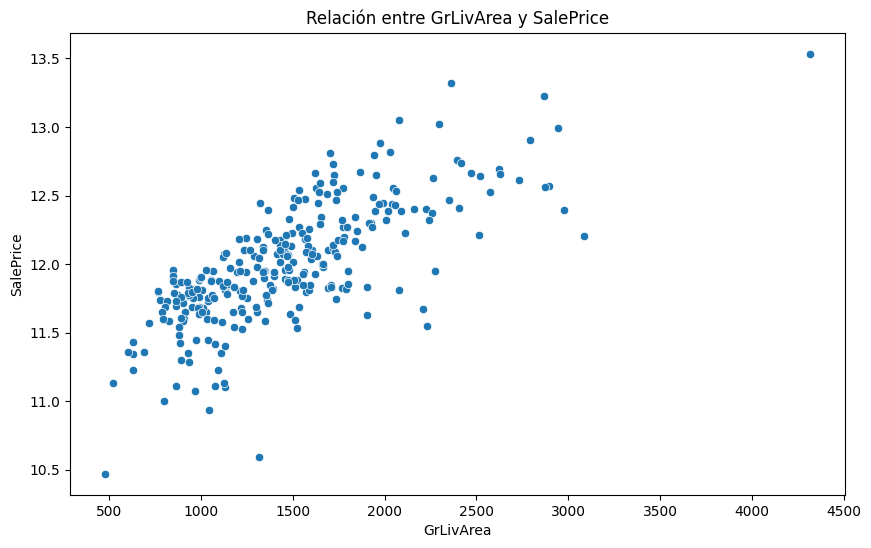

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


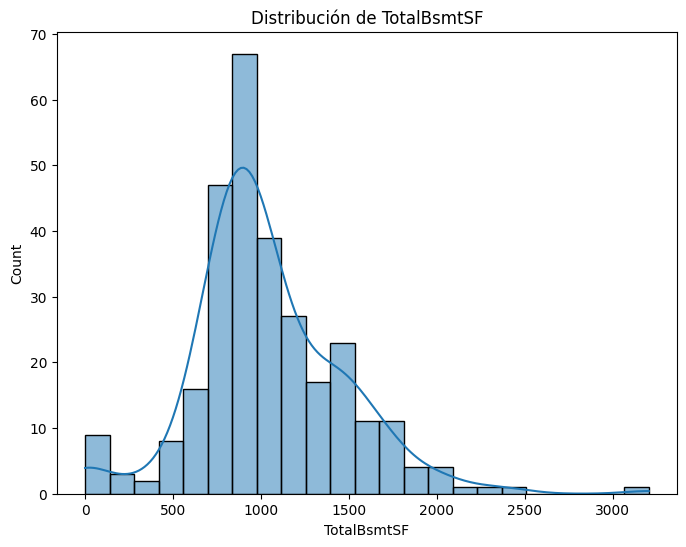

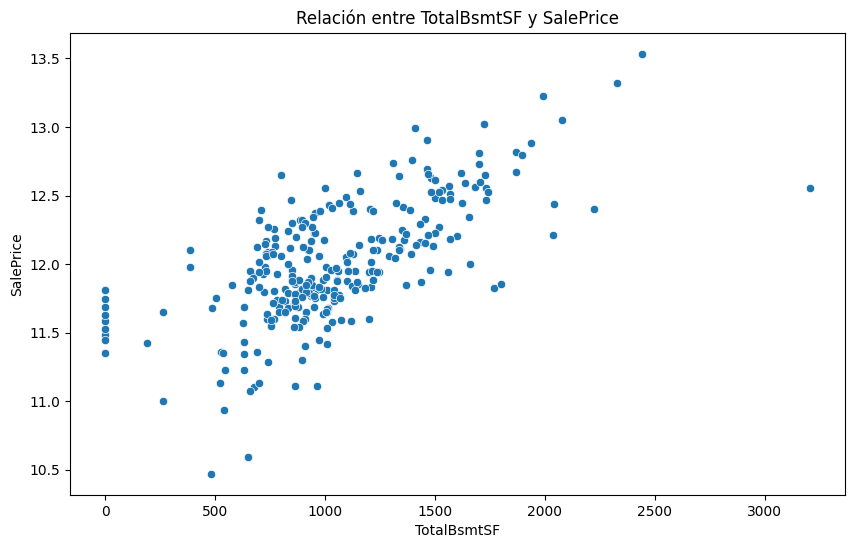

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


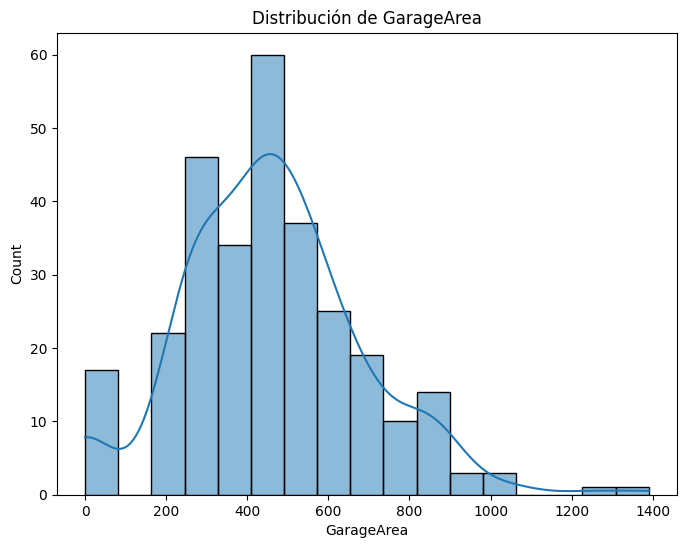

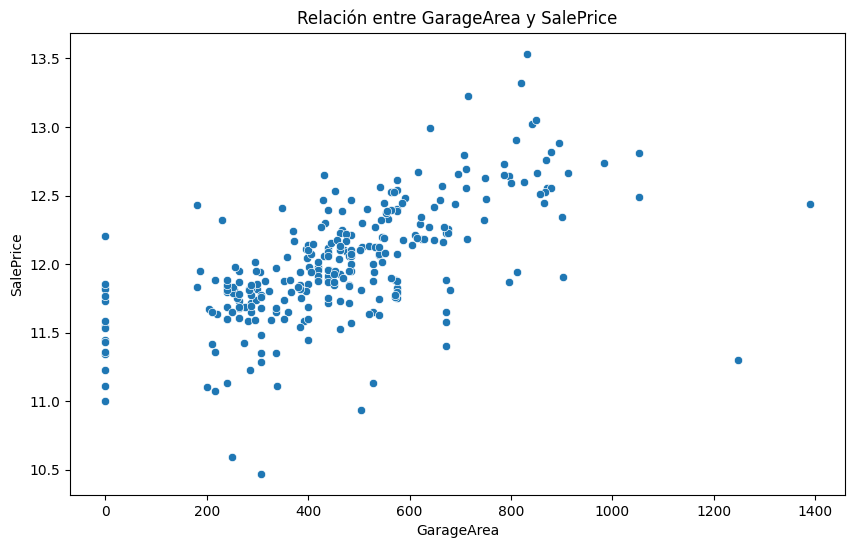

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


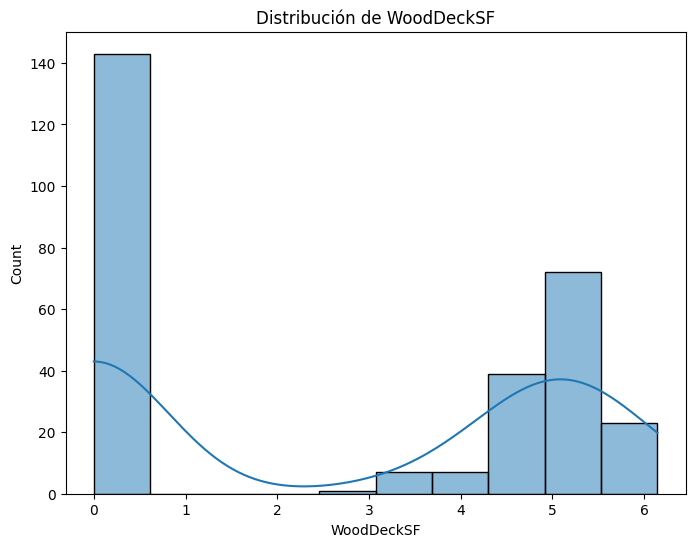

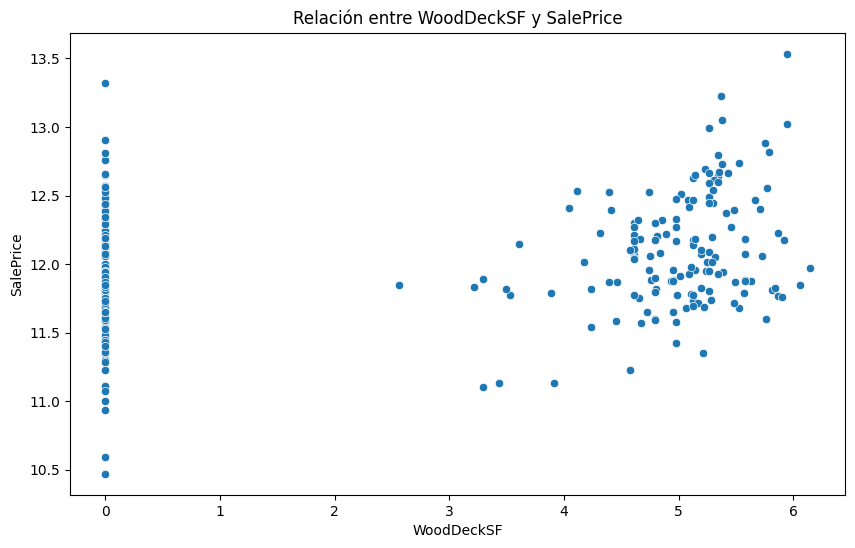

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


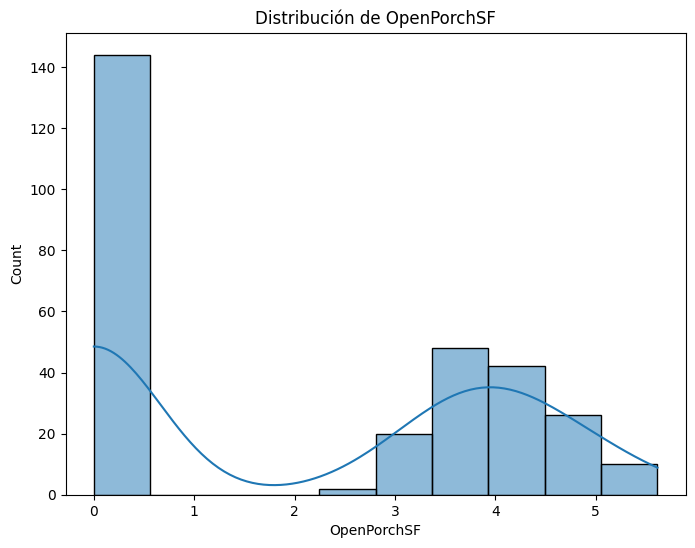

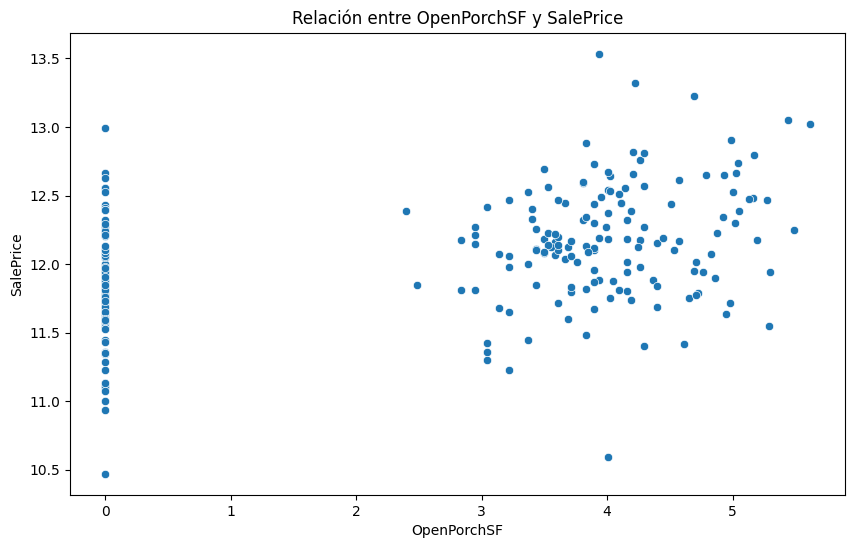

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


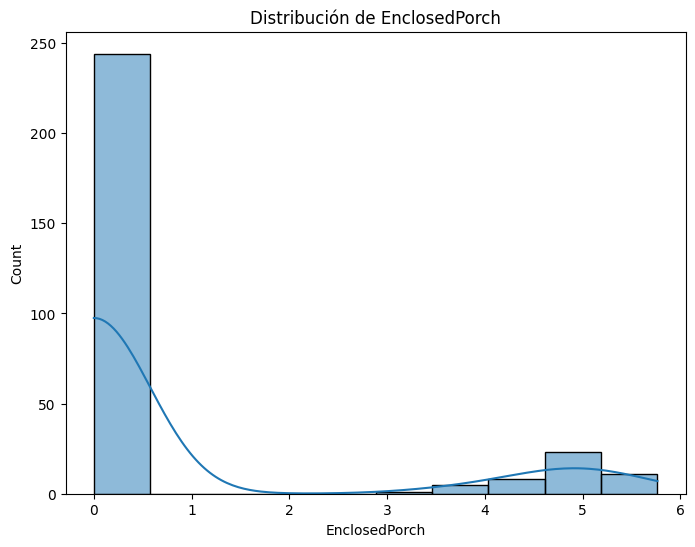

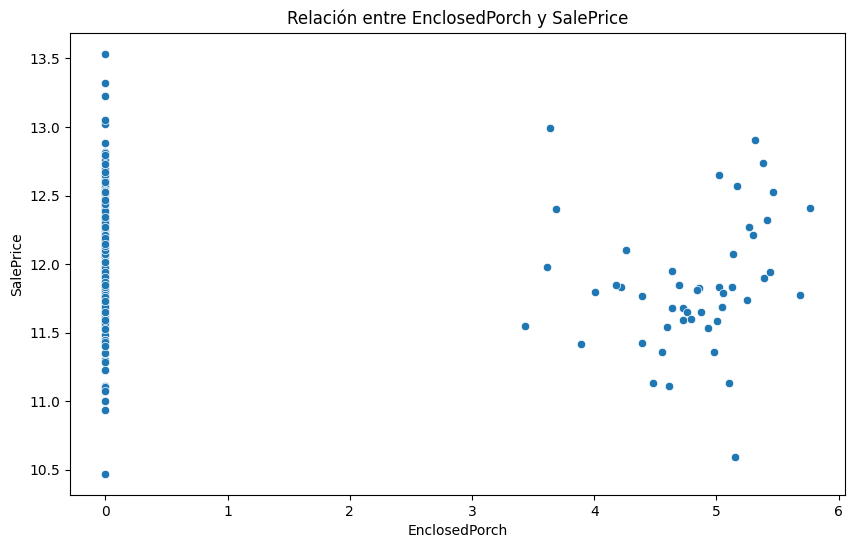

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


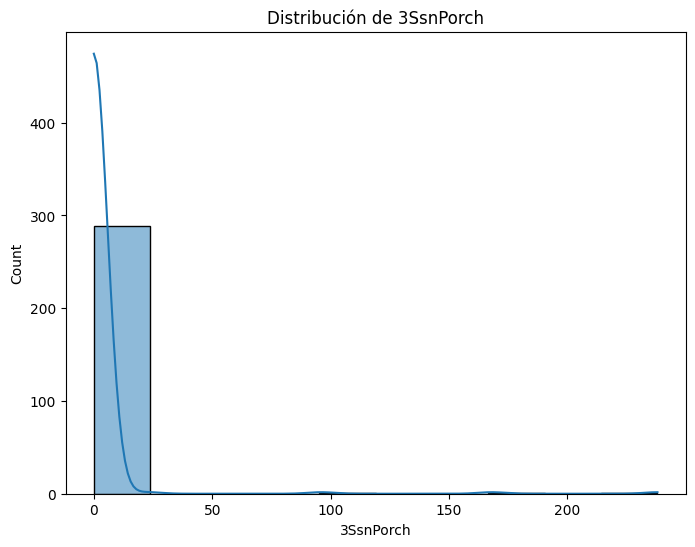

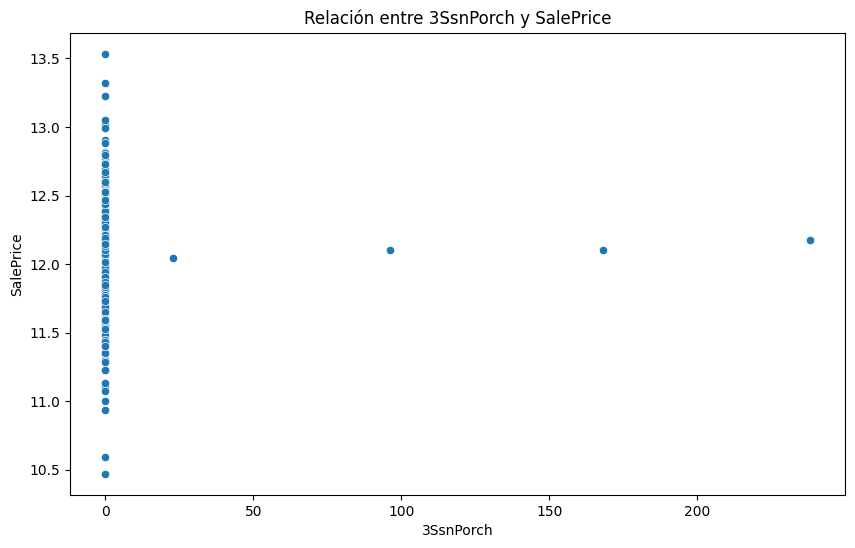

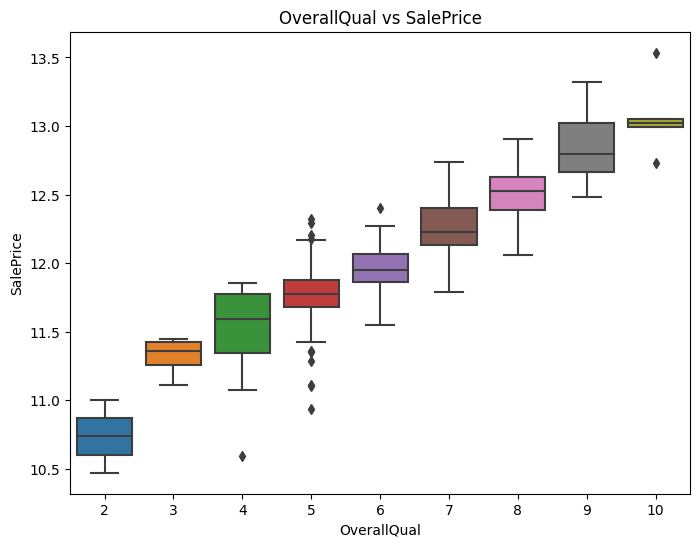

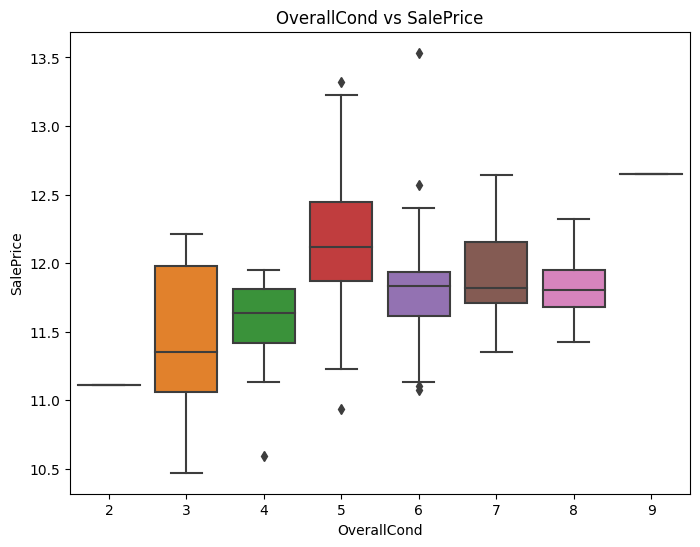

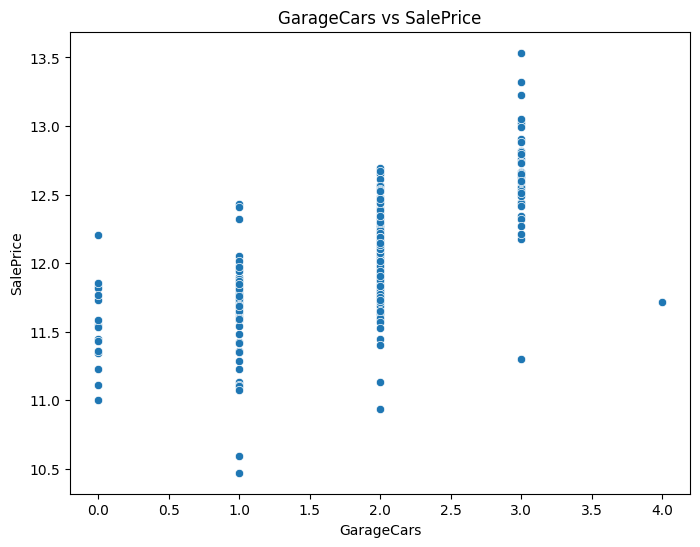

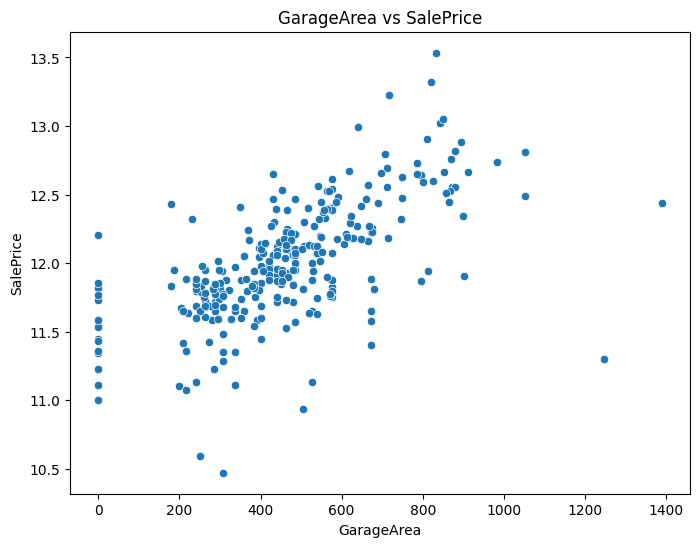

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


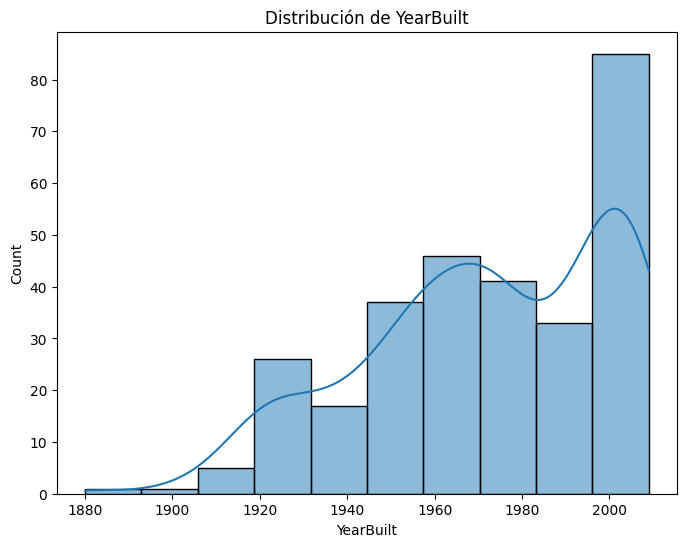

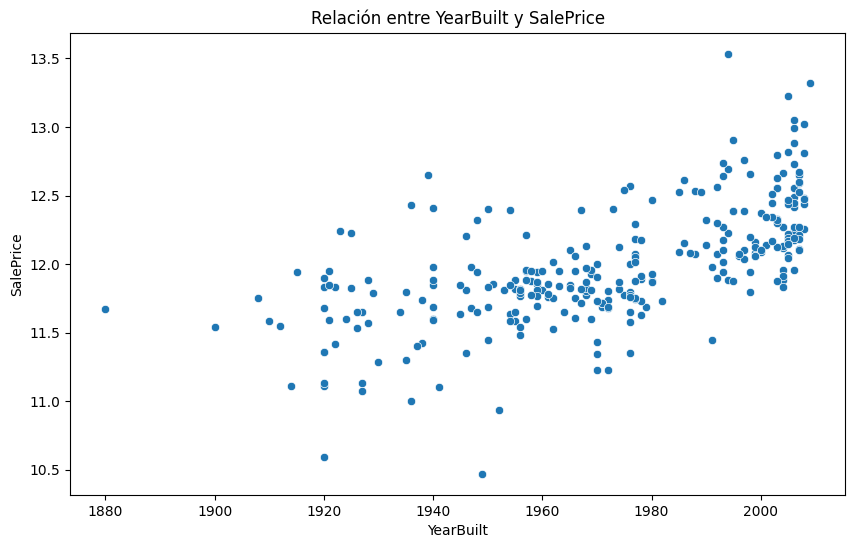

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


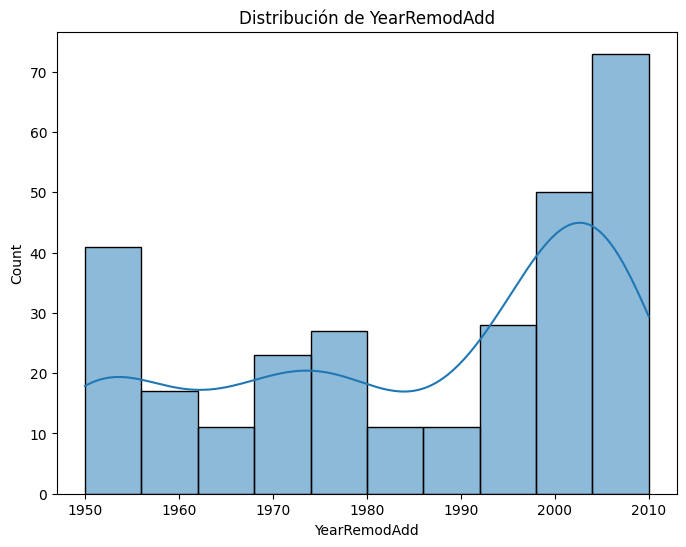

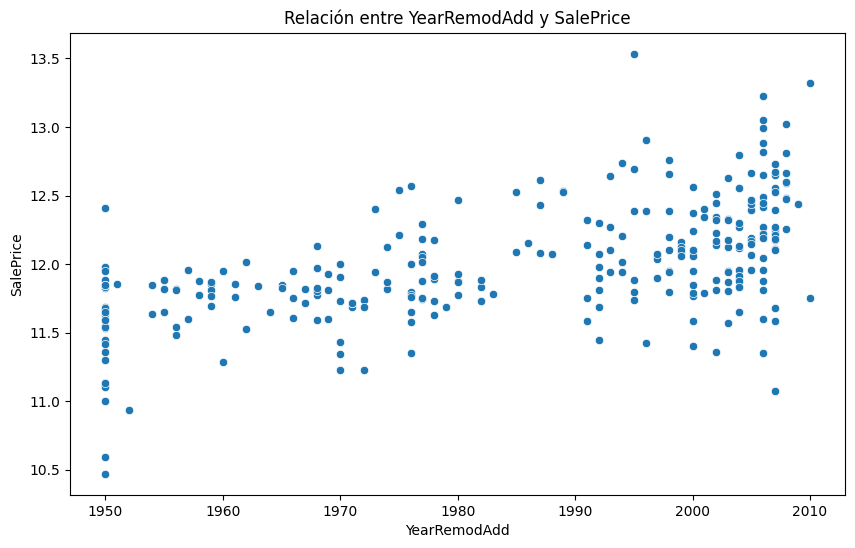

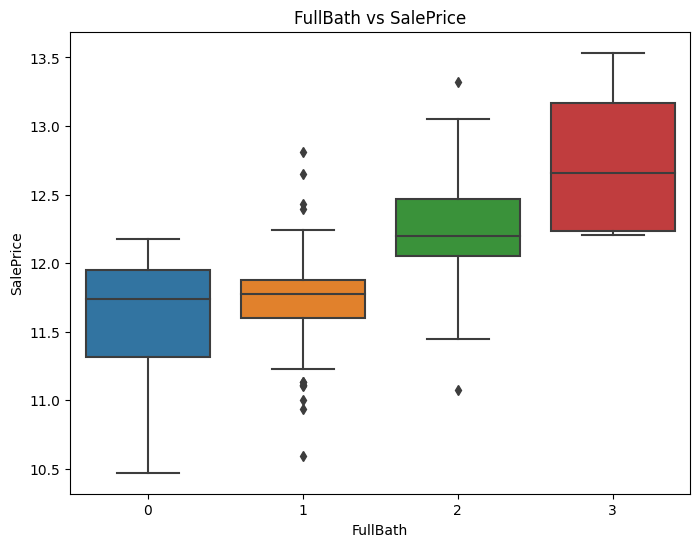

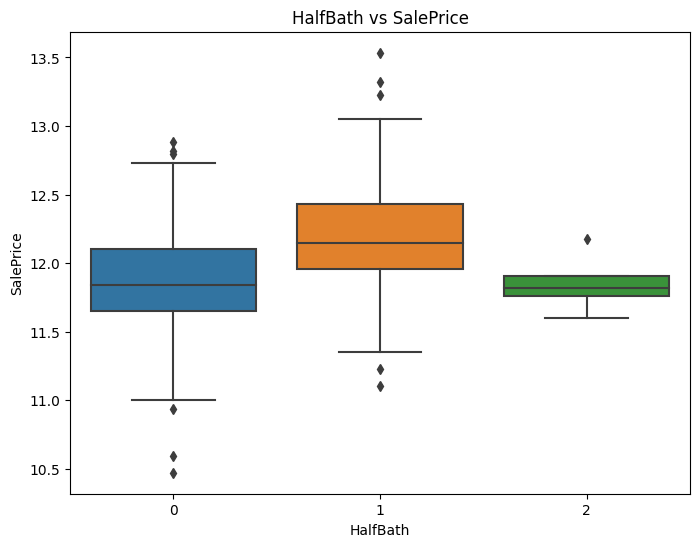

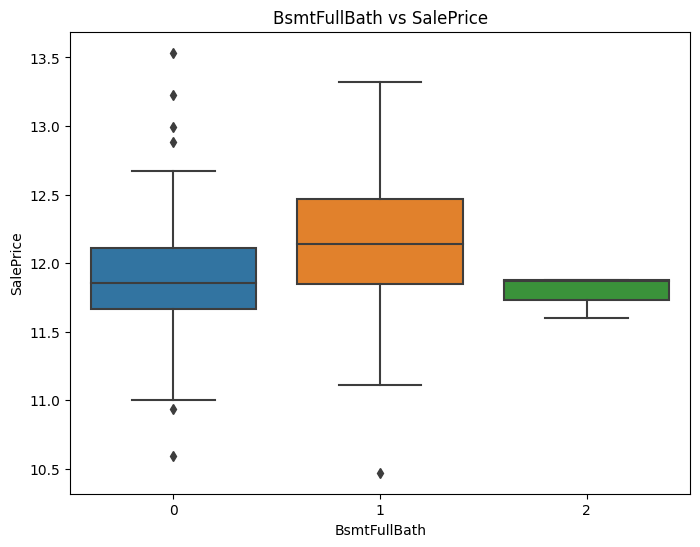

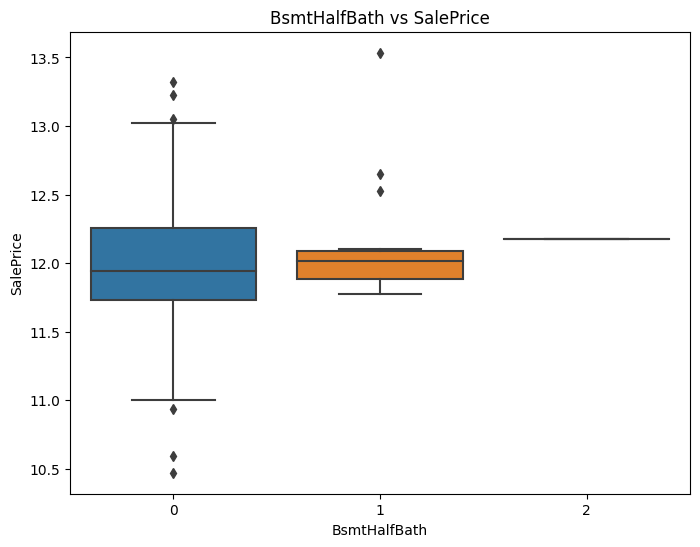

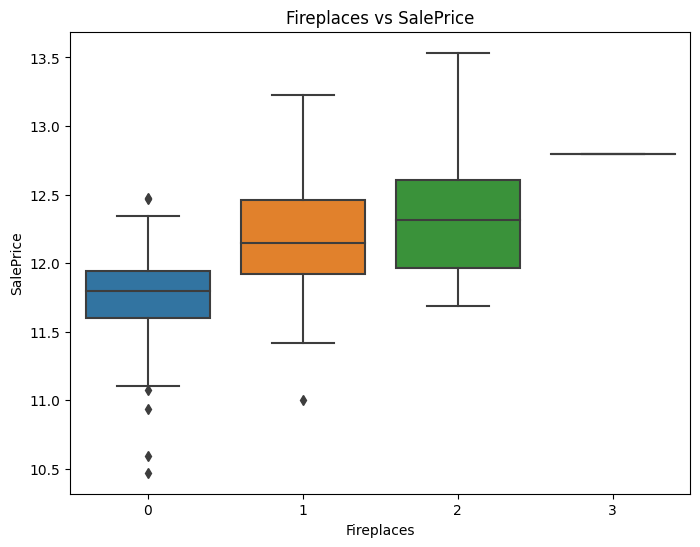

In [48]:
df_train_test['LotArea'] = np.log1p(df_train_test['LotArea'])  # Log-transformación de LotArea
df_train_test['WoodDeckSF'] = np.log1p(df_train_test['WoodDeckSF'])  # Log-transformación de WoodDeckSF
df_train_test['OpenPorchSF'] = np.log1p(df_train_test['OpenPorchSF'])  # Log-transformación de OpenPorchSF
df_train_test['EnclosedPorch'] = np.log1p(df_train_test['EnclosedPorch'])  # Log-transformación de EnclosedPorch
df_train_test['SalePrice'] = np.log1p(df_train_test['SalePrice'])  # Log-transformación de SalePrice

# Llamar a todas las funciones
analizar_espacio_vivienda(df_train_test)       # Función para analizar espacios de vivienda y área total
analizar_porches_terrazas(df_train_test)       # Función para analizar características exteriores y espacios adicionales
analizar_calificacion_condicion(df_train_test) # Función para analizar calidad y condiciones de la propiedad
analizar_garaje(df_train_test)                 # Función para analizar garage y estacionamiento
analizar_antiguedad_remodelacion(df_train_test) # Función para analizar antigüedad y remodelación
analizar_outliers_individuales(df_train_test)  # Función para analizar baños y chimeneasdf_train_test

In [49]:
df_test['LotArea'] = np.log1p(df_test['LotArea'])  # Log-transformación de LotArea
df_test['WoodDeckSF'] = np.log1p(df_test['WoodDeckSF'])  # Log-transformación de WoodDeckSF
df_test['OpenPorchSF'] = np.log1p(df_test['OpenPorchSF'])  # Log-transformación de OpenPorchSF
df_test['EnclosedPorch'] = np.log1p(df_test['EnclosedPorch'])  # Log-transformación de EnclosedPorch

df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 87 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Id                                   1459 non-null   int64         
 1   MSSubClass                           1459 non-null   int64         
 2   MSZoning                             1459 non-null   float64       
 3   LotFrontage                          1459 non-null   float64       
 4   LotArea                              1459 non-null   float64       
 5   Street                               1459 non-null   object        
 6   LotShape                             1459 non-null   int64         
 7   LandContour                          1459 non-null   int64         
 8   Utilities                            1459 non-null   object        
 9   LotConfig                            1459 non-null   int64         
 10  LandSlope   

En el conjunto de test, si se encuentran valores atípicos que no estaban en el conjunto de entrenamiento, podría afectar la precisión del modelo, ya que el modelo puede no haber aprendido a manejar estos casos extremos. Formas de abordar esto para que el modelo pueda lidiar con valores atípicos en el test sin problemas:

- **Establecer Límite de Outliers**: Usa los límites superiores e inferiores (por ejemplo, basados en el rango intercuartil o en el percentil 99) que ya definiste para el conjunto de entrenamiento y aplícalos en el conjunto de test. Los valores que excedan estos límites pueden ser:
    - Reemplazados por el límite superior o inferior, de forma que el modelo vea valores que estén dentro del rango de entrenamiento.
    - Eliminados si son muy extremos y no se espera que el modelo haga predicciones confiables para estos casos.
  
- **Aplicar las Transformaciones del Entrenamiento**: Si aplicas transformaciones como el logaritmo para reducir la dispersión en las variables, asegúrate de hacer lo mismo en el conjunto de test. Esto ayuda a mantener la coherencia en la escala de los valores, incluidos los atípicos.

- **Establecer una Estrategia para Valores Nuevos en Variables Categoricas**: Si algunas variables son categóricas, puede ser útil añadir un "grupo desconocido" para valores que no estaban en el conjunto de entrenamiento. Esto asegura que el modelo no falle al encontrar nuevas categorías inesperadas.

- **Estándares y Normalización Consistentes**: Si aplicas algún tipo de estandarización o normalización en el conjunto de entrenamiento, los mismos parámetros (media, desviación, etc.) deben usarse en el conjunto de test para mantener la coherencia en la escala.

- **Usar un Modelo Robusto a Outliers**: Si el modelo es muy sensible a los outliers (como regresiones lineales), podría considerar un modelo más robusto, como el de árboles de decisión o métodos que no se vean tan afectados por valores extremos.

## Organización

In [50]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

# Reorganizar el DataFrame con las columnas ordenadas
df_train_train = df_train_train[sorted_columns]

print(df_train_train.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtQual', 'BsmtUnfSF',
       'CalidadCondiciónCompuesta', 'CentralAir', 'Condition1', 'Condition2',
       'DensidadHabitaciones', 'Electrical', 'EnclosedPorch', 'ExterCond',
       'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu',
       'Fireplaces', 'Foundation', 'FullBath', 'Functional', 'GarageArea',
       'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType',
       'GarageYrBlt', 'GrLivArea', 'HalfBath', 'Heating', 'HeatingQC',
       'HouseStyle', 'Id', 'KitchenAbvGr', 'KitchenQual', 'LandContour',
       'LandSlope', 'LotArea', 'LotConfig', 'LotFrontage', 'LotShape',
       'LowQualFinSF', 'MSSubClass', 'MSZoning', 'MasVnrArea', 'MasVnrType',
       'MiscVal', 'MoSold', 'Neighborhood'

In [51]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

# Reorganizar el DataFrame con las columnas ordenadas
df_train_test = df_train_test[sorted_columns]

print(df_train_test.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtQual', 'BsmtUnfSF',
       'CalidadCondiciónCompuesta', 'CentralAir', 'Condition1', 'Condition2',
       'DensidadHabitaciones', 'Electrical', 'EnclosedPorch', 'ExterCond',
       'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu',
       'Fireplaces', 'Foundation', 'FullBath', 'Functional', 'GarageArea',
       'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType',
       'GarageYrBlt', 'GrLivArea', 'HalfBath', 'Heating', 'HeatingQC',
       'HouseStyle', 'Id', 'KitchenAbvGr', 'KitchenQual', 'LandContour',
       'LandSlope', 'LotArea', 'LotConfig', 'LotFrontage', 'LotShape',
       'LowQualFinSF', 'MSSubClass', 'MSZoning', 'MasVnrArea', 'MasVnrType',
       'MiscVal', 'MoSold', 'Neighborhood'

In [52]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

# Reorganizar el DataFrame con las columnas ordenadas
df_test = df_test[sorted_columns]

print(df_test.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtQual', 'BsmtUnfSF',
       'CalidadCondiciónCompuesta', 'CentralAir', 'Condition1', 'Condition2',
       'DensidadHabitaciones', 'Electrical', 'EnclosedPorch', 'ExterCond',
       'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu',
       'Fireplaces', 'Foundation', 'FullBath', 'Functional', 'GarageArea',
       'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType',
       'GarageYrBlt', 'GrLivArea', 'HalfBath', 'Heating', 'HeatingQC',
       'HouseStyle', 'Id', 'KitchenAbvGr', 'KitchenQual', 'LandContour',
       'LandSlope', 'LotArea', 'LotConfig', 'LotFrontage', 'LotShape',
       'LowQualFinSF', 'MSSubClass', 'MSZoning', 'MasVnrArea', 'MasVnrType',
       'MiscVal', 'MoSold', 'Neighborhood'

## Codificación

La codificación es un paso importante antes de crear la matriz de correlación, especialmente cuando trabajas con datos categóricos.

¡Al aplicar la codificación en el conjunto de test, TENER EN CUENTA LO SIGUIENTE!:

- **Consistencia en la Codificación**: Asegurarse de que la codificación aplicada al conjunto de test sea la misma que la aplicada al conjunto de entrenamiento. Esto significa que si alguna categoría está presente en el conjunto de test y no en el conjunto de entrenamiento (o viceversa), hay que manejar eso adecuadamente.

- **Reutilización de Encoder**: Se puede reutilizar el LabelEncoder que se usó para el conjunto de entrenamiento para codificar el conjunto de test. Sin embargo, para One-Hot Encoding, habrá que asegurarse de que todas las columnas que existieron en el conjunto de entrenamiento también estén presentes en el conjunto de test. Esto se puede hacer utilizando pd.get_dummies() con columns especificados o utilizando join para asegurar que los nombres de columnas coincidan.

La reutilización de los codificadores y asegurarte de que las columnas coincidan es fundamental para el modelado.

### Conveniencia de la Reutilización de Encoders

- **Consistencia en los Datos**: Es crucial que el conjunto de entrenamiento y el conjunto de prueba sean procesados de la misma manera. Si codificas las variables de manera diferente entre los dos conjuntos, puedes introducir sesgos o incoherencias que afectarán negativamente el rendimiento del modelo.

- **Manejo de Nuevas Categorías**:

    - **Label Encoding**: Al usar LabelEncoder, si encuentras una categoría en el conjunto de prueba que no estaba en el conjunto de entrenamiento, necesitaré manejarla. Generalmente, se puede asignar un valor especial (como -1) para las categorías desconocidas o simplemente ignorarlas, pero es importante ser consistente.

    - **One-Hot Encoding**: Al aplicar One-Hot Encoding, el problema principal es que si hay categorías en el conjunto de prueba que no estaban en el conjunto de entrenamiento, crearé columnas que no están en el conjunto de entrenamiento. Por lo tanto, hay que asegurarse de que el conjunto de prueba tenga las mismas columnas que el conjunto de entrenamiento, usando reindex.

In [53]:
# Seleccionar columnas tipo object
columnas_category = df_train_train.select_dtypes(include=['object']).columns
print("columnas_category:", columnas_category.tolist())


columnas_category: ['BsmtQual', 'ExterQual', 'GarageType', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']


In [54]:
# Seleccionar columnas tipo object
columnas_category = df_train_test.select_dtypes(include=['object']).columns
print("columnas_category:", columnas_category.tolist())


columnas_category: ['BsmtQual', 'ExterQual', 'GarageType', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']


In [55]:
# Seleccionar columnas tipo object
columnas_category = df_test.select_dtypes(include=['object']).columns
print("columnas_category:", columnas_category.tolist())


columnas_category: ['BsmtQual', 'ExterQual', 'GarageType', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']


### Label Encoder

**Variables Ordinales (con un orden inherente)**
Estas variables tienen un orden natural, por lo que la mejor opción es usar **Label Encoding** o, si es necesario, Ordinal Encoding.

In [56]:
le_ExterQual = LabelEncoder()
le_BsmtQual = LabelEncoder()
le_GarageType = LabelEncoder()

In [57]:
df_train_train['ExterQual'] = le_ExterQual.fit_transform(df_train_train['ExterQual'])
df_train_train['BsmtQual'] = le_BsmtQual.fit_transform(df_train_train['BsmtQual'])
df_train_train['GarageType'] = le_GarageType.fit_transform(df_train_train['GarageType'])

print(df_train_train[['ExterQual', 'BsmtQual', 'GarageType']].dtypes)

ExterQual     int64
BsmtQual      int64
GarageType    int64
dtype: object


In [58]:
df_train_test['ExterQual'] = le_ExterQual.transform(df_train_test['ExterQual'])
df_train_test['BsmtQual'] = le_BsmtQual.transform(df_train_test['BsmtQual'])
df_train_test['GarageType'] = le_GarageType.transform(df_train_test['GarageType'])

print(df_train_test[['ExterQual', 'BsmtQual', 'GarageType']].dtypes)

ExterQual     int64
BsmtQual      int64
GarageType    int64
dtype: object


In [59]:
df_test['ExterQual'] = le_ExterQual.transform(df_test['ExterQual'])
df_test['BsmtQual'] = le_BsmtQual.transform(df_test['BsmtQual'])
df_test['GarageType'] = le_GarageType.transform(df_test['GarageType'])

print(df_test[['ExterQual', 'BsmtQual', 'GarageType']].dtypes)

ExterQual     int64
BsmtQual      int64
GarageType    int64
dtype: object


### One Hot Encoding
**Variables Categóricas Nominales (sin un orden natural)**
Estas variables no tienen un orden específico, por lo que la técnica adecuada es el **One-Hot Encoding**. Esto creará una columna binaria para cada categoría posible en esas variables.

In [60]:
# Seleccionar columnas tipo object
columnas_category = df_train_train.select_dtypes(include=['object']).columns
print("columnas_category:", columnas_category.tolist())

columnas_category: ['MasVnrType', 'Neighborhood', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']


In [61]:
# Aplicamos One-Hot Encoding a todas las variables nominales
df_train_train = pd.get_dummies(df_train_train, 
                                columns=columnas_category,
                                drop_first=True)  # Elimino la primera columna para evitar multicolinealidad
columnas_dummies_train = df_train_train.columns
print(columnas_dummies_train)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'SaleType_CWD', 'SaleType_Con', 'SaleType_ConLD', 'SaleType_ConLI',
       'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth', 'SaleType_WD',
       'Street_Pave', 'Utilities_NoSeWa'],
      dtype='object', length=135)


In [62]:
# Aplicamos One-Hot Encoding a todas las variables nominales
df_train_test = pd.get_dummies(df_train_test, 
                                columns=columnas_category,
                                drop_first=True)  # Elimino la primera columna para evitar multicolinealidad
columnas_dummies_train_test = df_train_test.columns
print(columnas_dummies_train_test)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'SaleCondition_Family', 'SaleCondition_Normal', 'SaleCondition_Partial',
       'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New',
       'SaleType_Oth', 'SaleType_WD', 'Street_Pave'],
      dtype='object', length=126)


In [63]:
# Aplicamos One-Hot Encoding a todas las variables nominales
df_test = pd.get_dummies(df_test, 
                                columns=columnas_category,
                                drop_first=True)  # Elimino la primera columna para evitar multicolinealidad
columnas_dummies_test = df_test.columns
print(columnas_dummies_test)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'SaleType_Con', 'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_ConLw',
       'SaleType_New', 'SaleType_No SaleType', 'SaleType_Oth', 'SaleType_WD',
       'Street_Pave', 'Utilities_No Utilities'],
      dtype='object', length=131)


## Organización

In [64]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

# Reorganizar el DataFrame con las columnas ordenadas
df_train_train = df_train_train[sorted_columns]

print(df_train_train.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'TiempoUltimaRemodelación', 'TotRmsAbvGrd', 'TotalBaños', 'TotalBsmtSF',
       'Utilities_NoSeWa', 'WoodDeckSF', 'YearBuilt', 'YearRemodAdd', 'YrSold',
       'SalePrice'],
      dtype='object', length=135)


In [65]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

df_train_test = df_train_test.reindex(columns=sorted_columns, fill_value=0)
# Reorganizar el DataFrame con las columnas ordenadas
df_train_test = df_train_test[sorted_columns]


print(df_train_test.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'TiempoUltimaRemodelación', 'TotRmsAbvGrd', 'TotalBaños', 'TotalBsmtSF',
       'Utilities_NoSeWa', 'WoodDeckSF', 'YearBuilt', 'YearRemodAdd', 'YrSold',
       'SalePrice'],
      dtype='object', length=135)


In [66]:
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train.columns if col != "SalePrice"])

df_test = df_test.reindex(columns=sorted_columns, fill_value=0)
# Reorganizar el DataFrame con las columnas ordenadas
df_test = df_test[sorted_columns]

print(df_train_train.columns)

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'AntigüedadConstrucción',
       'AreaExteriorTotal', 'BedroomAbvGr', 'BldgType', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1',
       ...
       'TiempoUltimaRemodelación', 'TotRmsAbvGrd', 'TotalBaños', 'TotalBsmtSF',
       'Utilities_NoSeWa', 'WoodDeckSF', 'YearBuilt', 'YearRemodAdd', 'YrSold',
       'SalePrice'],
      dtype='object', length=135)


In [ ]:
df_train_train.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [ ]:
df_train_test.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [ ]:
df_test.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [70]:
df_train_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Columns: 135 entries, 1stFlrSF to SalePrice
dtypes: bool(57), datetime64[ns](1), float64(16), int64(61)
memory usage: 776.9 KB


In [71]:
df_train_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Columns: 135 entries, 1stFlrSF to SalePrice
dtypes: bool(47), datetime64[ns](1), float64(16), int64(71)
memory usage: 214.3 KB


In [72]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Columns: 134 entries, 1stFlrSF to YrSold
dtypes: bool(52), datetime64[ns](1), float64(23), int64(58)
memory usage: 1008.9 KB


## Feature Selection

- **Feature Importance con Árboles de Decisión o Random Forest**:
Modelos como Random Forest, Árboles de Decisión y modelos basados en árboles en general (como Gradient Boosting) calculan la importancia de las características como parte de su entrenamiento. Esta importancia está basada en cuánto mejora cada característica la precisión del modelo al dividir los datos, para ello entrenar un modelo de bosque aleatorio y visualizar la importancia de cada característica con el atributo feature_importances_

- **Regresión Lineal Regularizada (Lasso)**:
El modelo Lasso (regresión lineal con regularización L1) penaliza las características menos importantes, forzándolas a tener un coeficiente cercano a cero. Las características con coeficientes distintos de cero son las más relevantes.
Esto es útil cuando hay muchas variables, ya que Lasso reduce el número de características al eliminar las menos importantes.

- **Selección de Características basada en Árboles de Decisión (XGBoost o LightGBM)**:
Modelos avanzados de árboles como XGBoost o LightGBM también ofrecen importancia de características y suelen ser aún más precisos en la identificación de variables influyentes.
Al usar estos modelos, se puede ajustar hiperparámetros y obtener una lista de características importantes

- **Selección Univariante**:
Otra técnica es usar pruebas estadísticas univariantes, como ANOVA o chi-cuadrado, para seleccionar las características más relevantes. Este método analiza cada característica de forma individual en relación con la variable de destino.

- **PCA (Análisis de Componentes Principales)**: es una técnica de reducción de dimensionalidad, ideal para eliminar la multicolinealidad y reducir la complejidad sin perder mucha información. Sin embargo, los componentes resultantes de PCA no son interpretables, ya que representan combinaciones de las características originales.

## Feature Importance

**Por qué lo elijo**:
- **Naturaleza de mis datos**: Tengo una mezcla de variables numéricas (como `LotArea`, `GrLivArea`, `SalePrice`) y categóricas (como `Neighborhood`, `OverallQual`). Los modelos basados en árboles, como **Random Forest** y **Gradient Boosting (XGBoost)**, manejan bien tanto las variables continuas como las categóricas.
- **Interacciones entre variables**: Estos modelos pueden capturar interacciones complejas entre las características. Esto es útil en mi caso porque las variables probablemente tienen relaciones no lineales y complejas entre ellas, como la relación entre `LotArea`, `OverallQual` y `SalePrice`.
- **Resistencia a outliers**: Los modelos de árboles son robustos frente a outliers, lo cual es relevante ya que ya traté con outliers en algunas columnas.
- **Importancia relativa**: Estos modelos no solo son buenos para predecir, sino que también proporcionan una medida clara de la importancia de las características, lo que me ayudará a entender mejor qué variables afectan más al precio de la vivienda.

**Cómo lo aplicaré**:
- Ajustaré un **Random Forest** o **XGBoost** sobre mis datos.
- Examinaré la **importancia de las características** proporcionada por estos modelos, para ver qué variables son más relevantes para predecir e precio de l#a vivienda.

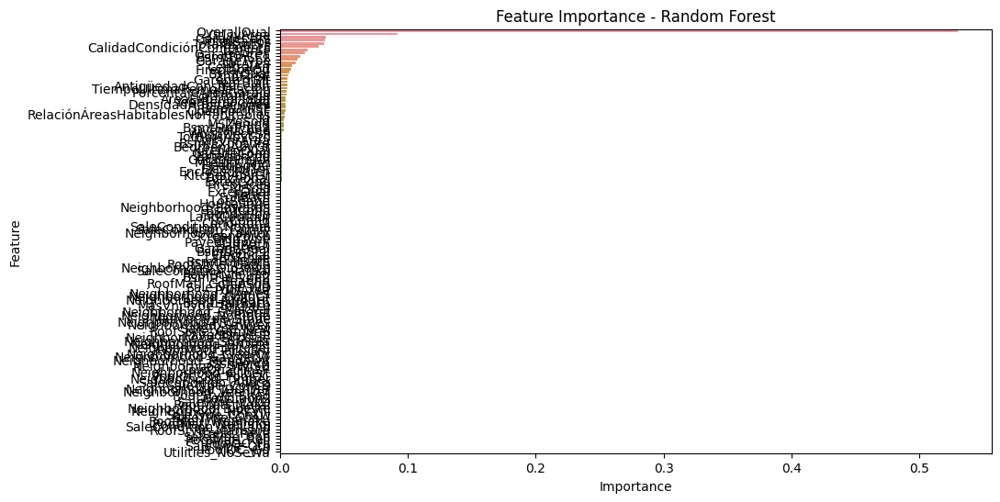

In [ ]:
# Definir el modelo de Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Separar las características (X) y el target (y)
X = df_train_train.drop(columns=['SalePrice', 'SaleDate'])  # Eliminar la columna target y cualquier otra no relevante
y = df_train_train['SalePrice']

# Ajustar el modelo
rf.fit(X, y)

# Obtener la importancia de las características
importances = rf.feature_importances_

# Crear un DataFrame con las características y sus importancias
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})

# Ordenar las características por su importancia
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Graficar la importancia de las características
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance - Random Forest')
plt.show()

## Permutación

**Por qué lo elijo**:
- **Evaluación del impacto de las características en el modelo**: Si ya tengo un modelo entrenado (como Random Forest, XGBoost, o incluso un modelo lineal), la **Permutation Importance** me permitirá ver el impacto de cada característica en el rendimiento del modelo. Si permuto una característica y el rendimiento empeora, significa que esa característica tiene gran importancia.
- **No asume ninguna suposición sobre la distribución de las características**: Esta técnica no asume ninguna relación lineal o no lineal, lo que la hace más general. Las relaciones entre las características pueden ser complejas, y esta técnica no se ve afectada por eso.
- **Explicación del impacto**: Me ayudará a identificar no solo qué variables son importantes, sino también qué variables tienen un impacto más fuerte en la predicción del modelo.

**Cómo lo aplicaré**:
- Después de entrenar un modelo de Random Forest, XGBoost u otro, aplicaré **Permutation Importance** para cuantificar cómo la permutación de cada careterística afecta el re#ndimiento del modelo.

                       Feature    Importance
89                 OverallQual  3.978528e-01
41                   GrLivArea  1.261757e-01
127                TotalBsmtSF  2.850484e-02
17   CalidadCondiciónCompuesta  2.774066e-02
35                  GarageCars  2.153326e-02
..                         ...           ...
123                Street_Pave -3.885984e-08
94                   PoolQC_Gd -1.562921e-07
115               SaleType_Con -3.175468e-07
92                    PoolArea -3.287154e-06
20                  Condition2 -1.239852e-05

[133 rows x 2 columns]


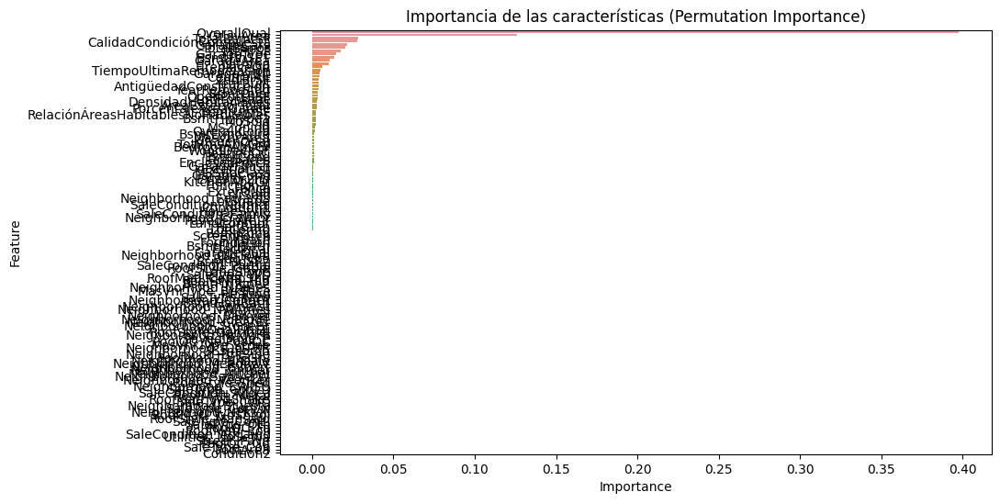

In [ ]:
# Calcular Permutation Importance con el conjunto de columnas no utilizadas
result = permutation_importance(rf, X, y, n_repeats=10, random_state=42, n_jobs=-1)

# Obtener la importancia de las características
importance_df= pd.DataFrame({
    'Feature': X.columns,
    'Importance': result.importances_mean  # Promedio de la disminución en la puntuación
})

# Ordenar por importancia
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Mostrar las importancias
print(importance_df)

# Visualizar la importancia de las características por permutación
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Importancia de las características (Permutation Importance)')
plt.show()


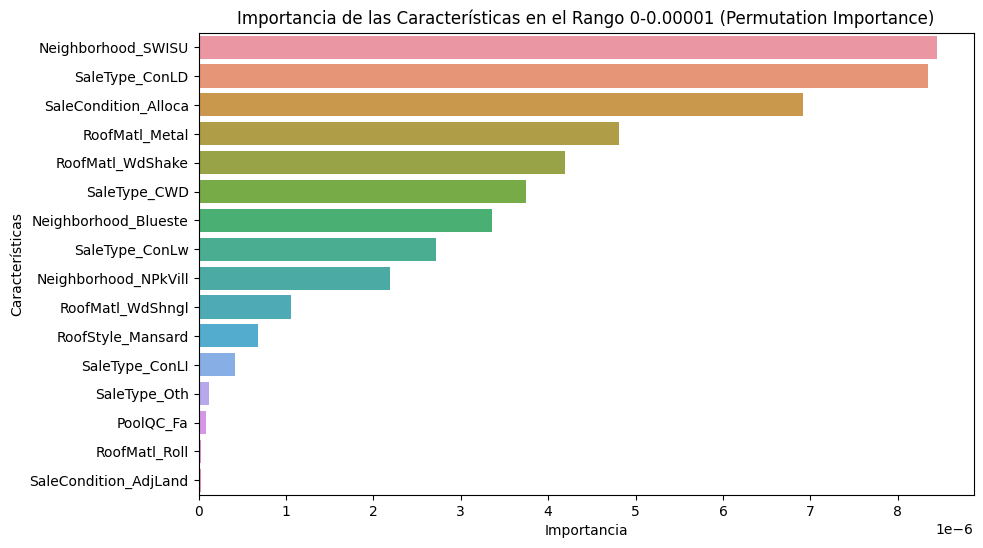

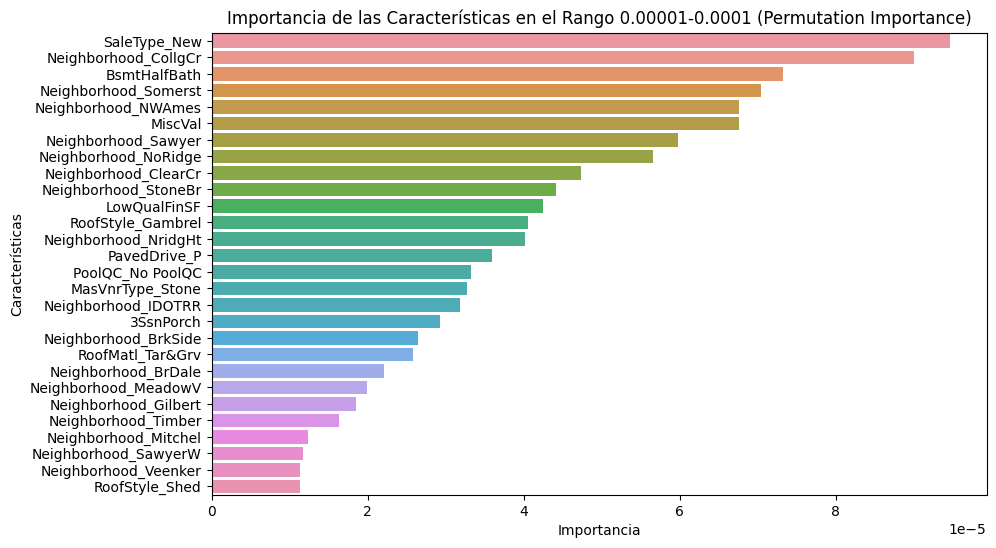

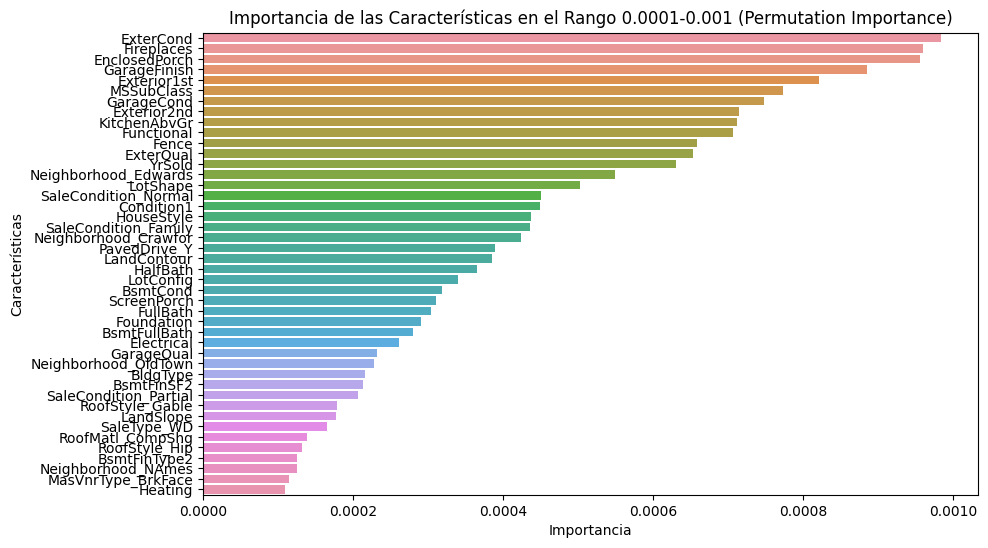

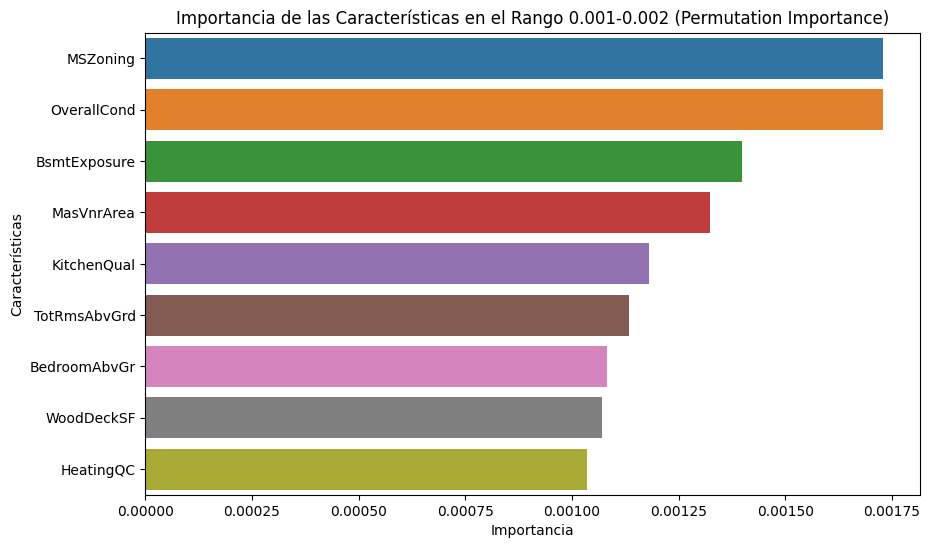

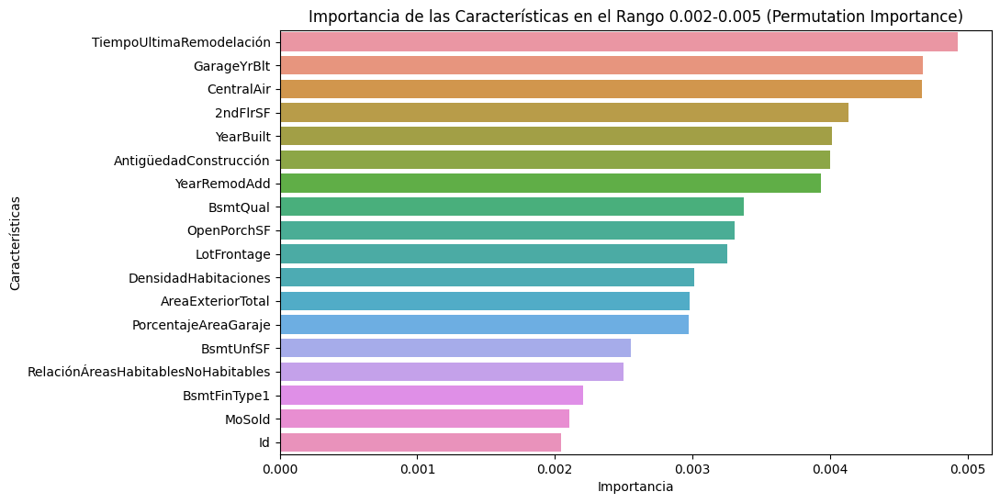

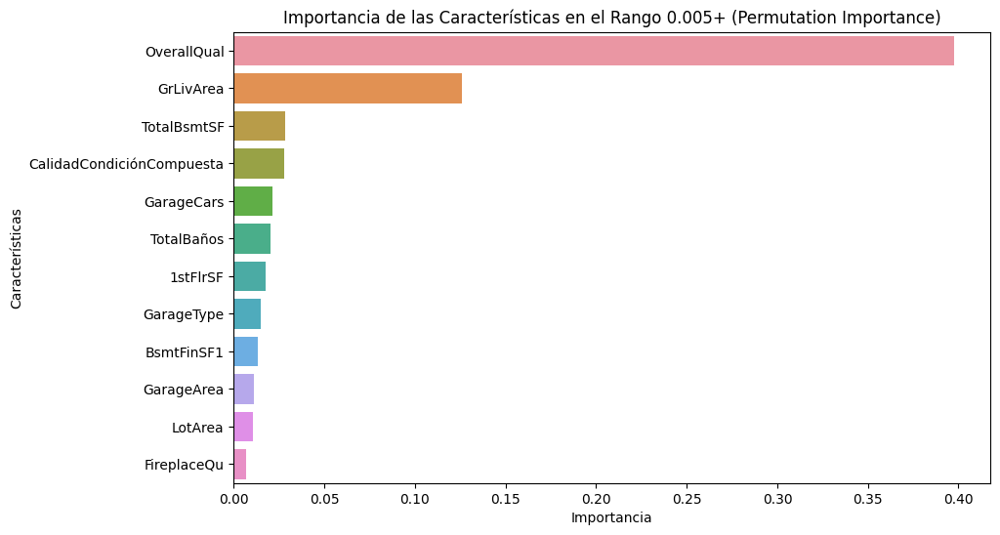

In [75]:
# Ordenar las características por importancia
importance_df_sorted = importance_df.sort_values(by='Importance', ascending=False)

# Definir los rangos de importancia
bins = [0, 0.00001, 0.0001, 0.001, 0.002, 0.005, 1]  # Rango de importancias
labels = ['0-0.00001', '0.00001-0.0001', '0.0001-0.001', '0.001-0.002', '0.002-0.005', '0.005+']

# Crear una nueva columna que contenga el rango correspondiente a cada característica
importance_df_sorted['Importance Range'] = pd.cut(importance_df_sorted['Importance'], bins=bins, labels=labels)

# Crear gráficos por cada rango
for label in labels:
    # Filtrar las características que están en ese rango
    range_df = importance_df_sorted[importance_df_sorted['Importance Range'] == label]
    
    # Verificar si hay características en ese rango
    if not range_df.empty:
        # Crear el gráfico de barras
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=range_df)
        
        # Títulos y etiquetas
        plt.title(f'Importancia de las Características en el Rango {label} (Permutation Importance)')
        plt.xlabel('Importancia')
        plt.ylabel('Características')
        plt.show()

## Matriz Correlación

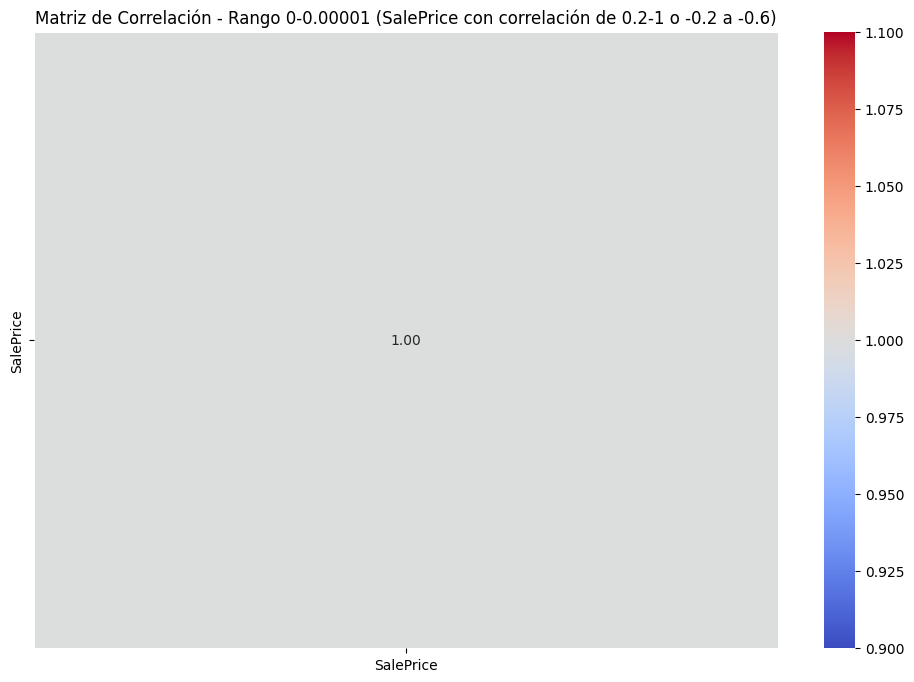

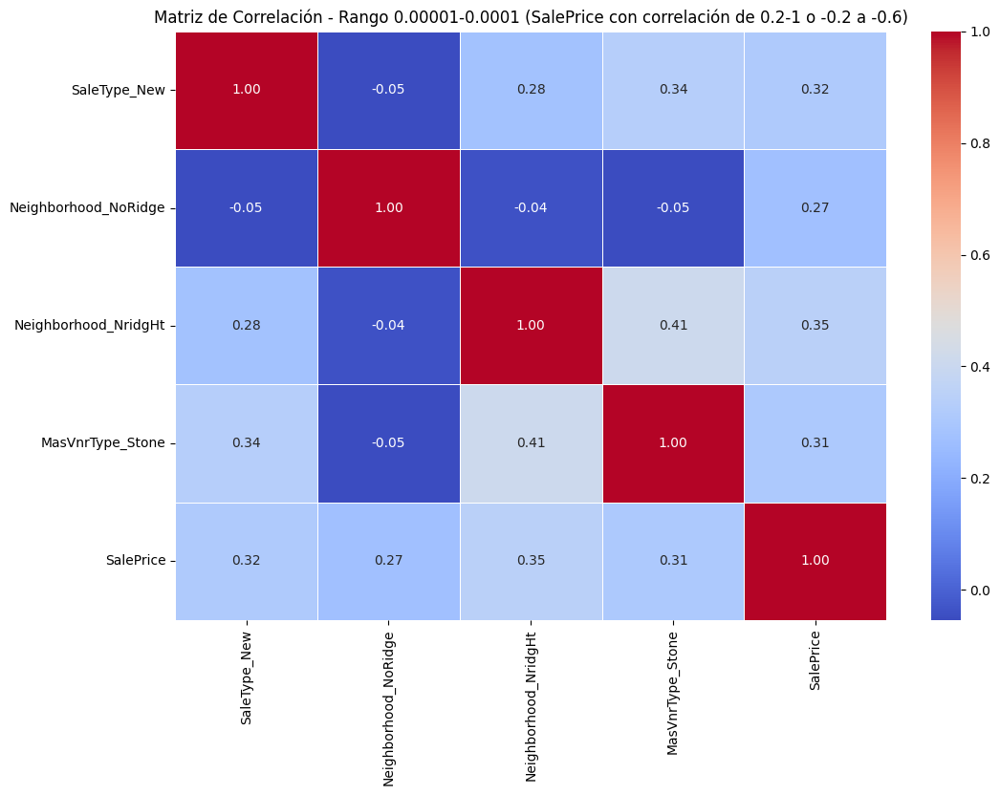

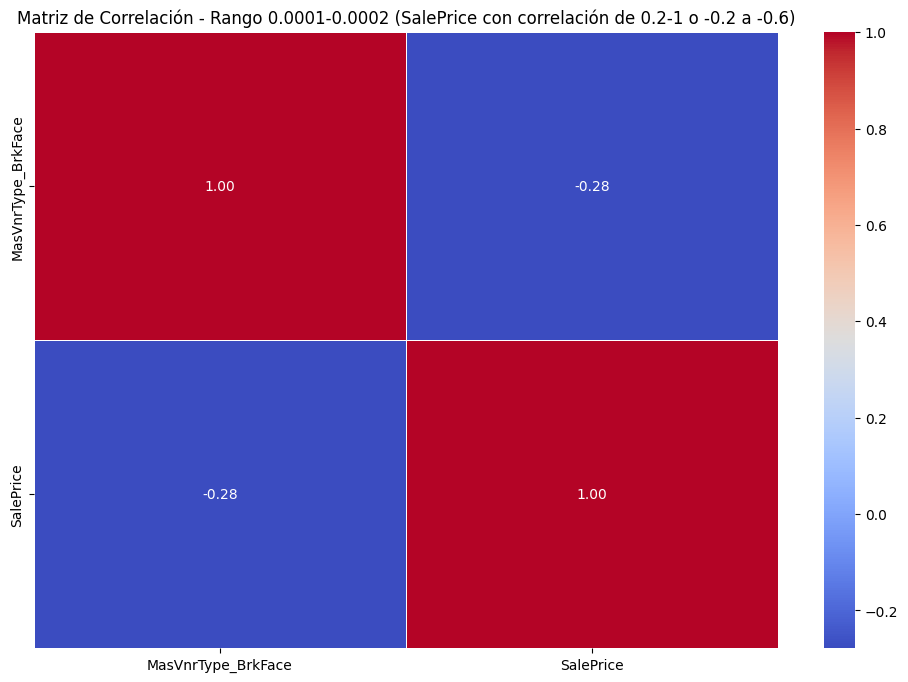

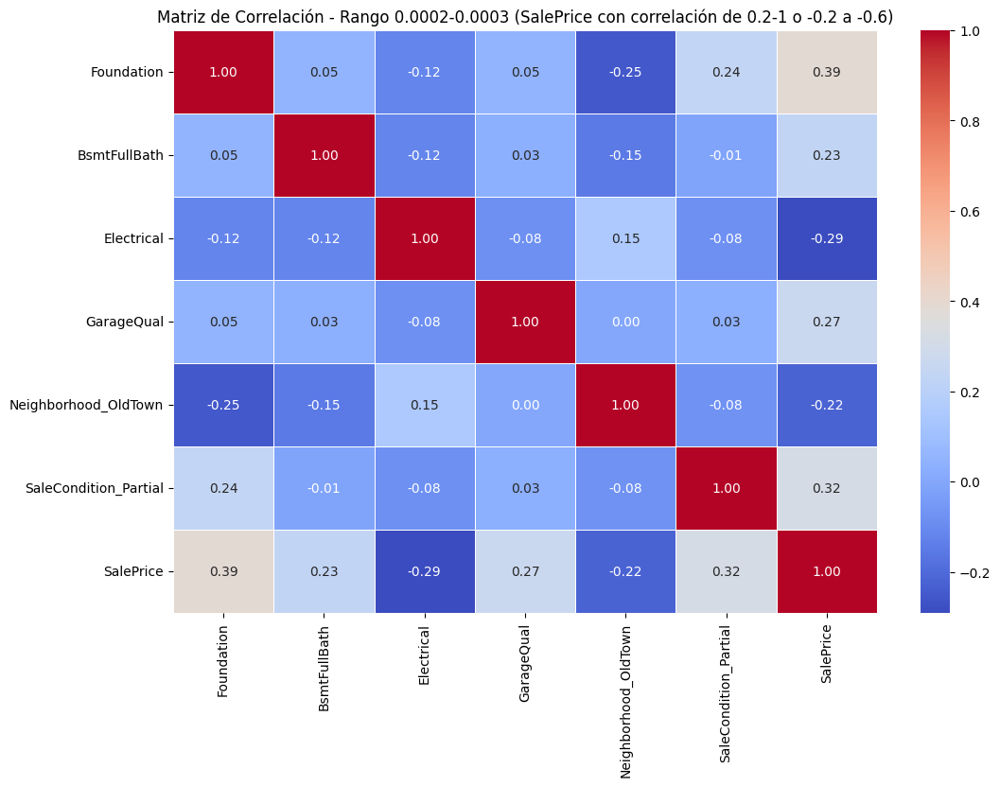

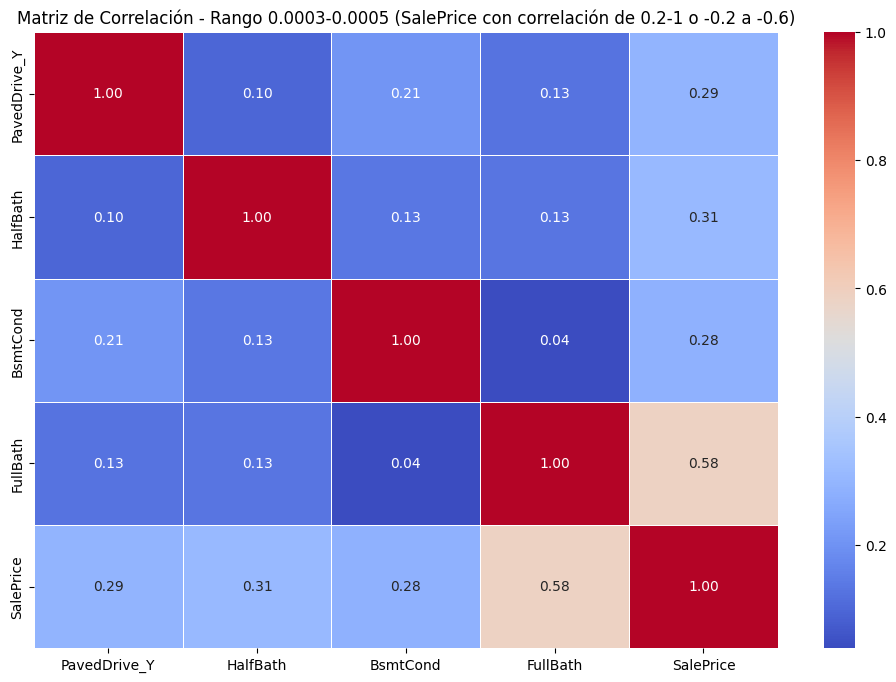

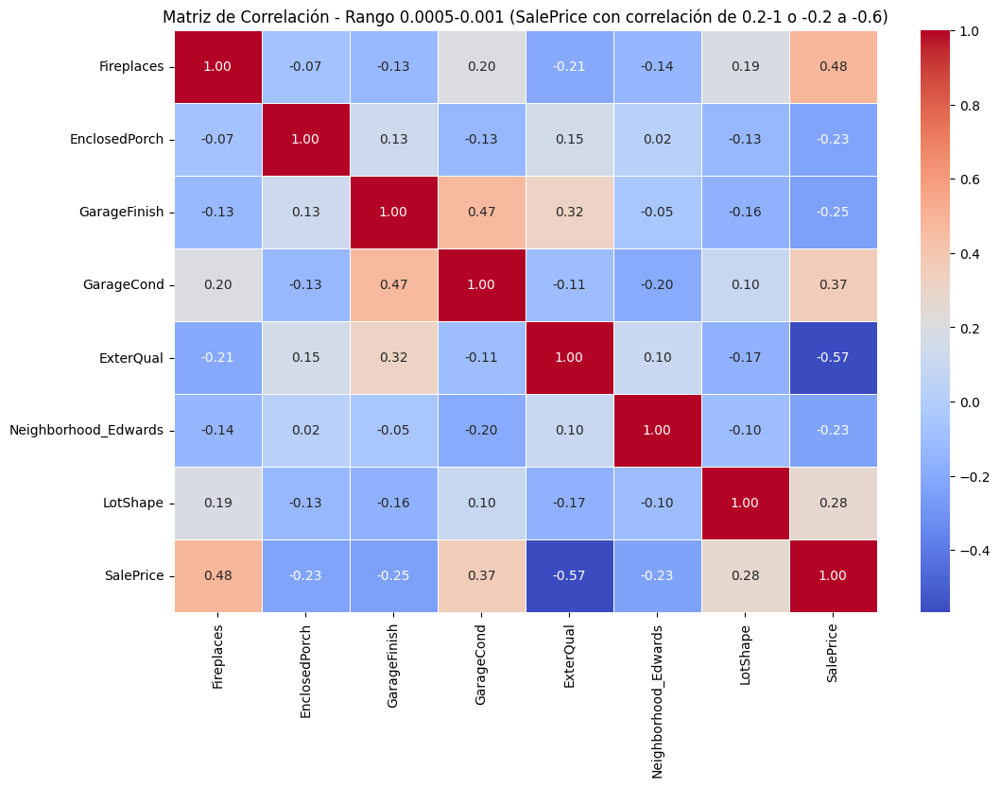

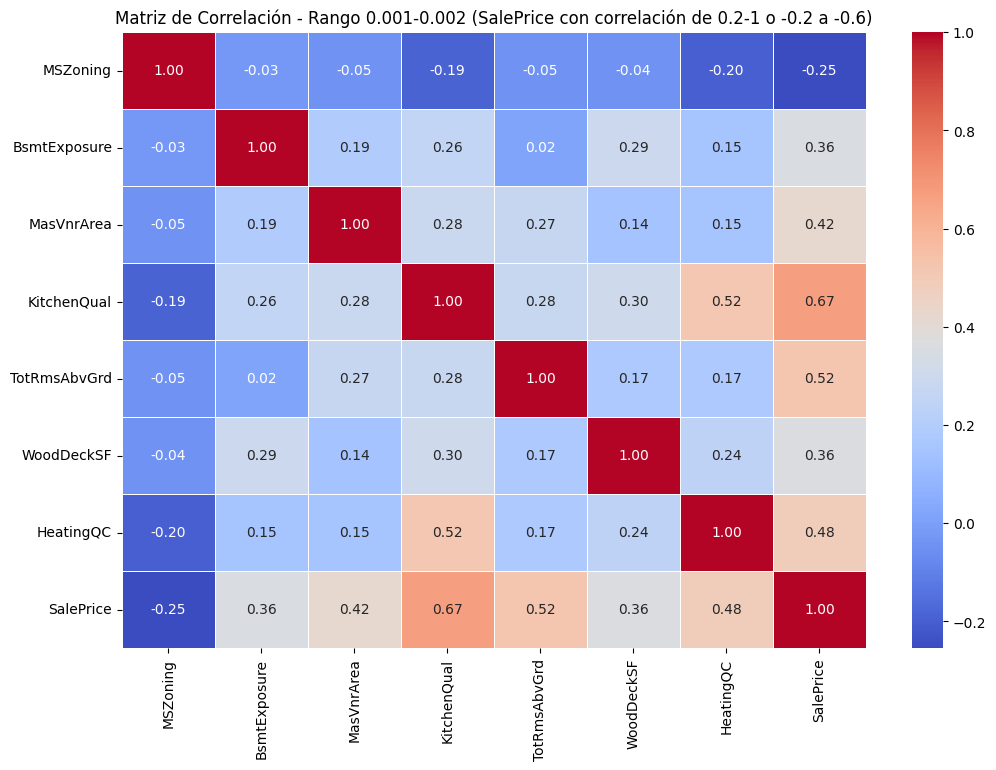

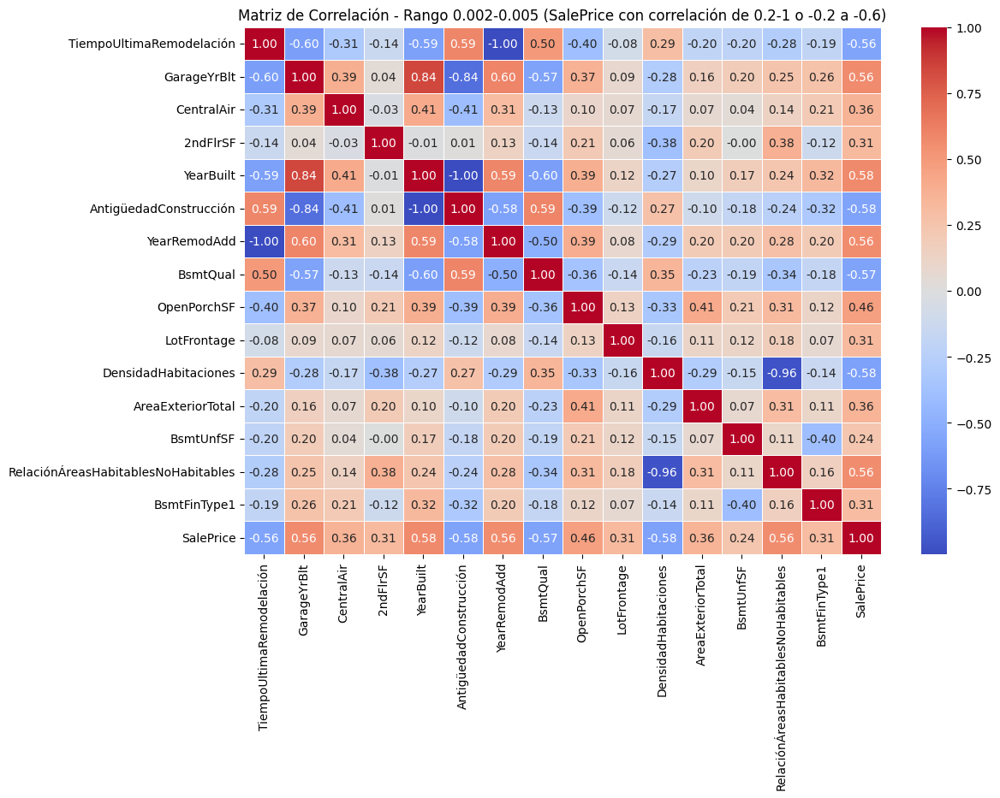

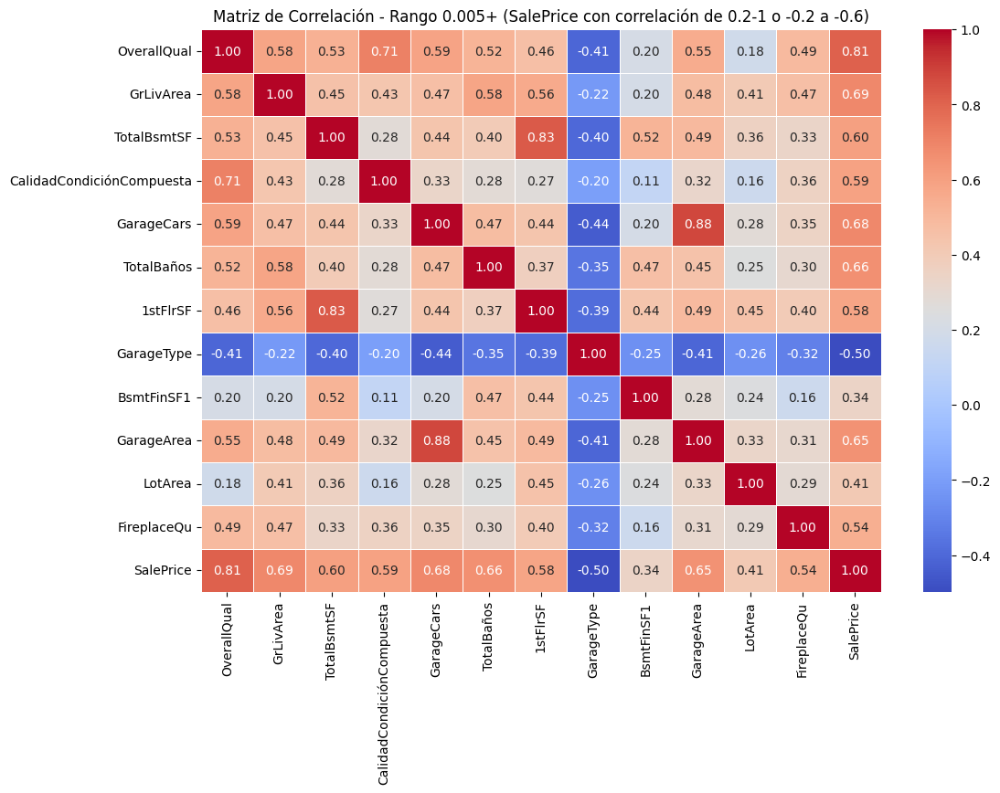

In [76]:
# Definir los rangos de importancia
bins = [0, 0.00001, 0.0001, 0.0002, 0.0003, 0.0005, 0.001, 0.002, 0.005, 1]  # Rango de importancias
labels = ['0-0.00001', '0.00001-0.0001', '0.0001-0.0002', '0.0002-0.0003', '0.0003-0.0005', '0.0005-0.001', '0.001-0.002', '0.002-0.005', '0.005+']

# Crear una nueva columna que contenga el rango correspondiente a cada característica
importance_df_sorted['Importance Range'] = pd.cut(importance_df_sorted['Importance'], bins=bins, labels=labels)

# Lista para almacenar las características que pasan el filtro
selected_features = []
highly_important_features = []  # Lista para las características muy importantes

# Calcular y visualizar la matriz de correlación para cada rango
for label in labels:
    # Filtrar las características que están en ese rango
    range_df = importance_df_sorted[importance_df_sorted['Importance Range'] == label]
    
    # Verificar si hay características en ese rango
    if not range_df.empty:
        # Obtener las características que están en ese rango
        features_in_range = range_df['Feature'].values
        
        # Asegurarse de que 'SalePrice' está en el conjunto de datos
        features_in_range_with_target = list(features_in_range) + ['SalePrice']
        
        # Filtrar el conjunto de datos original por esas características
        X_range = df_train_train[features_in_range_with_target]
        
        # Calcular la matriz de correlación
        correlation_matrix = X_range.corr()

        # Filtrar las columnas cuya correlación con SalePrice esté en el rango de 0.2 a 1 o -0.2 a -0.6
        correlation_with_saleprice = correlation_matrix['SalePrice']
        filtered_columns = correlation_with_saleprice[
            (correlation_with_saleprice >= 0.2) & (correlation_with_saleprice <= 1) | 
            (correlation_with_saleprice <= -0.2) & (correlation_with_saleprice >= -0.6)
        ].index.tolist()

        # Agregar las columnas seleccionadas a la lista
        selected_features.extend(filtered_columns)

        # **Lista para columnas muy correlacionadas con SalePrice (correlación >= 0.6 o <= -0.6)**
        highly_important_columns = correlation_with_saleprice[
            (correlation_with_saleprice >= 0.6) | (correlation_with_saleprice <= -0.6)
        ].index.tolist()
        highly_important_features.extend(highly_important_columns)

        # Filtrar la matriz de correlación para solo incluir las columnas seleccionadas
        filtered_correlation_matrix = correlation_matrix.loc[filtered_columns, filtered_columns]

        # Visualizar la matriz de correlación filtrada
        plt.figure(figsize=(12, 8))
        sns.heatmap(filtered_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
        plt.title(f'Matriz de Correlación - Rango {label} (SalePrice con correlación de 0.2-1 o -0.2 a -0.6)')
        plt.show()

# Eliminar duplicados de las listas de características seleccionadas y muy importantes
selected_features = list(set(selected_features))
highly_important_features = list(set(highly_important_features))


## Escalado

In [77]:
# Escalar los datos antes de PCA
scaler = StandardScaler()

# Excluir una columna por nombre
df_train_train.drop(df_train_train.select_dtypes(include=['datetime']).columns.tolist(), axis=1, inplace=True)
df_sin_una_columna = df_train_train.drop(columns=['SalePrice'])

columnas_escalar = df_sin_una_columna.columns.to_list()

df_train_train[columnas_escalar] = scaler.fit_transform(df_train_train[columnas_escalar])

df_train_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Columns: 134 entries, 1stFlrSF to SalePrice
dtypes: float64(134)
memory usage: 1.2 MB


In [78]:
# Excluir una columna por nombre
df_train_test.drop(df_train_test.select_dtypes(include=['datetime']).columns.tolist(), axis=1, inplace=True)

df_sin_una_columna = df_train_test.drop(columns=['SalePrice'])

columnas_escalar = df_sin_una_columna.columns.to_list()

df_train_test[columnas_escalar] = scaler.transform(df_train_test[columnas_escalar])

df_train_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Columns: 134 entries, 1stFlrSF to SalePrice
dtypes: float64(134)
memory usage: 305.8 KB


In [79]:
df_test.drop(df_test.select_dtypes(include=['datetime']).columns.tolist(), axis=1, inplace=True)

columnas_escalar = df_sin_una_columna.columns.to_list()

df_test[columnas_escalar] = scaler.transform(df_test[columnas_escalar])

df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Columns: 133 entries, 1stFlrSF to YrSold
dtypes: float64(133)
memory usage: 1.5 MB


## Selección Variables

In [80]:
df_train_train_selected = df_train_train[selected_features]
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train_selected.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

# Reorganizar el DataFrame con las columnas ordenadas
df_train_train_selected = df_train_train_selected[sorted_columns]

print(df_train_train_selected.columns)

Index(['1stFlrSF', '2ndFlrSF', 'AntigüedadConstrucción', 'AreaExteriorTotal',
       'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinType1',
       'BsmtFullBath', 'BsmtQual', 'BsmtUnfSF', 'CalidadCondiciónCompuesta',
       'CentralAir', 'DensidadHabitaciones', 'Electrical', 'EnclosedPorch',
       'ExterQual', 'FireplaceQu', 'Fireplaces', 'Foundation', 'FullBath',
       'GarageArea', 'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HeatingQC',
       'KitchenQual', 'LotArea', 'LotFrontage', 'LotShape', 'MSZoning',
       'MasVnrArea', 'MasVnrType_BrkFace', 'MasVnrType_Stone',
       'Neighborhood_Edwards', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'OpenPorchSF', 'OverallQual', 'PavedDrive_Y',
       'RelaciónÁreasHabitablesNoHabitables', 'SaleCondition_Partial',
       'SaleType_New', 'TiempoUltimaRemodelación', 'TotRmsAbvGrd',
       'TotalBaños', 'TotalBsmtSF', 'WoodDeckSF

In [81]:
df_train_test_selected = df_train_test[selected_features]
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train_selected.columns if col != "SalePrice"])

# Añadir SalePrice al final de la lista de columnas
sorted_columns.append("SalePrice")

# Reorganizar el DataFrame con las columnas ordenadas
df_train_test_selected = df_train_test_selected[sorted_columns]

print(df_train_test_selected.columns)

Index(['1stFlrSF', '2ndFlrSF', 'AntigüedadConstrucción', 'AreaExteriorTotal',
       'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinType1',
       'BsmtFullBath', 'BsmtQual', 'BsmtUnfSF', 'CalidadCondiciónCompuesta',
       'CentralAir', 'DensidadHabitaciones', 'Electrical', 'EnclosedPorch',
       'ExterQual', 'FireplaceQu', 'Fireplaces', 'Foundation', 'FullBath',
       'GarageArea', 'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HeatingQC',
       'KitchenQual', 'LotArea', 'LotFrontage', 'LotShape', 'MSZoning',
       'MasVnrArea', 'MasVnrType_BrkFace', 'MasVnrType_Stone',
       'Neighborhood_Edwards', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'OpenPorchSF', 'OverallQual', 'PavedDrive_Y',
       'RelaciónÁreasHabitablesNoHabitables', 'SaleCondition_Partial',
       'SaleType_New', 'TiempoUltimaRemodelación', 'TotRmsAbvGrd',
       'TotalBaños', 'TotalBsmtSF', 'WoodDeckSF

In [82]:
selected_features =  [col for col in df_train_train[selected_features].columns if col != "SalePrice"]
df_test_selected = df_test[selected_features]
# Obtener todas las columnas excepto SalePrice y ordenarlas alfabéticamente
sorted_columns = sorted([col for col in df_train_train_selected.columns if col != "SalePrice"])

# Reorganizar el DataFrame con las columnas ordenadas
df_test_selected = df_test_selected[sorted_columns]

print(df_test_selected.columns)

Index(['1stFlrSF', '2ndFlrSF', 'AntigüedadConstrucción', 'AreaExteriorTotal',
       'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinType1',
       'BsmtFullBath', 'BsmtQual', 'BsmtUnfSF', 'CalidadCondiciónCompuesta',
       'CentralAir', 'DensidadHabitaciones', 'Electrical', 'EnclosedPorch',
       'ExterQual', 'FireplaceQu', 'Fireplaces', 'Foundation', 'FullBath',
       'GarageArea', 'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HeatingQC',
       'KitchenQual', 'LotArea', 'LotFrontage', 'LotShape', 'MSZoning',
       'MasVnrArea', 'MasVnrType_BrkFace', 'MasVnrType_Stone',
       'Neighborhood_Edwards', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'OpenPorchSF', 'OverallQual', 'PavedDrive_Y',
       'RelaciónÁreasHabitablesNoHabitables', 'SaleCondition_Partial',
       'SaleType_New', 'TiempoUltimaRemodelación', 'TotRmsAbvGrd',
       'TotalBaños', 'TotalBsmtSF', 'WoodDeckSF

## PCA

In [83]:
# Crear un nuevo DataFrame sin las columnas especificadas
df_sin_importancia = df_train_train.drop(columns=selected_features)
df_sin_importancia = df_sin_importancia.drop(columns=['SalePrice', 'Id'])  # Asegúrate de quitar 'SalePrice'
columnas_pca = df_sin_importancia.columns
# Verificar que las columnas han sido eliminadas
df_sin_importancia.shape

(1168, 76)

In [84]:
columnas_pca

Index(['3SsnPorch', 'BedroomAbvGr', 'BldgType', 'BsmtFinSF2', 'BsmtFinType2',
       'BsmtHalfBath', 'Condition1', 'Condition2', 'ExterCond', 'Exterior1st',
       'Exterior2nd', 'Fence', 'Functional', 'Heating', 'HouseStyle',
       'KitchenAbvGr', 'LandContour', 'LandSlope', 'LotConfig', 'LowQualFinSF',
       'MSSubClass', 'MiscVal', 'MoSold', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Gilbert',
       'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes',
       'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW',
       'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber',
       'Neighborhood_Veenker', 'OverallCond', 'PavedDrive_P', 'PoolArea',
       'PoolQC_Fa', 'PoolQC_Gd', 'PoolQC_No PoolQC', 'PorcentajeAreaGaraje',
       'Roo

## Método del Codo para Seleccióon de Componentes

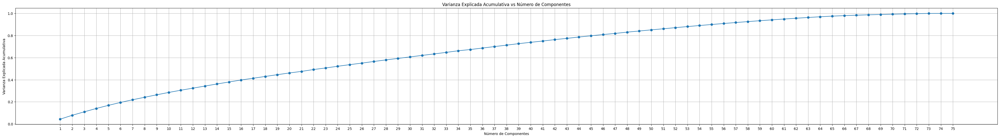

In [85]:
# Almacenar la varianza explicada para elegir el codo
explained_variance = []
components_range = range(1, len(df_sin_importancia.columns))  # Hasta 192 componentes

for n_components in components_range:
    pca = PCA(n_components=n_components)
    pca.fit(df_sin_importancia)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

# Graficar la varianza explicada acumulativa para elegir el codo
plt.figure(figsize=(50, 6))
plt.plot(components_range, explained_variance, marker='o')
plt.title('Varianza Explicada Acumulativa vs Número de Componentes')
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.xticks(components_range)
plt.grid()
plt.show()

In [86]:
# Aplicar PCA
pca = PCA(n_components=22)  # Reducir a 22 dimensiones
pca_result = pca.fit_transform(df_sin_importancia)

columnas_nuevo_df = []
# Crear un DataFrame para los resultados de PCA
for i in range(22):
    columnas_nuevo_df.append(f"PCA_{i}")
    
pca_df = pd.DataFrame(data=pca_result, columns=columnas_nuevo_df)

# Agregar la variable objetivo si es necesario (por ejemplo, SalePrice)
pca_df['SalePrice'] = df_train_train['SalePrice'].values  # Ajusta esto según tu variable objetivo

pca_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 23 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PCA_0      1168 non-null   float64
 1   PCA_1      1168 non-null   float64
 2   PCA_2      1168 non-null   float64
 3   PCA_3      1168 non-null   float64
 4   PCA_4      1168 non-null   float64
 5   PCA_5      1168 non-null   float64
 6   PCA_6      1168 non-null   float64
 7   PCA_7      1168 non-null   float64
 8   PCA_8      1168 non-null   float64
 9   PCA_9      1168 non-null   float64
 10  PCA_10     1168 non-null   float64
 11  PCA_11     1168 non-null   float64
 12  PCA_12     1168 non-null   float64
 13  PCA_13     1168 non-null   float64
 14  PCA_14     1168 non-null   float64
 15  PCA_15     1168 non-null   float64
 16  PCA_16     1168 non-null   float64
 17  PCA_17     1168 non-null   float64
 18  PCA_18     1168 non-null   float64
 19  PCA_19     1168 non-null   float64
 20  PCA_20  

In [87]:
# saber cuánta varianza total explican los 22 componentes: 
# calcular la varianza explicada acumulada, que dará una idea de 
# cuánto de la información original se retiene al reducir las dimensiones:
cumulative_explained_variance = np.cumsum(explained_variance)
print(f"Varianza explicada acumulada con 22 componentes: {cumulative_explained_variance[-1]}")

Varianza explicada acumulada con 22 componentes: 49.612587740678684


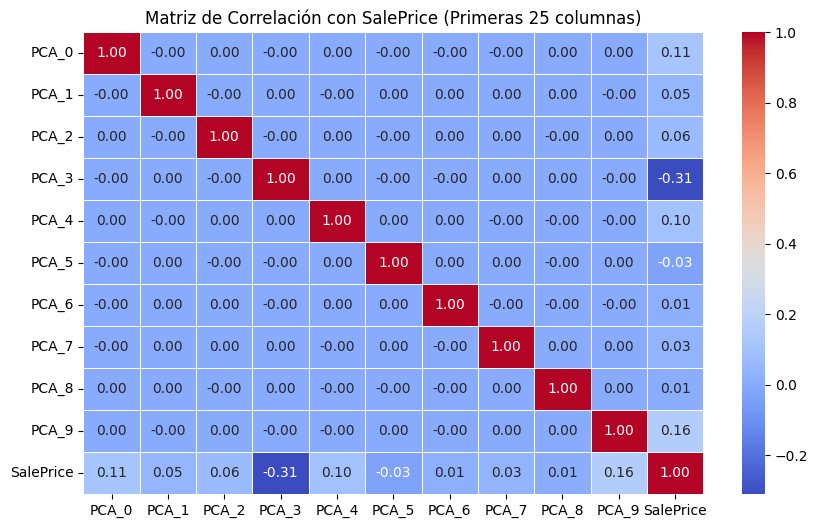

In [88]:
# Seleccionar las primeras 10 columnas (además de SalePrice)
columns_to_select = pca_df.columns[:10].tolist()  # Primeras 10 columnas
columns_to_select.append('SalePrice')  # Añadir SalePrice

# Filtrar el DataFrame solo con las columnas seleccionadas
selected_df = pca_df[columns_to_select]

# Calcular la matriz de correlación
correlation_matrix = selected_df.corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación con SalePrice (Primeras 25 columnas)')
plt.show()

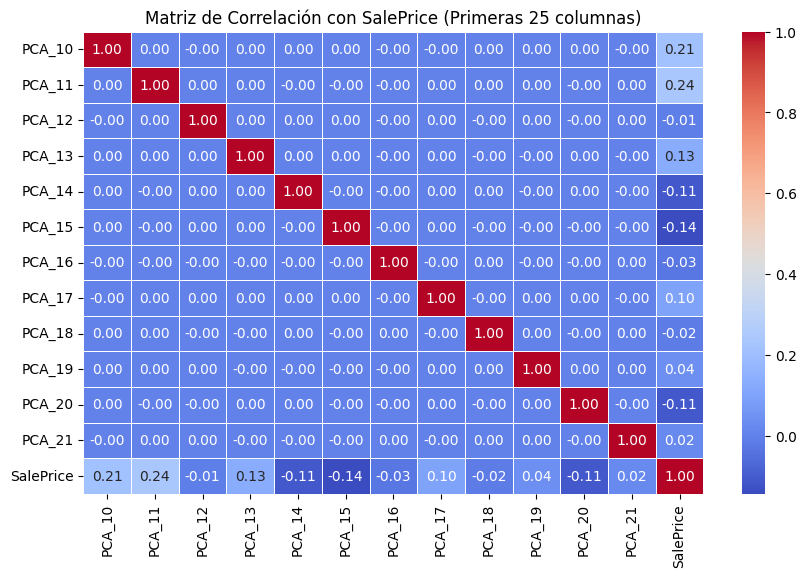

In [89]:
# Seleccionar las siguientes5 columnas (además de SalePrice)
columns_to_select = pca_df.columns[10:].tolist()
#columns_to_select.append('SalePrice')  # Añadir SalePrice

# Filtrar el DataFrame solo con las columnas seleccionadas
selected_df = pca_df[columns_to_select]

# Calcular la matriz de correlación
correlation_matrix = selected_df.corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación con SalePrice (Primeras 25 columnas)')
plt.show()


In [90]:
df_train_train_selected['PCA_3'] = pca_df['PCA_3']
df_train_train_selected['PCA_11'] = pca_df['PCA_11']
df_train_train_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 59 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   1stFlrSF                             1168 non-null   float64
 1   2ndFlrSF                             1168 non-null   float64
 2   AntigüedadConstrucción               1168 non-null   float64
 3   AreaExteriorTotal                    1168 non-null   float64
 4   BsmtCond                             1168 non-null   float64
 5   BsmtExposure                         1168 non-null   float64
 6   BsmtFinSF1                           1168 non-null   float64
 7   BsmtFinType1                         1168 non-null   float64
 8   BsmtFullBath                         1168 non-null   float64
 9   BsmtQual                             1168 non-null   float64
 10  BsmtUnfSF                            1168 non-null   float64
 11  CalidadCondiciónCompuesta     

In [91]:
# Crear un nuevo DataFrame sin las columnas especificadas
df_sin_importancia = df_train_test.drop(columns=selected_features)
df_sin_importancia = df_sin_importancia.drop(columns=['SalePrice', 'Id'])  # Asegúrate de quitar 'SalePrice'

columnas_pca = df_sin_importancia.columns
# Verificar que las columnas han sido eliminadas
df_sin_importancia.shape

(292, 76)

In [92]:
pca_result = pca.transform(df_sin_importancia)

columnas_nuevo_df = []
# Crear un DataFrame para los resultados de PCA
for i in range(22):
    columnas_nuevo_df.append(f"PCA_{i}")
    
pca_df = pd.DataFrame(data=pca_result, columns=columnas_nuevo_df)

# Agregar la variable objetivo si es necesario (por ejemplo, SalePrice)
pca_df['SalePrice'] = df_train_test['SalePrice'].values  # Ajusta esto según tu variable objetivo

pca_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 23 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PCA_0      292 non-null    float64
 1   PCA_1      292 non-null    float64
 2   PCA_2      292 non-null    float64
 3   PCA_3      292 non-null    float64
 4   PCA_4      292 non-null    float64
 5   PCA_5      292 non-null    float64
 6   PCA_6      292 non-null    float64
 7   PCA_7      292 non-null    float64
 8   PCA_8      292 non-null    float64
 9   PCA_9      292 non-null    float64
 10  PCA_10     292 non-null    float64
 11  PCA_11     292 non-null    float64
 12  PCA_12     292 non-null    float64
 13  PCA_13     292 non-null    float64
 14  PCA_14     292 non-null    float64
 15  PCA_15     292 non-null    float64
 16  PCA_16     292 non-null    float64
 17  PCA_17     292 non-null    float64
 18  PCA_18     292 non-null    float64
 19  PCA_19     292 non-null    float64
 20  PCA_20    

In [93]:
df_train_test_selected['PCA_3'] = pca_df['PCA_3']
df_train_test_selected['PCA_11'] = pca_df['PCA_11']
df_train_test_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 59 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   1stFlrSF                             292 non-null    float64
 1   2ndFlrSF                             292 non-null    float64
 2   AntigüedadConstrucción               292 non-null    float64
 3   AreaExteriorTotal                    292 non-null    float64
 4   BsmtCond                             292 non-null    float64
 5   BsmtExposure                         292 non-null    float64
 6   BsmtFinSF1                           292 non-null    float64
 7   BsmtFinType1                         292 non-null    float64
 8   BsmtFullBath                         292 non-null    float64
 9   BsmtQual                             292 non-null    float64
 10  BsmtUnfSF                            292 non-null    float64
 11  CalidadCondiciónCompuesta       

In [94]:
# Crear un nuevo DataFrame sin las columnas especificadas
df_sin_importancia = df_test.drop(columns=selected_features)
df_sin_importancia = df_sin_importancia.drop(columns=['Id'])  # Asegúrate de quitar 'SalePrice'

columnas_pca = df_sin_importancia.columns
# Verificar que las columnas han sido eliminadas
df_sin_importancia.shape

pca_result = pca.transform(df_sin_importancia)

columnas_nuevo_df = []
# Crear un DataFrame para los resultados de PCA
for i in range(22):
    columnas_nuevo_df.append(f"PCA_{i}")
    
pca_df = pd.DataFrame(data=pca_result, columns=columnas_nuevo_df)

pca_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 22 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PCA_0   1459 non-null   float64
 1   PCA_1   1459 non-null   float64
 2   PCA_2   1459 non-null   float64
 3   PCA_3   1459 non-null   float64
 4   PCA_4   1459 non-null   float64
 5   PCA_5   1459 non-null   float64
 6   PCA_6   1459 non-null   float64
 7   PCA_7   1459 non-null   float64
 8   PCA_8   1459 non-null   float64
 9   PCA_9   1459 non-null   float64
 10  PCA_10  1459 non-null   float64
 11  PCA_11  1459 non-null   float64
 12  PCA_12  1459 non-null   float64
 13  PCA_13  1459 non-null   float64
 14  PCA_14  1459 non-null   float64
 15  PCA_15  1459 non-null   float64
 16  PCA_16  1459 non-null   float64
 17  PCA_17  1459 non-null   float64
 18  PCA_18  1459 non-null   float64
 19  PCA_19  1459 non-null   float64
 20  PCA_20  1459 non-null   float64
 21  PCA_21  1459 non-null   float64
dtype

In [95]:
df_test_selected['PCA_3'] = pca_df['PCA_3']
df_test_selected['PCA_11'] = pca_df['PCA_11']
df_test_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 58 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   1stFlrSF                             1459 non-null   float64
 1   2ndFlrSF                             1459 non-null   float64
 2   AntigüedadConstrucción               1459 non-null   float64
 3   AreaExteriorTotal                    1459 non-null   float64
 4   BsmtCond                             1459 non-null   float64
 5   BsmtExposure                         1459 non-null   float64
 6   BsmtFinSF1                           1459 non-null   float64
 7   BsmtFinType1                         1459 non-null   float64
 8   BsmtFullBath                         1459 non-null   float64
 9   BsmtQual                             1459 non-null   float64
 10  BsmtUnfSF                            1459 non-null   float64
 11  CalidadCondiciónCompuesta     

# **MODELADO**

In [96]:
y_train_escaled = scaler.fit_transform(df_train_train_selected[["SalePrice"]])
y_train_escaled.shape

(1168, 1)

In [97]:
y_test_escaled = scaler.transform(df_train_test_selected[["SalePrice"]])
y_test_escaled.shape

(292, 1)

In [98]:
# Convertir y_test_escaled a DataFrame (si no lo es ya)
y_train = pd.DataFrame(y_test_escaled, columns=["SalePrice"])
# Convertir y_train_escaled en un DataFrame
y_train_escaled_df = pd.DataFrame(y_train_escaled, columns=["SalePrice"])

y_train = pd.concat([y_train, y_train_escaled_df], axis=0, ignore_index=True)
y_train.shape


(1460, 1)

In [99]:
# Eliminar la columna 'SalePrice' del DataFrame para obtener solo las características (X)
X_train_train = df_train_train_selected.drop(columns=["SalePrice"])

# Verificar la forma del nuevo DataFrame
print(X_train_train.shape)


(1168, 58)


In [100]:
X_train_test = df_train_test_selected.drop(columns=["SalePrice"])
X_train_test.shape

(292, 58)

In [101]:
X_train = df_train_train_selected.drop(columns=["SalePrice"]).copy()
X_train = pd.concat([X_train, df_train_test_selected], axis=0, ignore_index=True).drop(columns=["SalePrice"])
X_train.shape

(1460, 58)

In [102]:
# Función para evaluar el modelo y mostrar métricas
def evaluate_model(model, model_name, X_train, y_train, X_test, y_test, predictions_df):
    print(f"Entrenando el modelo: {model_name}...")

    model.fit(X_train, y_train)  # Entrenar el modelo
    
    # Hacer las predicciones
    #y_pred = model.predict(X_test)

    # Predecir sobre los datos de prueba
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Asegúrate de que predictions_df tenga el mismo índice que X_test
    predictions_df = predictions_df.copy()
    # Añadir las predicciones como una nueva columna en el DataFrame
    predictions_df[model_name] = y_pred_test  # Aquí se añade la predicción al DataFrame
    
    # Calcular las métricas para el conjunto de entrenamiento
    rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
    r2_train = r2_score(y_train, y_pred_train)
    
    # Calcular las métricas para el conjunto de prueba
    rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
    r2_test = r2_score(y_test, y_pred_test)
    
    # Almacenar las métricas en un diccionario
    metrics = {
        'Model': model_name,
        'Train RMSE': rmse_train,
        'Train R²': r2_train,
        'Test RMSE': rmse_test,
        'Test R²': r2_test
    }

    try: # Graficar predicciones vs valores reales
        plot_pred_vs_real(y_test, y_pred_test, model_name)
    except:
        pass
    try:
    # Graficar residuos
        plot_residuals(y_test, y_pred_test, model_name)
    except:
        pass
    return metrics, predictions_df
    
def plot_comparison(metrics_df):
    metrics_df.set_index('Model', inplace=True)
    
    # Gráfico de RMSE
    plt.figure(figsize=(10, 6))
    sns.barplot(x=metrics_df.index, y='Test RMSE', data=metrics_df, color='skyblue')
    plt.title('Comparación de Modelos: RMSE en Test')
    plt.ylabel('RMSE')
    plt.xticks(rotation=45)
    plt.show()
    
    # Gráfico de R²
    plt.figure(figsize=(10, 6))
    sns.barplot(x=metrics_df.index, y='Test R²', data=metrics_df, color='salmon')
    plt.title('Comparación de Modelos: R² en Test')
    plt.ylabel('R²')
    plt.xticks(rotation=45)
    plt.show()

def plot_residuals(y_true, y_pred, model_name):
    residuals = y_true - y_pred
    plt.figure(figsize=(8, 6))
    plt.scatter(y_pred, residuals, alpha=0.5, color='blue')
    plt.axhline(y=0, color='red', linestyle='--', lw=2)
    plt.title(f'{model_name}: Residuos vs Predicciones')
    plt.xlabel('Predicción')
    plt.ylabel('Residuo')
    plt.show()

def plot_pred_vs_real(y_true, y_pred, model_name):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_true, y_pred, alpha=0.5, color='blue')
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], color='red', lw=2)
    plt.title(f'{model_name}: Predicción vs Real')
    plt.xlabel('Valor Real')
    plt.ylabel('Predicción')
    plt.show()

Entrenando el modelo: Linear Regression...


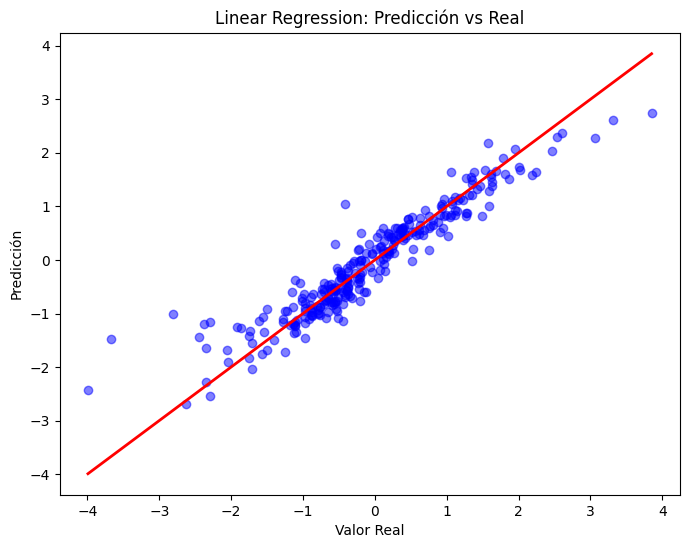

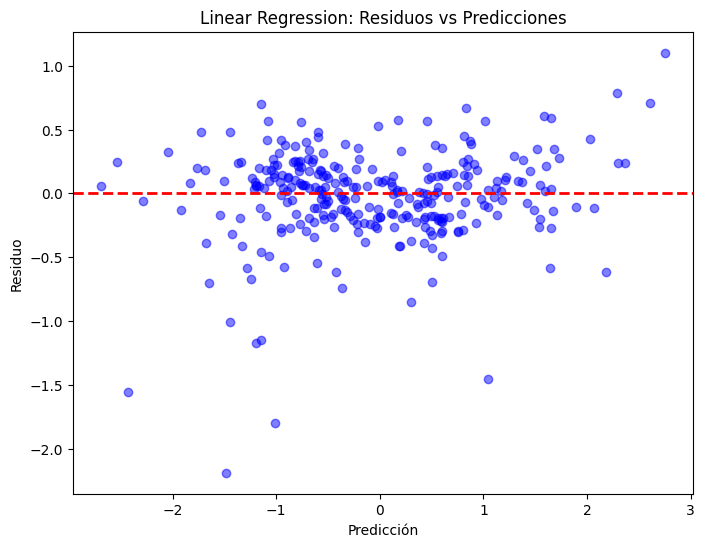

Entrenando el modelo: Lasso Regression...


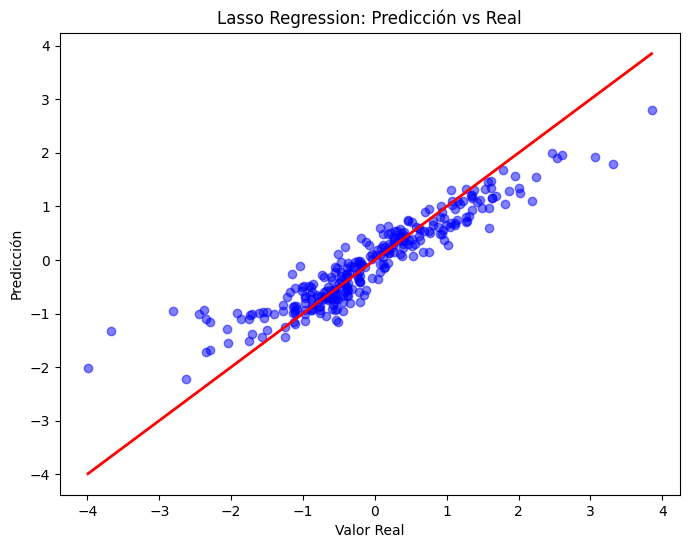

Entrenando el modelo: Ridge Regression...


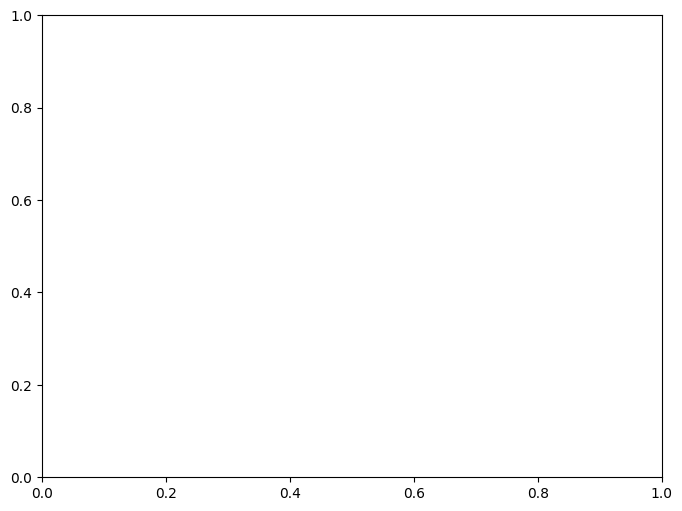

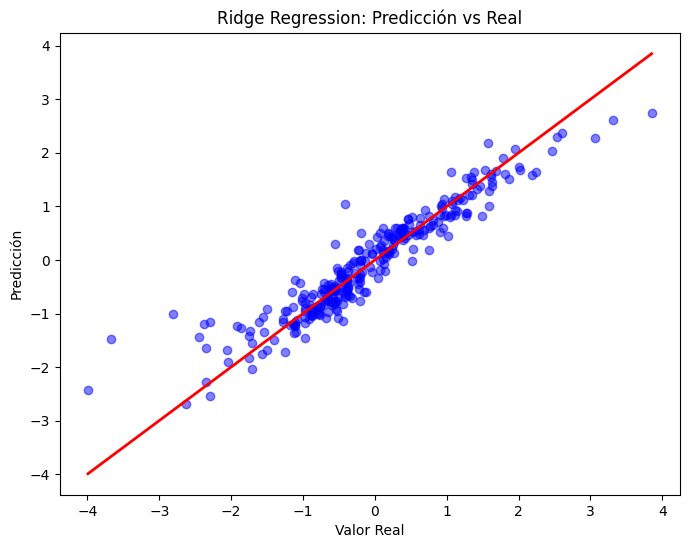

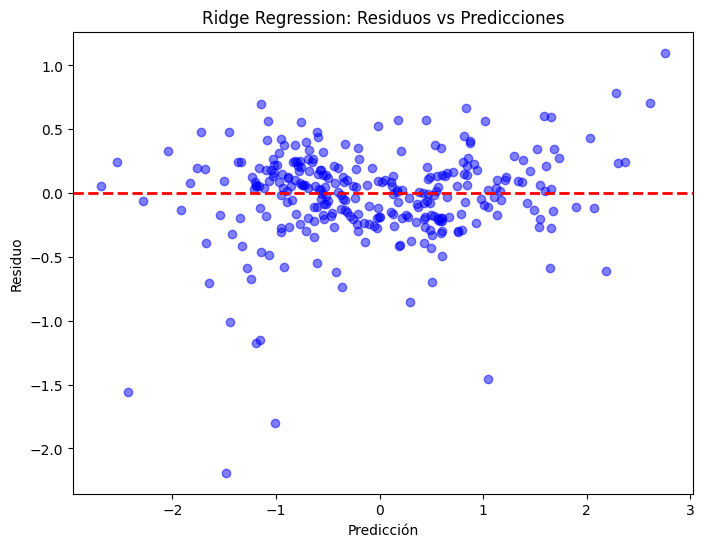

Entrenando el modelo: Decision Tree...


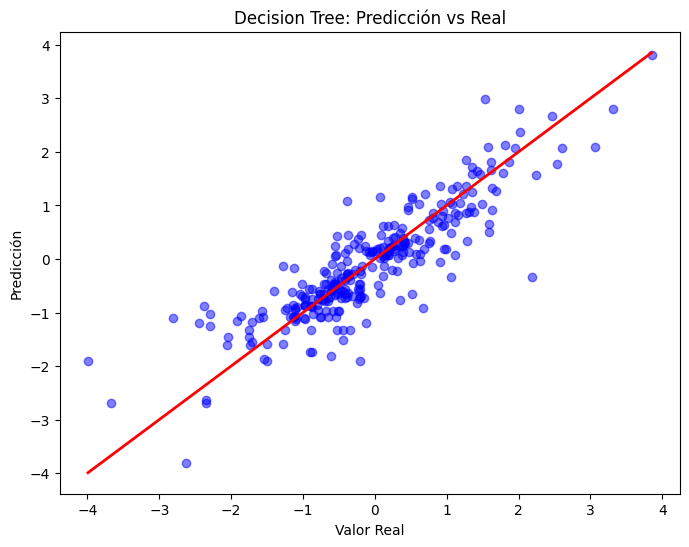

Entrenando el modelo: Random Forest...


/tmp/ipykernel_30/1969707786.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)  # Entrenar el modelo


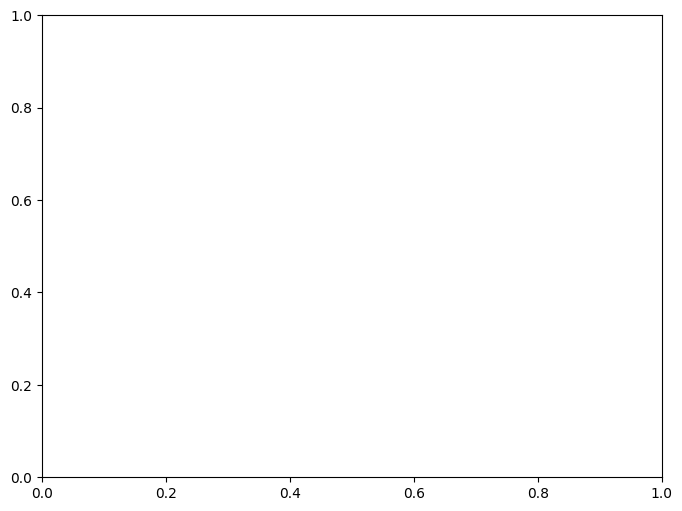

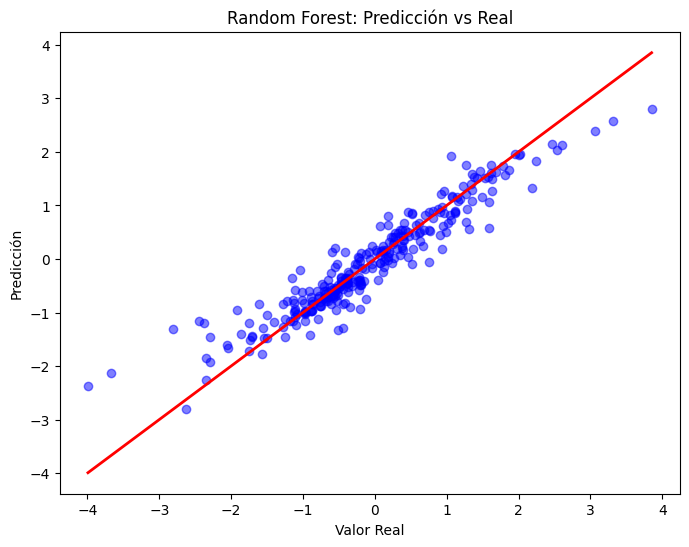

Entrenando el modelo: Gradient Boosting...


/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


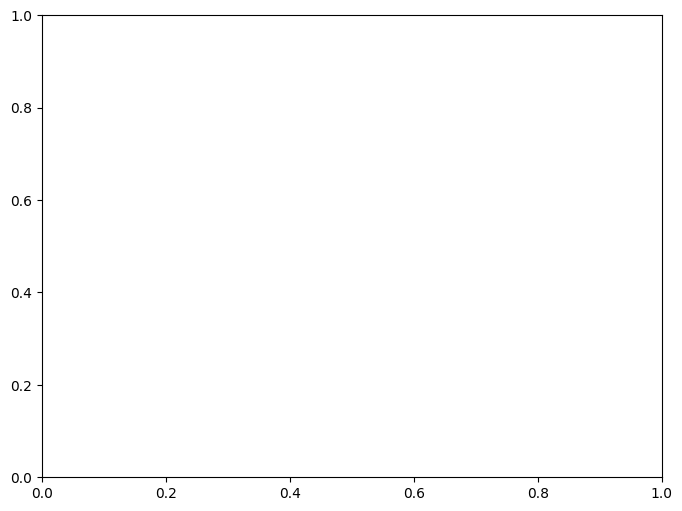

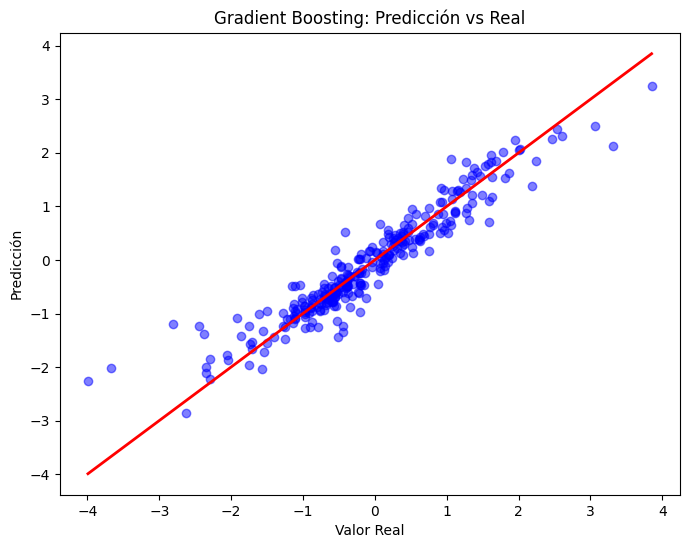

Entrenando el modelo: KNN...


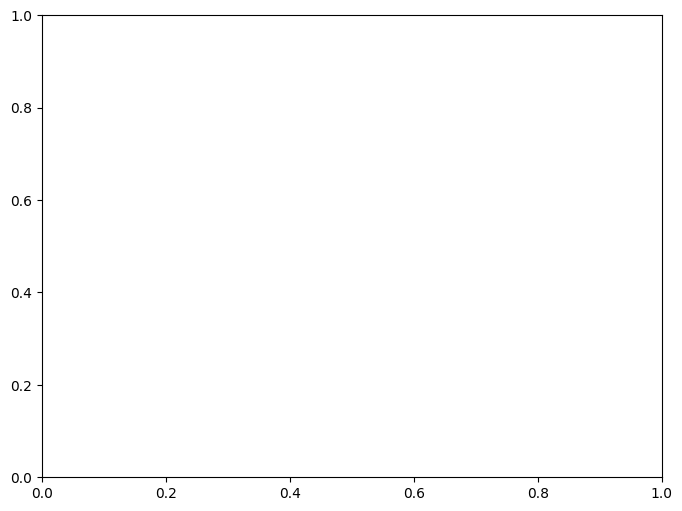

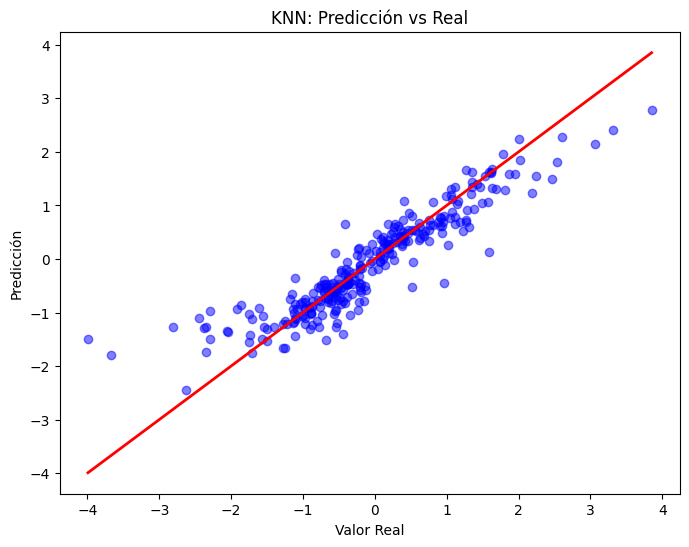

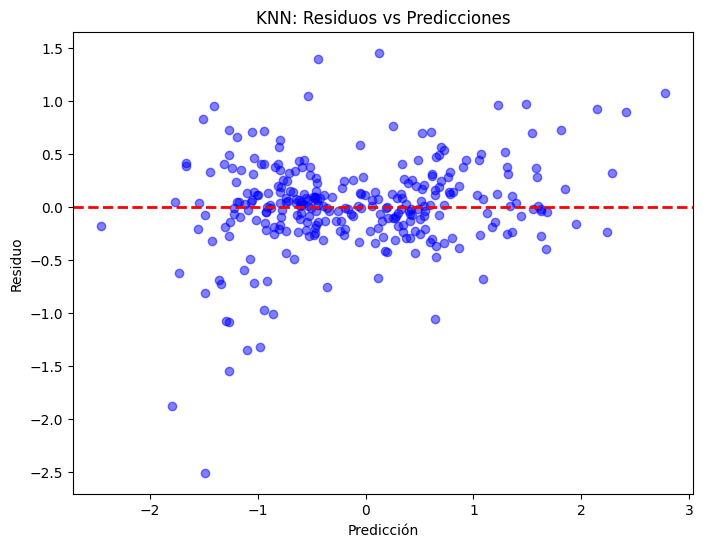

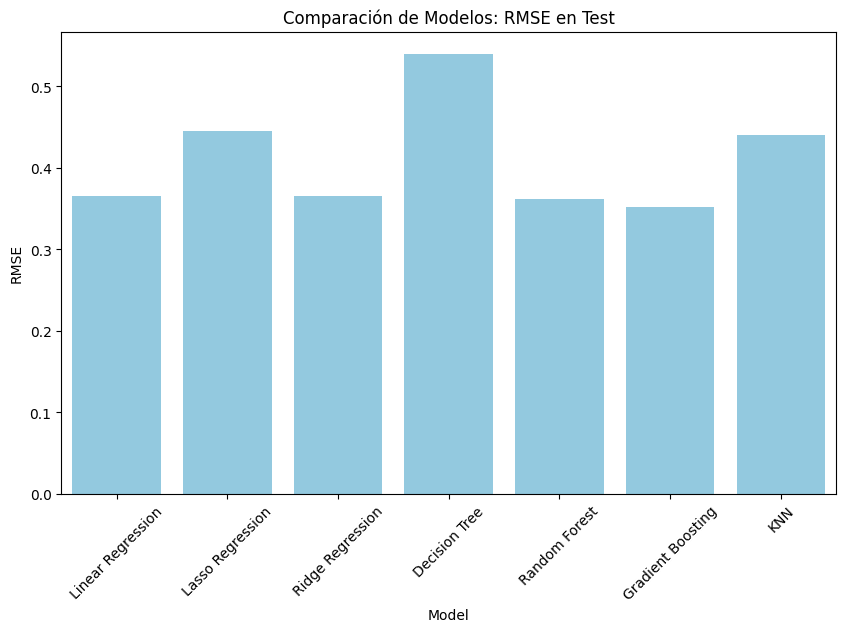

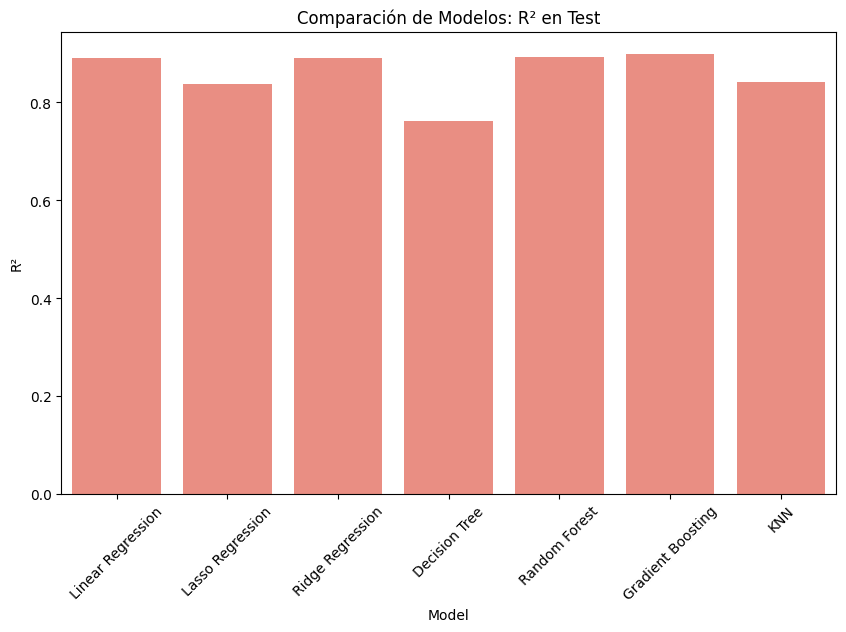

In [103]:
# Lista de modelos
models = [
    ('Linear Regression', LinearRegression()),
    ('Lasso Regression', Lasso(alpha=0.1)),
    ('Ridge Regression', Ridge(alpha=0.1)),
    ('Decision Tree', DecisionTreeRegressor(random_state=42)),
    ('Random Forest', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('Gradient Boosting', GradientBoostingRegressor(n_estimators=100, random_state=42)),
    ('KNN', KNeighborsRegressor(n_neighbors=5))
]

# Lista para almacenar las métricas de los modelos
metrics_list = []

# Crear un DataFrame vacío para almacenar las predicciones
predictions_df = pd.DataFrame(index=X_train_test.index)  # Asegurarse de que tenga el mismo índice que X_test


# Evaluar cada modelo y agregar las métricas a la lista
for model_name, model in models:
    # Evaluar el modelo y agregar las métricas
    metrics, predictions_df = evaluate_model(model, model_name, X_train_train, y_train_escaled, X_train_test, y_test_escaled, predictions_df)
    metrics_list.append(metrics)

# Crear un DataFrame con las métricas de los modelos
metrics_df = pd.DataFrame(metrics_list)

# Mostrar el DataFrame con las métricas
# Graficar comparación de modelos
plot_comparison(metrics_df)

In [104]:
metrics_df

,Train RMSE,Train R²,Test RMSE,Test R²
Model,,,,
Linear Regression,0.325645,0.893955,0.365653,0.890779
Lasso Regression,0.407014,0.834340,0.444904,0.838304
Ridge Regression,0.325646,0.893955,0.365700,0.890750
Decision Tree,0.000000,1.000000,0.539942,0.761843
Random Forest,0.133308,0.982229,0.361751,0.893097
Gradient Boosting,0.206598,0.957317,0.351986,0.898791
KNN,0.337614,0.886017,0.440291,0.841639


## Evaluación detallada (falta)

## Búsqueda de parámetros (falta)

## Validación cruzada (falta)

## Predicciones

In [105]:

# Mostrar el DataFrame con las predicciones de cada modelo
predictions_df


,Linear Regression,Lasso Regression,Ridge Regression,Decision Tree,Random Forest,Gradient Boosting,KNN
0,-0.311959,-0.402990,-0.312274,-0.220121,-0.480968,-0.422865,-0.519426
1,1.656385,1.193827,1.656640,1.264915,1.629527,1.843401,1.313511
2,-0.954782,-0.709343,-0.954074,-0.876173,-0.980693,-0.971315,-1.098656
3,-0.017397,-0.137963,-0.017922,0.249612,-0.195977,-0.250115,-0.514185
4,1.597615,1.474453,1.597842,1.653066,1.609750,1.966217,1.629377
...,...,...,...,...,...,...,...
287,-1.148627,-0.986984,-1.149297,-1.093563,-0.832139,-1.014348,-0.915109
288,0.942109,0.696100,0.941871,0.693397,0.858871,0.870234,1.352795
289,0.598506,0.543318,0.598694,-0.220121,0.190480,0.232679,0.325672
290,-1.195765,-0.854726,-1.195328,-0.162564,-0.825805,-0.829809,-1.179233


In [502]:
# Lista para almacenar las métricas de los modelos
metrics_list = []

# Crear un DataFrame vacío para almacenar las predicciones
predictions_df = pd.DataFrame(index=df_test_selected.index)  # Asegurarse de que tenga el mismo índice que X_test



# Evaluar cada modelo y agregar las métricas a la lista
for model_name, model in models:
    # Evaluar el modelo y agregar las métricas
    model.fit(X_train, y_train)  # Entrenar el modelo
    
    # Hacer las predicciones
    y_pred = model.predict(df_test_selected)
    predictions_df[f"{model}"] = y_pred
    metrics_list.append(metrics)

/tmp/ipykernel_30/3900426042.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)  # Entrenar el modelo
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [503]:
for i in predictions_df.columns:
    df_test_selected[f"{i}"] = scaler.inverse_transform(predictions_df[[i]])

In [504]:
df_test_selected.head()

,1stFlrSF,2ndFlrSF,AntigüedadConstrucción,AreaExteriorTotal,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtFullBath,BsmtQual,...,YearRemodAdd,PCA_3,PCA_11,LinearRegression(),Lasso(alpha=0.1),Ridge(alpha=0.1),DecisionTreeRegressor(random_state=42),RandomForestRegressor(random_state=42),GradientBoostingRegressor(random_state=42),KNeighborsRegressor()
0,-0.707238,-0.801923,0.395806,-0.178968,0.110144,-0.587727,0.047891,0.228430,-0.818694,0.995666,...,-1.153060,-1.167209,-1.429236,11.965842,12.024057,11.965967,12.332710,12.122273,11.988644,12.103169
1,0.413044,-0.801923,0.493557,1.711122,0.110144,-0.587727,1.039448,0.704869,-0.818694,0.995666,...,-1.297812,-1.866917,-3.750254,11.948567,12.024057,11.948720,11.302217,11.982726,11.987757,11.786864
2,-0.624446,0.793497,-0.777216,0.514283,0.110144,-0.587727,0.751787,1.181308,-0.818694,-0.566373,...,0.632217,-0.269094,0.495788,12.033305,12.024057,12.033426,13.521141,11.982733,12.019241,11.794590
3,-0.629621,0.741151,-0.809800,1.495298,0.110144,-0.587727,0.339910,1.181308,-0.818694,0.995666,...,0.632217,-0.426187,0.888901,11.992966,12.024057,11.993106,11.418626,12.041652,11.972123,11.990878
4,0.286268,-0.801923,-0.614297,-0.558294,0.110144,-0.587727,-0.398854,0.704869,-0.818694,-0.566373,...,0.342712,0.417164,-1.564247,11.971516,12.024057,11.971678,11.976666,12.089704,12.104947,12.016940


## Análisis de Resultados (falta)

In [370]:
df_test_selected

array([[11.75452507, 11.71755651, 12.18519617, ..., 12.11855499,
        12.07085299, 12.10316884],
       [12.19192674, 11.71755651, 12.22336228, ..., 12.00584601,
        12.00857681, 11.86391541],
       [11.78685037, 12.34047044, 11.72720293, ..., 11.9713658 ,
        12.03651471, 11.79459003],
       ...,
       [12.08585936, 11.71755651, 12.14703007, ..., 11.98712781,
        12.05751658, 12.16156376],
       [11.82927732, 11.71755651, 11.73992497, ..., 12.13807088,
        12.03989538, 11.86726382],
       [11.85554162, 12.60971854, 11.72720293, ..., 12.11082526,
        11.95738667, 12.27551442]])

In [505]:
df_test_selected.columns

Index(['1stFlrSF', '2ndFlrSF', 'AntigüedadConstrucción', 'AreaExteriorTotal',
       'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinType1',
       'BsmtFullBath', 'BsmtQual', 'BsmtUnfSF', 'CalidadCondiciónCompuesta',
       'CentralAir', 'DensidadHabitaciones', 'Electrical', 'EnclosedPorch',
       'ExterQual', 'FireplaceQu', 'Fireplaces', 'Foundation', 'FullBath',
       'GarageArea', 'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HeatingQC',
       'KitchenQual', 'LotArea', 'LotFrontage', 'LotShape', 'MSZoning',
       'MasVnrArea', 'MasVnrType_BrkFace', 'MasVnrType_Stone',
       'Neighborhood_Edwards', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'OpenPorchSF', 'OverallQual', 'PavedDrive_Y',
       'RelaciónÁreasHabitablesNoHabitables', 'SaleCondition_Partial',
       'SaleType_New', 'TiempoUltimaRemodelación', 'TotRmsAbvGrd',
       'TotalBaños', 'TotalBsmtSF', 'WoodDeckSF

In [506]:
highly_important_features

['SalePrice',
 'GrLivArea',
 'OverallQual',
 'GarageArea',
 'KitchenQual',
 'TotalBaños',
 'GarageCars']